# Task 0: Load model

In [1]:
from TransformerBeta import *
import torch.nn as nn
import numpy as np
import os
import matplotlib.pyplot as plt

In [2]:
# 0.1 load the model
model_path = "model_M_23Apr10_0108PM" # <------------------------------------------------------------------------change

query_size, key_size, value_size, num_hiddens = 512, 512, 512, 512
num_layers, dropout = 6, 0.2
lr, training_steps, batch_size, label_smoothing = 0.0004, 300000, 4096, 0.1
ffn_num_input, ffn_num_hiddens, num_heads = 512, 2048, 8

norm_shape = [512] # 512 corresponds to the dim of such number to normalize
device = d2l.try_gpu()

encoder_standard = TransformerEncoder(
	len(amino_dict), key_size, query_size, value_size, num_hiddens, 
	norm_shape, ffn_num_input, ffn_num_hiddens, num_heads,
	num_layers, dropout)
decoder_standard = TransformerDecoder(
	len(amino_dict), key_size, query_size, value_size, num_hiddens, 
	norm_shape, ffn_num_input, ffn_num_hiddens, num_heads,
	num_layers, dropout, shared_embedding=encoder_standard.embedding)
model_standard = EncoderDecoder(encoder_standard, decoder_standard)

model_standard_total_params = sum(p.numel() for p in model_standard.parameters())
model_standard_total_trainable_params = sum(p.numel() for p in model_standard.parameters() if p.requires_grad)

state_dict = torch.load(model_path,map_location=('cpu'))
from collections import OrderedDict
new_state_dict = OrderedDict()
for k, v in state_dict.items():
	name = k[7:] #remove 'module'
	new_state_dict[name] = v

model_standard.load_state_dict(new_state_dict)

model_use = model_standard # <------------------------------------------------------------------------change
prediction_length = 8 # <------------------------------------------------------------------------change

# 0.2 create a txt file to record the results
if not os.path.exists('model_evaluation'):
	os.mkdir('model_evaluation')
print('Standard model: total number of parameters: {}'.format(model_standard_total_params))
print('Standard model: total number of trainable parameters: {}'.format(model_standard_total_trainable_params))

Standard model: total number of parameters: 44126232
Standard model: total number of trainable parameters: 44126232


#### save weights and config in hugging face

In [4]:
# Python code to run on your machine
import os
import json
import torch

# Make sure the directory for the model exists
os.makedirs("model_huggingface", exist_ok=True)

# Save the model's state_dict
torch.save(model_standard.state_dict(), "model_huggingface/model_weights.pth")

# Save the config
config = {
    "vocab_size": len(amino_dict),  # assuming amino_dict is defined somewhere in your code
    "query_size": query_size,
    "key_size": key_size,
    "value_size": value_size,
    "num_hiddens": num_hiddens,
    "num_layers": num_layers,
    "dropout": dropout,
    "lr": lr,
    "training_steps": training_steps,
    "batch_size": batch_size,
    "label_smoothing": label_smoothing,
    "ffn_num_input": ffn_num_input,
    "ffn_num_hiddens": ffn_num_hiddens,
    "num_heads": num_heads,
    "norm_shape": norm_shape,
    "device": str(device),
}
with open("model_huggingface/config.json", "w") as f:
    json.dump(config, f)

# Task 1: embedding analysis

In [5]:
# extratc encoder embedding
encoder_amino_embedding = model_use.encoder.embedding
encoder_amino_embedding_weight = encoder_amino_embedding.weight.data.cpu().numpy()

# extract decoder embedding
decoder_amino_embedding = model_use.decoder.embedding
decoder_amino_embedding_weight = decoder_amino_embedding.weight.data.cpu().numpy()

# extract output layer
output_amino_embedding = model_use.decoder.dense
output_amino_embedding_weight = output_amino_embedding.weight.data.cpu().numpy()

from sklearn.preprocessing import StandardScaler

# standardize the embedding weights
encoder_amino_embedding_weight_standardized = StandardScaler().fit_transform(encoder_amino_embedding_weight)
decoder_amino_embedding_weight_standardized = StandardScaler().fit_transform(decoder_amino_embedding_weight)

# random weights of same dimension
np.random.seed(6)
output_amino_embedding_weight_random = np.random.rand(encoder_amino_embedding_weight_standardized.shape[0], encoder_amino_embedding_weight_standardized.shape[1])

print(encoder_amino_embedding_weight.shape)
print(decoder_amino_embedding_weight.shape)
print(output_amino_embedding_weight.shape)
print(output_amino_embedding_weight_random.shape)

(24, 512)
(24, 512)
(24, 512)
(24, 512)


In [4]:
def plot_embeddings(M_reduced, amino_dict, amino_list, amino_property = None, remove_amino=[], text_bias = 0.05, property_box_shown =True):

    from collections import OrderedDict

    for amino in amino_list:
        # if in remove_words, remove the word from the plot
        if amino in remove_amino:
            continue

        if amino_property != None:
            size, (type, color) = amino_property[amino]
            if (type, color) == ('x', 'blue'):
                label = 'aliphatic'
            elif (type, color) == ('o', 'green'):
                label = 'aromatic'
            elif (type, color) == ('s', 'red'):
                label = 'positive'
            elif (type, color) == ('x', 'red'):
                label = 'negative'
            elif (type, color) == ('o', 'purple'):
                label = 'polar and uncharged'
            else:
                raise ValueError('Unknown amino property')
    
            x, y = M_reduced[amino_dict[amino]]
            # create scatter plot contain 2 labels in 2 legends
            plt.scatter(x, y, marker=type, color=color, s=size, label=label)
            plt.text(x+text_bias*2.5, y+text_bias, amino, fontsize=30)
            if property_box_shown == True:
                plt.legend()

        else:
            x, y = M_reduced[amino_dict[amino]]
            plt.scatter(x, y, marker='x', color='red', s=360)
            plt.text(x+text_bias*2.5, y+text_bias, amino, fontsize=30)

    if amino_property != None and property_box_shown == True:
        # combine same labels
        handles, labels = plt.gca().get_legend_handles_labels()
        by_label = OrderedDict(zip(labels, handles))
        additional_labels = ['Small (<120 Da)', 'Medium (120-150 Da)', 'Large (>150 Da)']
        additional_handles = [plt.plot([], [], color="black", marker = 'o', ms=i*10, ls='')[0] for i in range(1, len(additional_labels)+1)]

        plt.legend(list(by_label.values()) + additional_handles, list(by_label.keys())+additional_labels, bbox_to_anchor =(0.99, 1), title='Amino acid property')
    
    # move the legend outside of the plot

amino_letters = list(amino_dict.keys())
amino_letters_removal = ['<bos>', '<eos>', '<pad>', '<unk>']

size_scalar = 3
small_size = 40 * size_scalar
medium_size = 120 * size_scalar
large_size = 240 * size_scalar


# old grouping
# aliphatic = ('x', 'blue')
# sulfur = ('s', 'blue')
# aromatic = ('o', 'green')
# hydroxly = ('o', 'blue')
# amide = ('o', 'purple')
# positive = ('s', 'red')
# negative = ('x', 'red')
# unique = ('o', 'orange')

aliphatic = ('x', 'blue')
aromatic = ('o', 'green')
positive = ('s', 'red')
negative = ('x', 'red')
polar_uncharged = ('o', 'purple')

amino_property = {
	'A': (small_size, aliphatic),
	'C': (medium_size, polar_uncharged),
	'D': (medium_size, negative),
	'E': (medium_size, negative),
	'F': (large_size, aromatic),
	'G': (small_size, polar_uncharged),
	'H': (large_size, positive),
	'I': (medium_size, aliphatic),
	'K': (medium_size, positive),
	'L': (medium_size, aliphatic),
	'M': (medium_size, aliphatic),
	'N': (medium_size, polar_uncharged),
	'P': (small_size, aliphatic),
	'Q': (medium_size, polar_uncharged),
	'R': (large_size, positive),
	'S': (small_size, polar_uncharged),
	'T': (small_size, polar_uncharged),
	'V': (small_size, aliphatic),
	'W': (large_size, aromatic),
	'Y': (large_size, aromatic)
}

/rds/general/user/hz3519/home/anaconda3/envs/UROP_transformer/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/rds/general/user/hz3519/home/anaconda3/envs/UROP_transformer/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(
/rds/general/user/hz3519/home/anaconda3/envs/UROP_transformer/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/rds/general/user/hz3519/home/anaconda3/envs/UROP_transformer/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


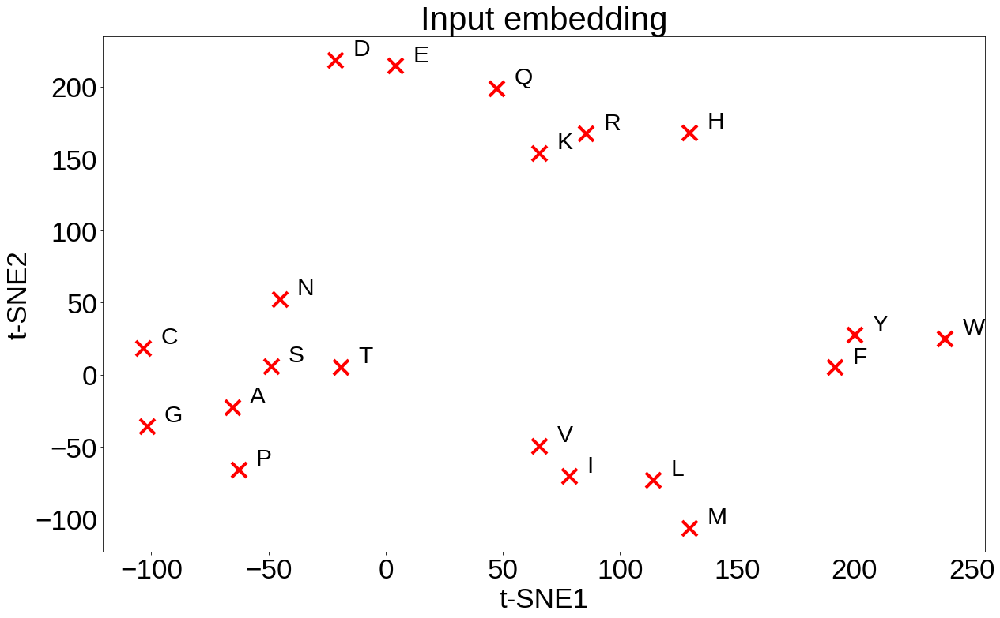

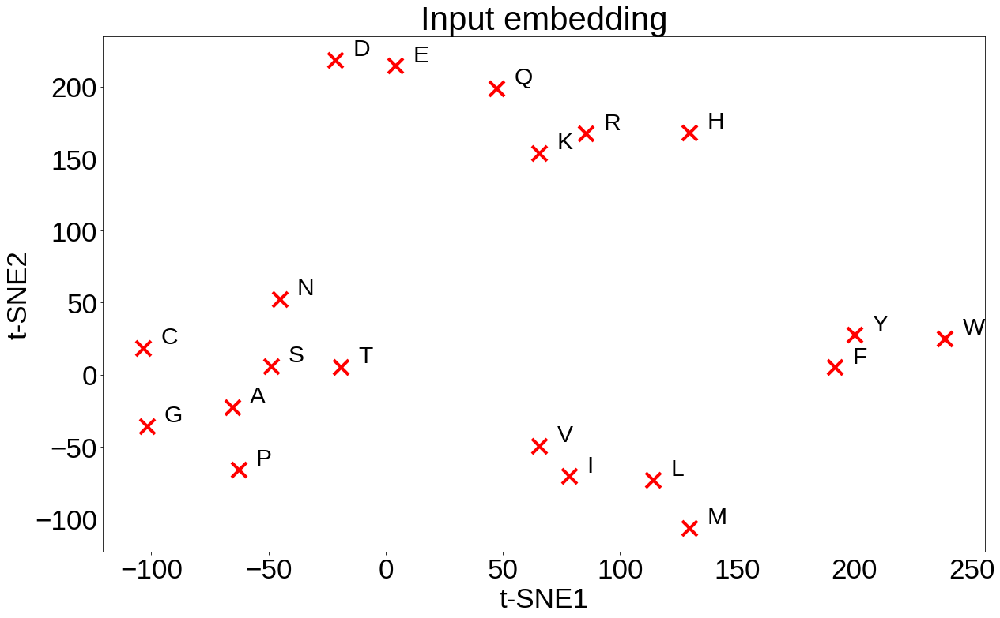

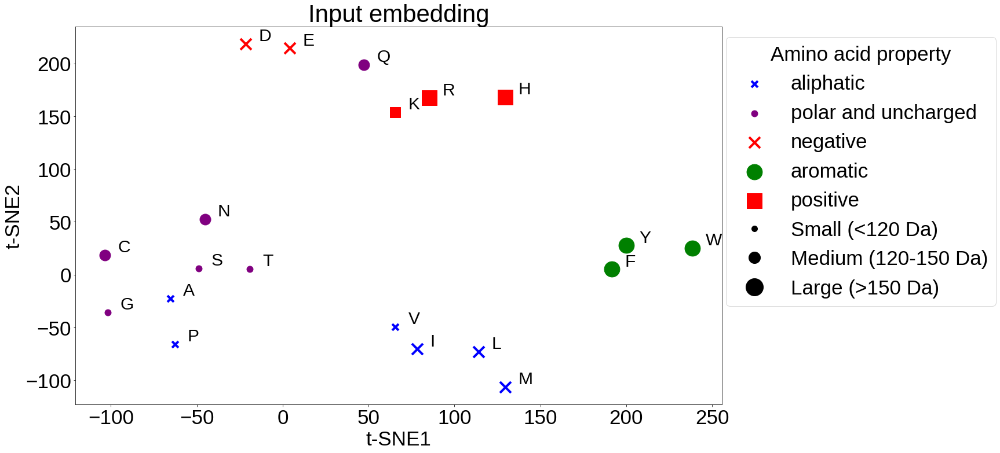

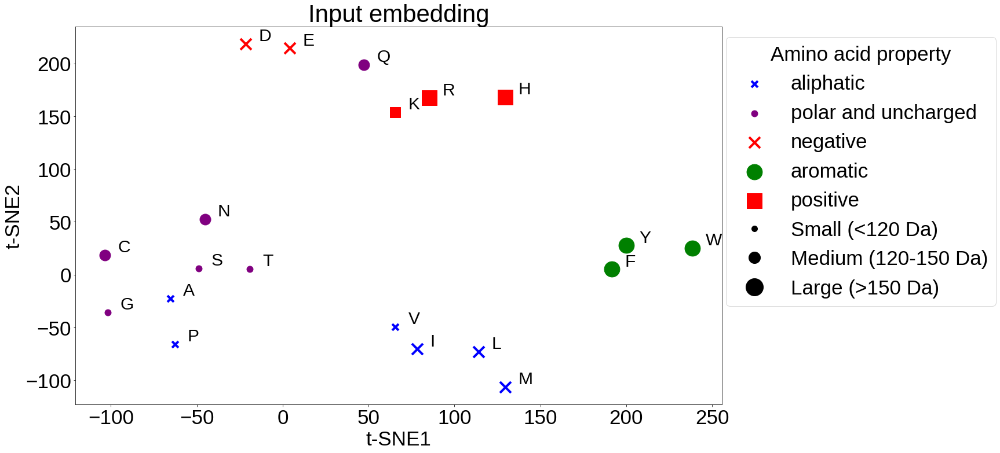

In [5]:
# perform t-SNE on the input embedding weights
from sklearn.manifold import TSNE

tsne = TSNE(n_components=2, perplexity=3, n_iter=1000, random_state=3)
encoder_amino_embedding_weight_tsne = tsne.fit_transform(encoder_amino_embedding_weight_standardized)
decoder_amino_embedding_weight_tsne = tsne.fit_transform(decoder_amino_embedding_weight_standardized)

amino_letters = list(amino_dict.keys())
amino_letters_removal = ['<bos>', '<eos>', '<pad>', '<unk>']

font_size = 35
text_bias = 3.

plt.rcParams.update({
    'font.size': font_size,
    'font.family': 'Liberation Sans',
    'lines.linewidth': 4,
})

plt.figure(figsize=(20, 12), facecolor=(1, 1, 1))
plot_embeddings(encoder_amino_embedding_weight_tsne, amino_dict, amino_letters, remove_amino=amino_letters_removal, text_bias=text_bias)
plt.xlabel("t-SNE1")
plt.ylabel("t-SNE2")
plt.title("Input embedding")
# save both plots
plt.savefig('model_evaluation/encoder_input_embedding_TSNE_no_label.png', bbox_inches='tight')
plt.show()


plt.figure(figsize=(20, 12), facecolor=(1, 1, 1))
plot_embeddings(decoder_amino_embedding_weight_tsne, amino_dict, amino_letters, remove_amino=amino_letters_removal, text_bias=text_bias)
plt.xlabel("t-SNE1")
plt.ylabel("t-SNE2")
plt.title("Input embedding")
# save both plots
plt.savefig('model_evaluation/decoder_input_embedding_TSNE_no_label.png', bbox_inches='tight')
plt.show()

plt.figure(figsize=(20, 12), facecolor=(1, 1, 1))
plot_embeddings(encoder_amino_embedding_weight_tsne, amino_dict, amino_letters, remove_amino=amino_letters_removal, amino_property=amino_property, text_bias=text_bias)
plt.xlabel("t-SNE1")
plt.ylabel("t-SNE2")
plt.title("Input embedding")
# save both plots
plt.savefig('model_evaluation/encoder_input_embedding_TSNE.png', bbox_inches='tight')
plt.show()


plt.figure(figsize=(20, 12), facecolor=(1, 1, 1))
# plot_embeddings(decoder_amino_embedding_weight_tsne, amino_dict, amino_letters, remove_amino=amino_letters_removal, amino_property=amino_property, text_bias=text_bias, property_box_shown=False)
plot_embeddings(decoder_amino_embedding_weight_tsne, amino_dict, amino_letters, remove_amino=amino_letters_removal, amino_property=amino_property, text_bias=text_bias)
plt.xlabel("t-SNE1")
plt.ylabel("t-SNE2")
plt.title("Input embedding")
# save both plots
plt.savefig('model_evaluation/decoder_input_embedding_TSNE.png', bbox_inches='tight')
plt.show()

/rds/general/user/hz3519/home/anaconda3/envs/UROP_transformer/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/rds/general/user/hz3519/home/anaconda3/envs/UROP_transformer/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


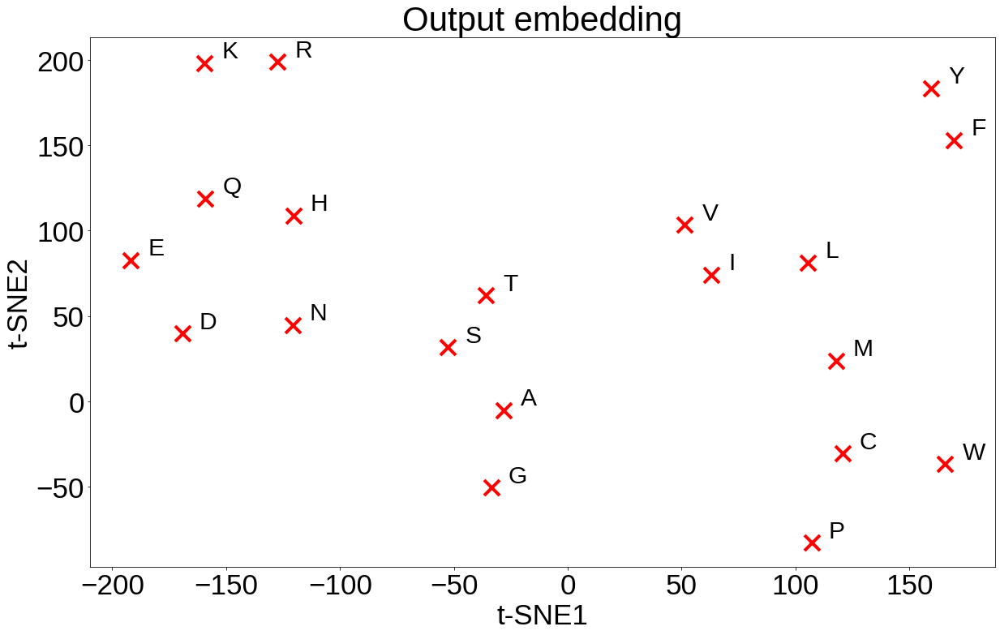

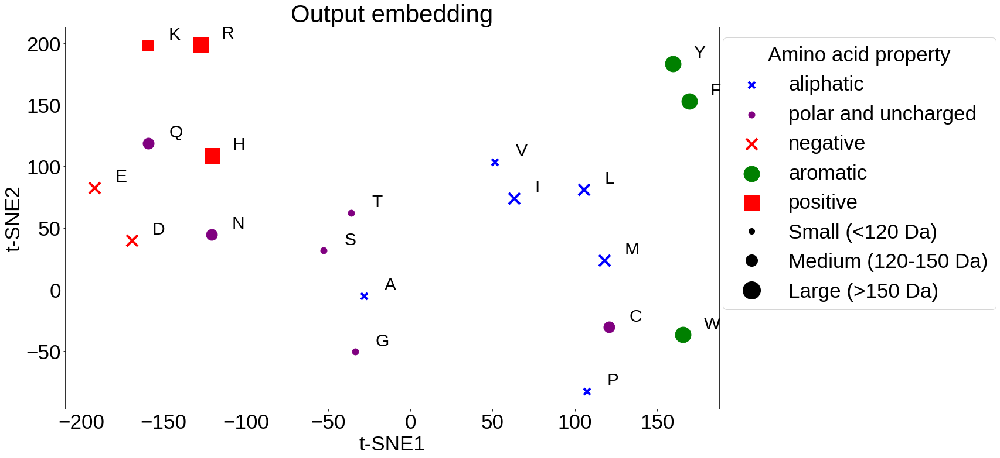

In [6]:
""" plot output embedding """
# perform t-SNE on the output embedding weights

tsne = TSNE(n_components=2, perplexity=5, n_iter=1000, random_state=4)
output_amino_embedding_weight_tsne = tsne.fit_transform(output_amino_embedding_weight)

amino_letters = list(amino_dict.keys())
amino_letters_removal = ['<bos>', '<eos>', '<pad>', '<unk>']

plt.rcParams.update({
    'font.size': font_size,
    'font.family': 'Liberation Sans',
    'lines.linewidth': 4,
})

plt.figure(figsize=(20, 12), facecolor=(1, 1, 1))
plot_embeddings(output_amino_embedding_weight_tsne, amino_dict, amino_letters, remove_amino=amino_letters_removal, text_bias=text_bias)
plt.xlabel("t-SNE1")
plt.ylabel("t-SNE2")
plt.title("Output embedding")
plt.savefig('model_evaluation/decoder_output_embedding_TSNE_no_label.png', bbox_inches='tight')
plt.show()

plt.figure(figsize=(20, 12), facecolor=(1, 1, 1))
plot_embeddings(output_amino_embedding_weight_tsne, amino_dict, amino_letters, remove_amino=amino_letters_removal, amino_property=amino_property, text_bias=text_bias+2)
plt.xlabel("t-SNE1")
plt.ylabel("t-SNE2")
plt.title("Output embedding")
plt.savefig('model_evaluation/decoder_output_embedding_TSNE.png', bbox_inches='tight')
plt.show()

/rds/general/user/hz3519/home/anaconda3/envs/UROP_transformer/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/rds/general/user/hz3519/home/anaconda3/envs/UROP_transformer/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


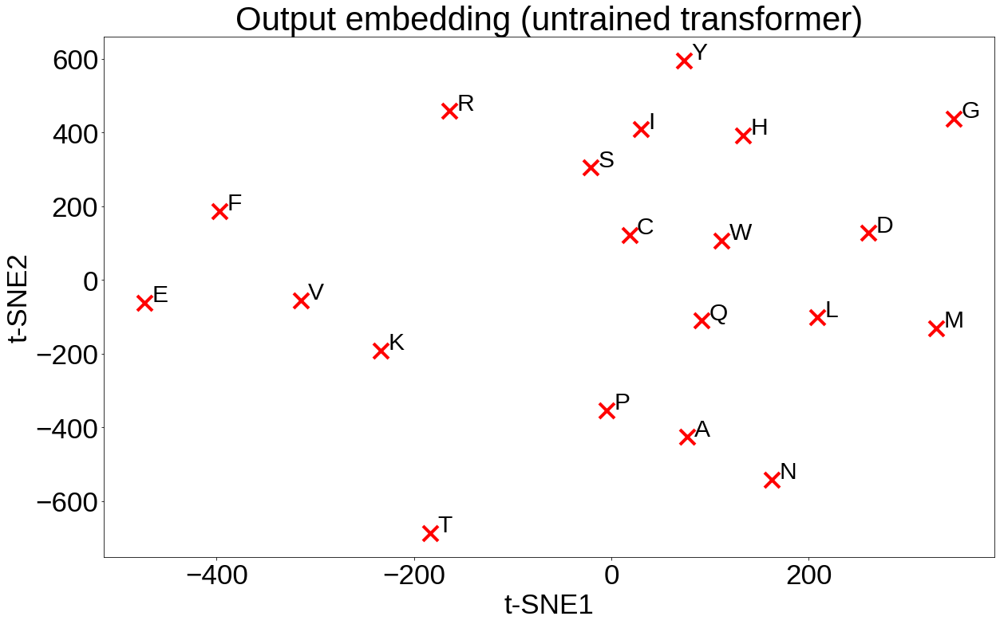

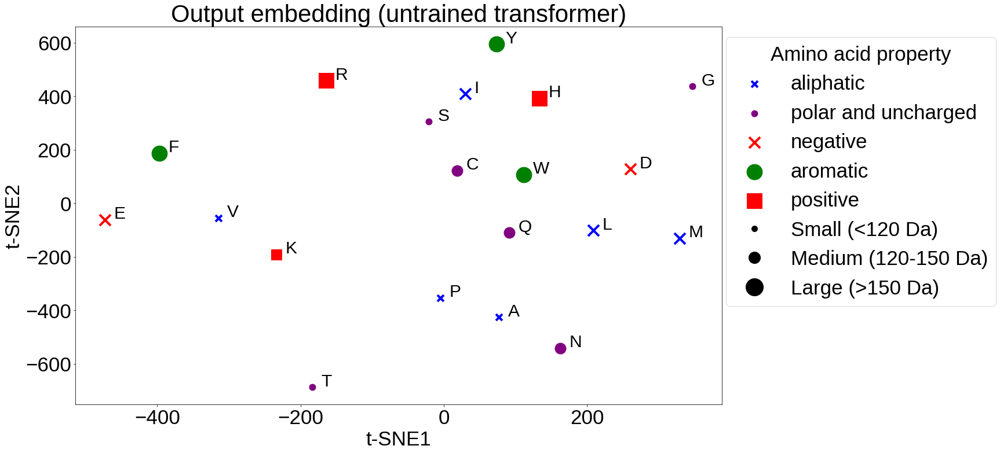

In [7]:
""" plot random embedding """
# perform t-SNE on the random embedding weights

tsne = TSNE(n_components=2, perplexity=5, n_iter=1000, random_state=5)
output_amino_embedding_weight_random_tsne = tsne.fit_transform(output_amino_embedding_weight_random)

amino_letters = list(amino_dict.keys())
amino_letters_removal = ['<bos>', '<eos>', '<pad>', '<unk>']

plt.rcParams.update({
    'font.size': font_size,
    'font.family': 'Liberation Sans',
    'lines.linewidth': 4,
})

plt.figure(figsize=(20, 12), facecolor=(1, 1, 1))
plot_embeddings(output_amino_embedding_weight_random_tsne, amino_dict, amino_letters, remove_amino=amino_letters_removal, text_bias=text_bias)
plt.xlabel("t-SNE1")
plt.ylabel("t-SNE2")
plt.title("Output embedding (untrained transformer)")
plt.savefig('model_evaluation/random_output_embedding_TSNE_no_label.png', bbox_inches='tight')
plt.show()

plt.figure(figsize=(20, 12), facecolor=(1, 1, 1))
plot_embeddings(output_amino_embedding_weight_random_tsne, amino_dict, amino_letters, remove_amino=amino_letters_removal, amino_property=amino_property, text_bias=text_bias+2)
plt.xlabel("t-SNE1")
plt.ylabel("t-SNE2")
plt.title("Output embedding (untrained transformer)")
plt.savefig('model_evaluation/random_output_embedding_TSNE.png', bbox_inches='tight')
plt.show()

#### Additional task: cosine similarity and substitution matrix

In [71]:
# extratc encoder embedding
encoder_amino_embedding = model_use.encoder.embedding
encoder_amino_embedding_weight = encoder_amino_embedding.weight.data.cpu().numpy()

from sklearn.preprocessing import StandardScaler

# standardize the embedding weights
encoder_amino_embedding_weight_standardized = StandardScaler().fit_transform(encoder_amino_embedding_weight)

print(encoder_amino_embedding_weight.shape)

(24, 512)


(24, 512)


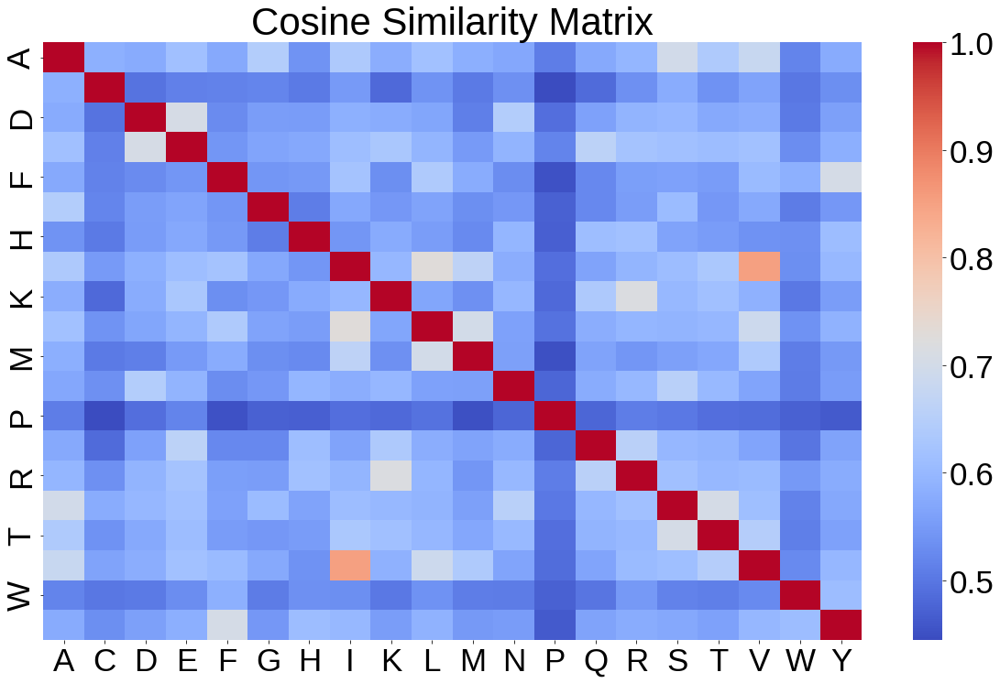

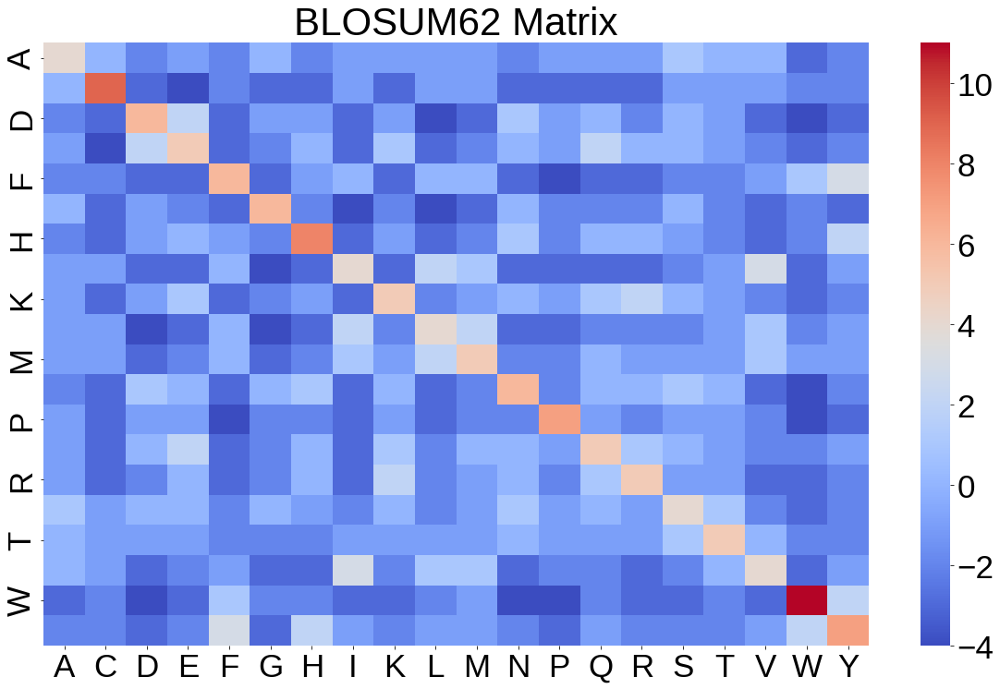

In [74]:
import numpy as np
import requests
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.spatial.distance import pdist, squareform
from sklearn.metrics.pairwise import cosine_similarity


# extratc encoder embedding
encoder_amino_embedding = model_use.encoder.embedding
encoder_amino_embedding_weight = encoder_amino_embedding.weight.data.cpu().numpy()

from sklearn.preprocessing import StandardScaler

# standardize the embedding weights
encoder_amino_embedding_weight_standardized = StandardScaler().fit_transform(encoder_amino_embedding_weight)

print(encoder_amino_embedding_weight.shape)


# Extract only amino acid embeddings
amino_acids = list("ACDEFGHIKLMNPQRSTVWY")
amino_acid_indices = [amino_dict[aa] for aa in amino_acids]
amino_acid_embeddings = encoder_amino_embedding_weight[amino_acid_indices]

# Calculate cosine similarity matrix
cosine_sim_matrix = cosine_similarity(amino_acid_embeddings)




def load_blosum62():
    url = "https://ftp.ncbi.nih.gov/blast/matrices/BLOSUM62"
    response = requests.get(url)
    lines = response.text.strip().split('\n')

    # Remove comment lines
    lines = [line for line in lines if not line.startswith('#')]

    # Parse the matrix
    header = lines.pop(0).split()
    aa_list = [aa for aa in header if aa in amino_dict]  # Only use amino acids in dictionary
    blosum62 = pd.DataFrame(index=aa_list, columns=aa_list)
    for row_num, line in enumerate(lines):
        values = line.split()
        aa = values.pop(0)
        if aa not in aa_list:
            continue
        for i, v in enumerate(values):
            col_aa = header[i]
            if col_aa not in aa_list:
                continue
            blosum62.loc[aa, col_aa] = int(v)
    return blosum62

# Load BLOSUM62 matrix
blosum62 = load_blosum62()
# make the blosum62 matrix in the same order as the cosine_sim_matrix
blosum62 = blosum62.reindex(index=amino_acids, columns=amino_acids)



#  a DataFrame
cosine_sim_matrix_df = pd.DataFrame(cosine_sim_matrix, index=amino_acids, columns=amino_acids)

font_size = 35
plt.rcParams.update({
    'font.size': font_size,
    'font.family': 'Liberation Sans',
    'lines.linewidth': 4,
})

# Plot heatmap for Cosine Similarity Matrix (Normalized)
plt.figure(figsize=(20, 12), facecolor=(1, 1, 1))
sns.heatmap(cosine_sim_matrix_df, annot=False, cmap="coolwarm")
plt.title("Cosine Similarity Matrix")
plt.savefig('model_evaluation/correlation_cosine_similarity_matrix.png', bbox_inches='tight')
plt.show()

# Plot heatmap for BLOSUM62 (Normalized)
plt.figure(figsize=(20, 12), facecolor=(1, 1, 1))
sns.heatmap(blosum62.astype(float), annot=False, cmap="coolwarm")
plt.title("BLOSUM62 Matrix")
plt.savefig('model_evaluation/correlation_BLOSUM62_matrix.png', bbox_inches='tight')
plt.show()

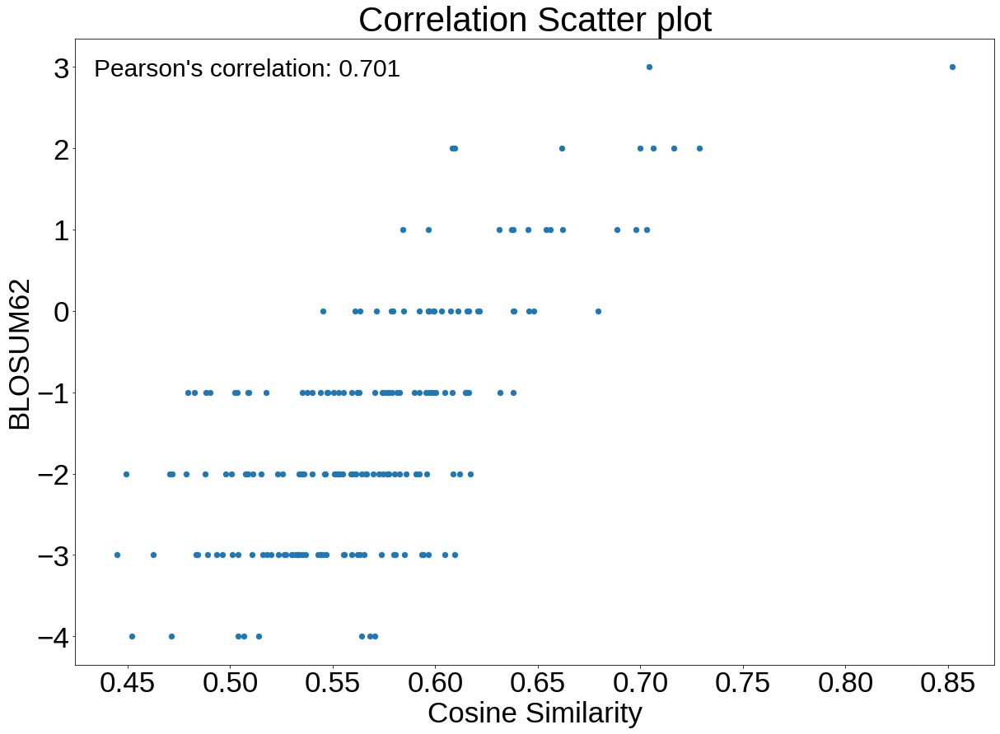

Pearson's correlation: 0.701


In [78]:
import numpy as np
from scipy.stats import pearsonr
import matplotlib.pyplot as plt

# Remove diagonal elements by selecting the upper triangle of the matrices (excluding the diagonal)
upper_triangle_indices = np.triu_indices(cosine_sim_matrix.shape[0], k=1)
cosine_sim_normalized_flat = cosine_sim_matrix[upper_triangle_indices]
blosum62_normalized_flat = blosum62.values[upper_triangle_indices]

# Calculate Pearson's correlation
correlation, _ = pearsonr(cosine_sim_normalized_flat, blosum62_normalized_flat)

plt.figure(figsize=(20, 14), facecolor=(1, 1, 1))
plt.scatter(cosine_sim_normalized_flat, blosum62_normalized_flat, s=40)
plt.xlabel("Cosine Similarity")
plt.ylabel("BLOSUM62")

# Add the correlation text directly to the plot without using a legend
legend_text = f"Pearson's correlation: {correlation:.3f}"
plt.text(0.02, 0.95, legend_text, fontsize=30, ha='left', va='center', transform=plt.gca().transAxes)
plt.title("Correlation Scatter plot")
plt.savefig('model_evaluation/correlation_cosine_BLOSUM62_scatter.png', bbox_inches='tight')
plt.show()
print(f"Pearson's correlation: {correlation:.3f}")

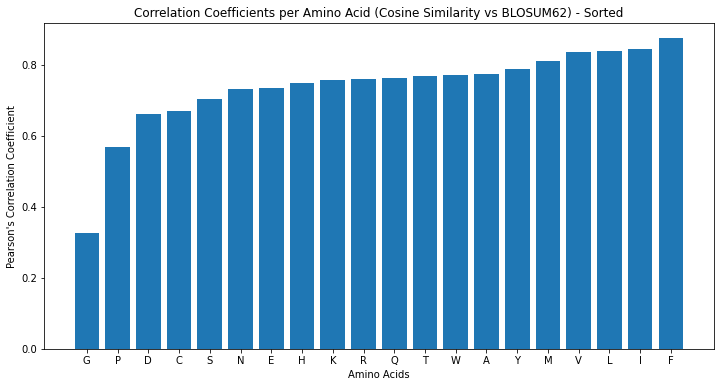

In [40]:
import numpy as np
from scipy.stats import pearsonr
import matplotlib.pyplot as plt

# Initialize a dictionary to store correlation coefficients
correlations = {}

# Iterate through each amino acid
for i, amino_acid in enumerate(amino_acids):
    # Extract the corresponding row from both matrices
    cosine_row = cosine_sim_normalized_df.loc[amino_acid].values
    blosum62_row = blosum62_normalized.loc[amino_acid].values

    # Remove the corresponding diagonal element
    cosine_row = np.delete(cosine_row, i)
    blosum62_row = np.delete(blosum62_row, i)

    # Calculate Pearson's correlation for each pair of rows
    correlation, _ = pearsonr(cosine_row, blosum62_row)

    # Store the correlation in the dictionary
    correlations[amino_acid] = correlation

# Sort the dictionary by values (correlation coefficients)
sorted_correlations = dict(sorted(correlations.items(), key=lambda item: item[1]))

# Create a bar plot to visualize the correlation coefficients
plt.figure(figsize=(12, 6))
plt.bar(sorted_correlations.keys(), sorted_correlations.values())
plt.xlabel("Amino Acids")
plt.ylabel("Pearson's Correlation Coefficient")
plt.title("Correlation Coefficients per Amino Acid (Cosine Similarity vs BLOSUM62) - Sorted")
plt.show()

# Task 2: Probability vs count scatter plot

In [11]:
from TransformerBeta import *
import torch.nn as nn
import numpy as np
import os 
import matplotlib.pyplot as plt
from scipy.stats import pearsonr

In [12]:
# load validation data
validation_dict = np.load('validation_l8_anti/validation_dict_fold0.npy', allow_pickle=True) # <------------------------------------------------------------------------change
validation_dict = validation_dict.tolist()
validation_list = []
for target, value_dict in validation_dict.items():
    for comp, count in value_dict.items():
        validation_list.append([target, comp, count])
validation_array = np.array(validation_list)

In [13]:
# load evaluation data
peptide_eval = np.load('model_evaluation/peptide_eval.npy', allow_pickle=True) # <------------------------------------------------------------------------change
print(validation_array.shape)
print(peptide_eval.shape)

(214881, 3)
(214881, 3)


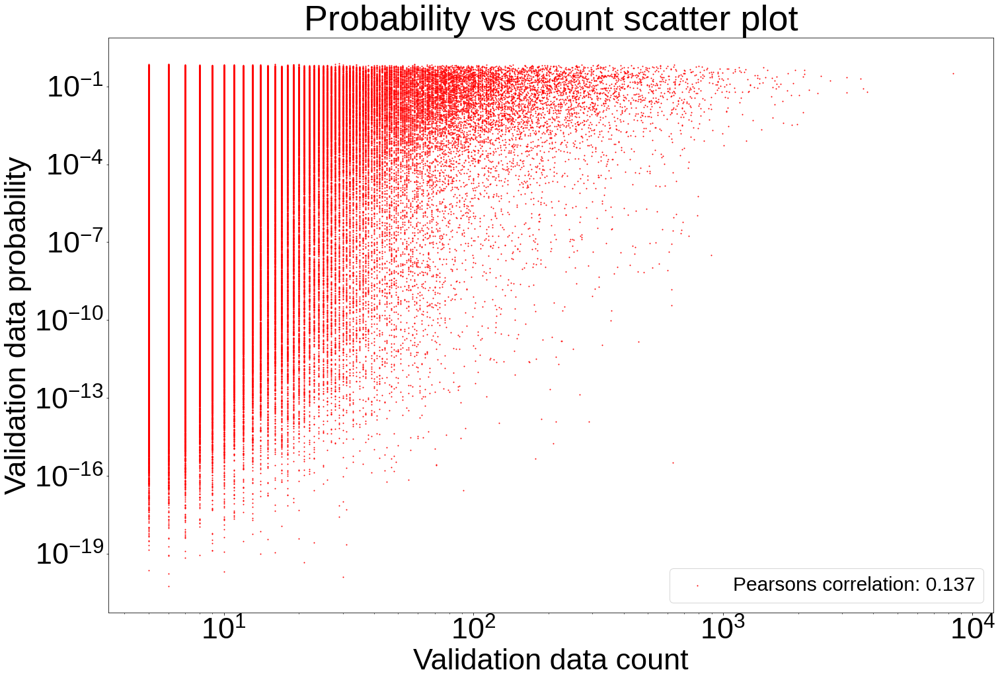

In [14]:
# probability vs count scatter plot
x = validation_array[:, 2].astype(np.float32)
y = peptide_eval[:, 2].astype(np.float32)
# calculate correlation coefficient
corr, _ = pearsonr(x, y)

plt.rcParams.update({
    'font.size': 45,
    'font.family': 'Liberation Sans',
    'lines.linewidth': 4,
})

plt.figure(figsize=(24, 16), facecolor=(1, 1, 1))
plt.scatter(x, y, c='r', s=1, label='Pearsons correlation: %.3f' % corr)
plt.yscale("log")
plt.xscale("log")
plt.xlabel('Validation data count')
plt.ylabel('Validation data probability')
plt.legend(fontsize=30)
plt.title('Probability vs count scatter plot')
plt.savefig('model_evaluation/prob_vs_count_scatter_plot.png', bbox_inches='tight')
plt.show()

In [15]:
# calculate correlation coefficient
corr, _ = pearsonr(x, y)
print('Pearsons correlation: %.3f' % corr)

Pearsons correlation: 0.137


# Task 3: Probability distribution analysis

In [49]:
from TransformerBeta import *
import torch.nn as nn
import numpy as np
import os 
import matplotlib.pyplot as plt
from matplotlib import ticker

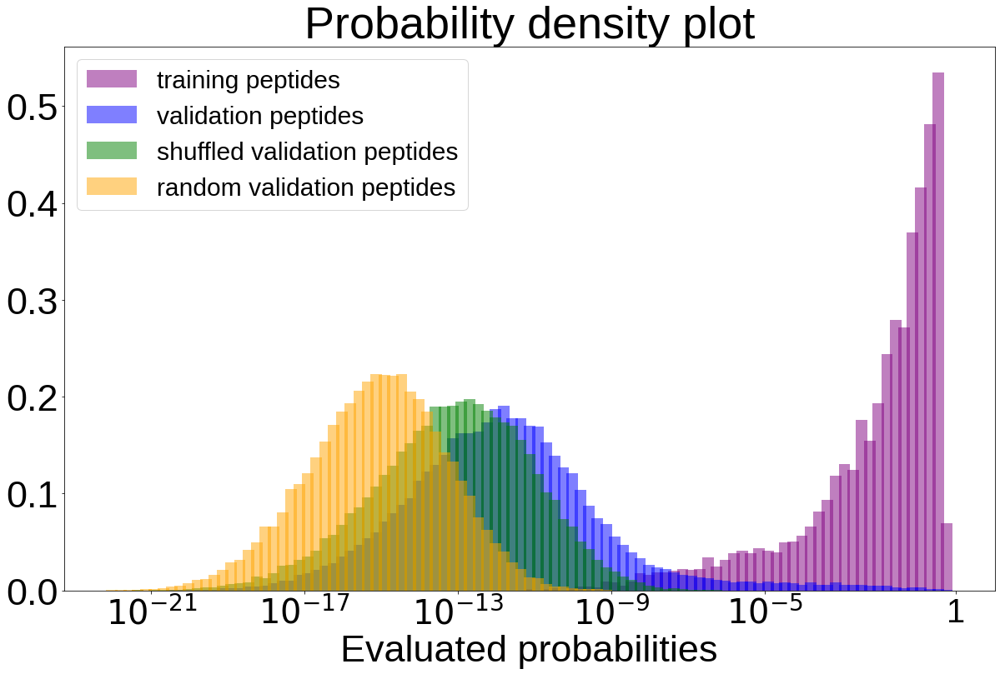

In [50]:
# 0. Load the peptide evaluation and peptide prediction data
peptide_eval_training = np.load('model_evaluation/peptide_eval_BSn_training.npy', allow_pickle=True)
peptide_eval_validation = np.load('model_evaluation/peptide_eval_BSn_validation.npy', allow_pickle=True)
peptide_eval_shuffle = np.load('model_evaluation/peptide_eval_BSn_shuffle.npy', allow_pickle=True) 
peptide_eval_random = np.load('model_evaluation/peptide_eval_BSn_random.npy', allow_pickle=True)


peptide_eval_training_prob = peptide_eval_training[:, 2].astype(np.float64)

peptide_eval_validation_prob = peptide_eval_validation[:, 2].astype(np.float64)

peptide_eval_shuffle_prob = peptide_eval_shuffle[:, 2].astype(np.float64)

peptide_eval_random_prob = peptide_eval_random[:, 2].astype(np.float64)

plt.rcParams.update({
    'font.size': 45,
    'font.family': 'Liberation Sans',
    'lines.linewidth': 4,
})

plt.figure(figsize=(20, 12), facecolor=(1, 1, 1))

# Define custom bins for logarithmic x-axis
bins_log = np.linspace(np.log10(1e-22), np.log10(1), 100)

# Calculate the widths of the bins in the log domain
bin_widths_log = (bins_log[1:] - bins_log[:-1])

# Convert the bins back to the linear domain
bins = 10 ** bins_log

# Convert the data to the log domain
log_peptide_eval_training_prob = np.log10(peptide_eval_training_prob)
log_peptide_eval_validation_prob = np.log10(peptide_eval_validation_prob)
log_peptide_eval_shuffle_prob = np.log10(peptide_eval_shuffle_prob)
log_peptide_eval_random_prob = np.log10(peptide_eval_random_prob)

plt.bar(bins[:-1], np.histogram(log_peptide_eval_training_prob, bins=bins_log)[0] / (bin_widths_log * len(log_peptide_eval_training_prob)), width=10**bins_log[:-1] - 10**bins_log[1:], alpha=0.5, color='purple', label="training peptides")
plt.bar(bins[:-1], np.histogram(log_peptide_eval_validation_prob, bins=bins_log)[0] / (bin_widths_log * len(log_peptide_eval_validation_prob)), width=10**bins_log[:-1] - 10**bins_log[1:], alpha=0.5, color='blue', label="validation peptides")
plt.bar(bins[:-1], np.histogram(log_peptide_eval_shuffle_prob, bins=bins_log)[0] / (bin_widths_log * len(log_peptide_eval_shuffle_prob)), width=10**bins_log[:-1] - 10**bins_log[1:], alpha=0.5, color='green', label="shuffled validation peptides")
plt.bar(bins[:-1], np.histogram(log_peptide_eval_random_prob, bins=bins_log)[0] / (bin_widths_log * len(log_peptide_eval_random_prob)), width=10**bins_log[:-1] - 10**bins_log[1:], alpha=0.5, color='orange', label="random validation peptides")

ax = plt.gca()
ax.set_xscale("log")
ax.set_xticks([1e-21, 1e-17, 1e-13, 1e-9, 1e-5, 1])
ax.get_xaxis().set_major_formatter(ticker.FuncFormatter(lambda x, pos: f'$10^{{{int(np.log10(x)):d}}}$' if x < 1 else '1'))
ax.set_xlabel('Evaluated probabilities')
plt.legend(fontsize=30)
plt.title('Probability density plot')
ax.tick_params(axis='x', labelsize=40)
# plt.savefig('model_evaluation/evaluated_density_plot.png', bbox_inches='tight')
plt.show()

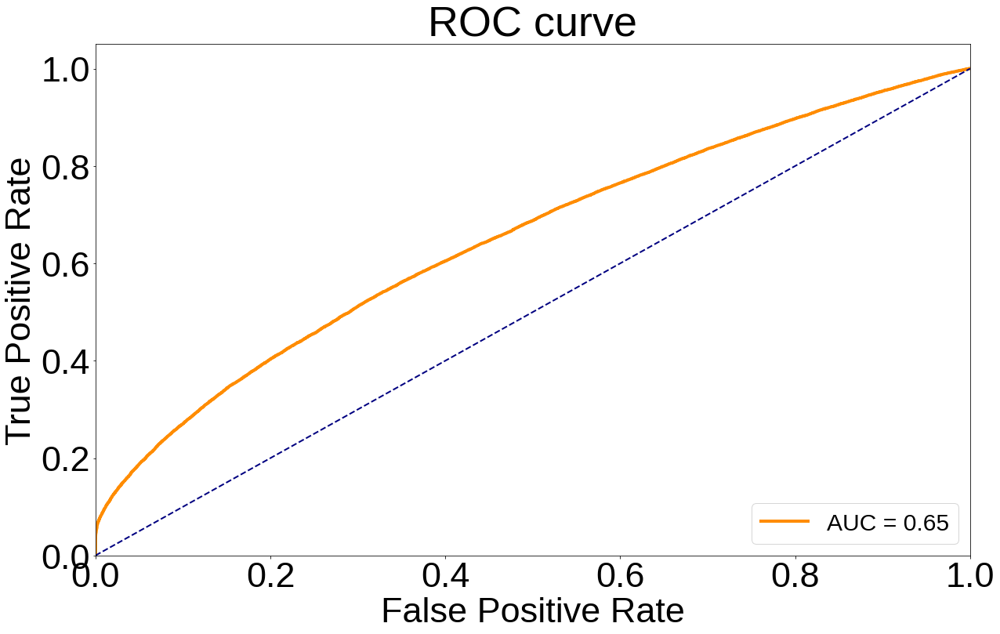

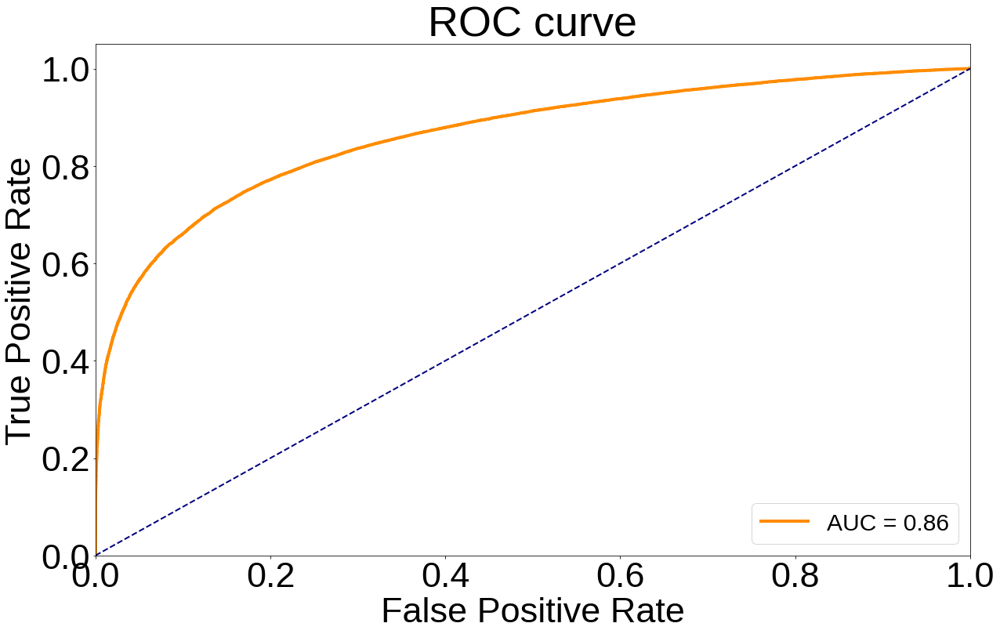

AUC for model evaluation of validation target peptides and shuffled validation complementary peptides:  0.6484371340305861
AUC for model evaluation of validation target peptides and random validation complementary peptides:  0.8643411652151227


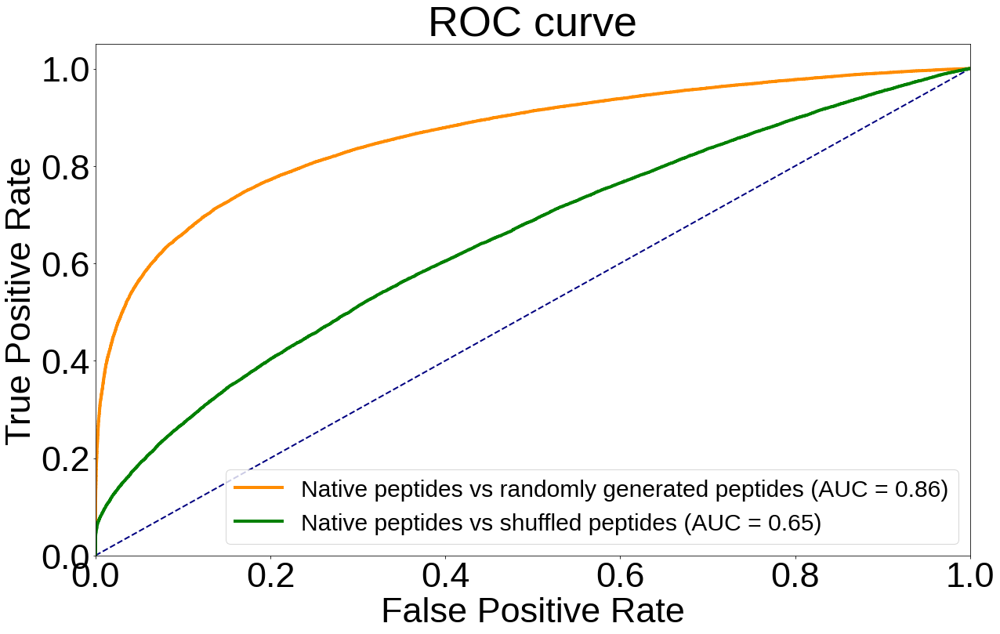

In [51]:
from sklearn.metrics import roc_curve, auc

# 2.1 ROC and AUC for model's evaluation of the validation target peptides and the validation complementary peptides and the shuffled validation complementary peptides
y_true = np.concatenate((np.ones(peptide_eval_validation_prob.shape[0]), np.zeros(peptide_eval_shuffle_prob.shape[0])))
y_score = np.concatenate((peptide_eval_validation_prob, peptide_eval_shuffle_prob))
fpr_shuffled, tpr_shuffled, thresholds_shuffled = roc_curve(y_true, y_score)
roc_auc_shuffled = auc(fpr_shuffled, tpr_shuffled)

plt.rcParams.update({
    'font.size': 45,
    'font.family': 'Liberation Sans',
    'lines.linewidth': 4,
})

plt.figure(figsize=(20, 12), facecolor=(1, 1, 1))
plt.plot(fpr_shuffled, tpr_shuffled, color='darkorange', label='AUC = %0.2f' % roc_auc_shuffled)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC curve')
plt.legend(loc="lower right", fontsize=30)
# plt.savefig('model_evaluation/ROC_curve_shuffled.png', bbox_inches='tight')
plt.show()

# 2.2 ROC and AUC for model's evaluation of the validation target peptides and the validation complementary peptides and the truly random peptides
y_true = np.concatenate((np.ones(peptide_eval_validation_prob.shape[0]), np.zeros(peptide_eval_random_prob.shape[0])))
y_score = np.concatenate((peptide_eval_validation_prob, peptide_eval_random_prob))
fpr_random, tpr_random, thresholds_random = roc_curve(y_true, y_score)
roc_auc_random = auc(fpr_random, tpr_random)

plt.figure(figsize=(20, 12), facecolor=(1, 1, 1))
plt.plot(fpr_random, tpr_random, color='darkorange', label='AUC = %0.2f' % roc_auc_random)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC curve')
plt.legend(loc="lower right", fontsize=30)
# plt.savefig('model_evaluation/ROC_curve_random.png', bbox_inches='tight')
plt.show()

# print the AUC
print('AUC for model evaluation of validation target peptides and shuffled validation complementary peptides: ', roc_auc_shuffled)
print('AUC for model evaluation of validation target peptides and random validation complementary peptides: ', roc_auc_random)

# 2.3 Combine the ROC curves, make both curves different colors
plt.figure(figsize=(20, 12), facecolor=(1, 1, 1))
plt.plot(fpr_random, tpr_random, color='darkorange', label='Native peptides vs randomly generated peptides (AUC = %0.2f)' % roc_auc_random)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.plot(fpr_shuffled, tpr_shuffled, color='green', label='Native peptides vs shuffled peptides (AUC = %0.2f)' % roc_auc_shuffled)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC curve')
plt.legend(loc="lower right", fontsize=30)
# plt.savefig('model_evaluation/ROC_curve_combined.png', bbox_inches='tight')
plt.show()

In [17]:
import pickle
import numpy as np
import torch
import torch.nn as nn
from d2l import torch as d2l
import os
import matplotlib.pyplot as plt

from TransformerBeta import *

"""---------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------"""
"""Data preprocessing"""

amino_dict = {
		'<bos>': 0, 
		'<eos>': 1, 
		'<pad>': 2, 
		'<unk>': 3,
		'A': 4,
		'C': 5,
		'D': 6, 
		'E': 7,
		'F': 8, 
		'G': 9, 
		'H': 10,
		'I': 11, 
		'K': 12, 
		'L': 13, 
		'M': 14, 
		'N': 15, 
		'P': 16, 
		'Q': 17, 
		'R': 18, 
		'S': 19, 
		'T': 20, 
		'V': 21, 
		'W': 22, 
		'Y': 23 
		}

# 1. load the stored data
# length of interest >= 8
length_of_interest = []
type_of_interest = ['antiparallel'] # <------------------------------------------------------------------------change 
for i in range(8, 9): # <------------------------------------------------------------------------change 
	length_of_interest.append(str(i))
# length_of_interest.append('20more') # <------------------------------------------------------------------------change 

beta_strand_data = {}
# create subdictionary for antiparallel and parallel
beta_strand_data['antiparallel'] = {}
# beta_strand_data['parallel'] = {} # <------------------------------------------------------------------------change 
# create subdictionary of subdictionary for each length, string 3-20 and 20more
for i in range(8, 9): # <-------------------------------------------------------------------------change 
	beta_strand_data['antiparallel'][str(i)] = {}
	# beta_strand_data['parallel'][str(i)] = {} # <------------------------------------------------------------------------change 
# beta_strand_data['antiparallel']['20more'] = {} # <------------------------------------------------------------------------change 
# beta_strand_data['parallel']['20more'] = {} # <------------------------------------------------------------------------change 

total_data_stored = 0
for type in ['antiparallel', 'parallel']:
	if type not in type_of_interest:
		continue
	length_list = os.listdir("AF2_beta_strand_database/" + type)
	length_list.sort()
	for length in length_list:
		length_name = length.split('_')[1]
		if length_name not in length_of_interest:
			continue
		num_load = 0
		# get all subfolders
		length_subfolders = os.listdir("AF2_beta_strand_database/" + type + "/" + length)
		for subfolder in length_subfolders:
			# load .npy file
			data = np.load("AF2_beta_strand_database/" + type + "/" + length + "/" + subfolder, allow_pickle=True)
			data = data.tolist()
			# data is a dictionary
			# add data to beta_strand_data
			for key in data:
				beta_strand_data[type][length_name][key] = data[key]
				total_data_stored += len(data[key])
				num_load += len(data[key])
		# print number of data loaded in this length
		print('number of ' + type + ' beta strands with length ' + length_name + ' loaded: ' + str(num_load))
print("Total data stored: " + str(total_data_stored))

# 2. create the dataset
# append key, comp, count, freq to the dataset
AF_beta_strand_dataset = []
for type in beta_strand_data:
	for length in beta_strand_data[type]:
		for key in beta_strand_data[type][length]:
			freq = len(beta_strand_data[type][length][key])
			for comp in beta_strand_data[type][length][key]:
				AF_beta_strand_dataset.append([key, comp, beta_strand_data[type][length][key][comp], freq])
AF_beta_strand_dataset = np.array(AF_beta_strand_dataset, dtype=object)

dataset_indices = list(range(len(AF_beta_strand_dataset)))
dataset_indices = np.array(dataset_indices)

# filter training indices from the dataset: condition 1: count < 5
condition_count = np.nonzero(np.array([count < 5 for count in AF_beta_strand_dataset[:, -2]]))
dataset_indices_low_count = dataset_indices[condition_count]
AF_beta_strand_dataset = AF_beta_strand_dataset[dataset_indices_low_count, :]
dataset_indices = list(range(len(AF_beta_strand_dataset)))
dataset_indices = np.array(dataset_indices)

number of antiparallel beta strands with length 8 loaded: 38616564
Total data stored: 38616564


#### subtask 1: search for 3 spike target in full database

In [34]:
# task_target = 'QPRTFLLK'
task_target = 'LEILDITP'
# task_target = 'TLEILDIT'

In [35]:
# AF2 beta strand database search
print("AF2 beta strand database search result: \n", search_target(AF_beta_strand_dataset, task_target))

AF2 beta strand database search result: 
 []


In [36]:
# dataset similar search
print("Training Dataset similar search result: \n", search_target_similar(AF_beta_strand_dataset, task_target, insimilarity_num=2))

Training Dataset similar search result: 
 [['LEHLAITP' 'RIGLTLRI' '1' '1' '2']
 ['QAILDITP' 'KEIVKYEL' '1' '1' '2']
 ['LLILRITP' 'VRLYSLRG' '1' '1' '2']
 ['IEALDITP' 'EYRYHFEF' '1' '1' '2']
 ['LFIRDITP' 'KILNFTTY' '1' '1' '2']
 ['AEIVDITP' 'FRLWYTAI' '1' '1' '2']
 ['LEHLDIRP' 'RWVLRLQL' '1' '1' '2']
 ['MDILDITP' 'KYIFQKVF' '2' '1' '2']
 ['LMILDITS' 'LSTVNATF' '1' '1' '2']
 ['LYILDIEP' 'SQTIILNF' '1' '1' '2']
 ['LEVLGITP' 'NHVSVTFT' '1' '1' '2']
 ['AEILDITV' 'IRMRARSG' '1' '1' '2']
 ['GEITDITP' 'VSFRMRLS' '1' '1' '2']
 ['LEILQIQP' 'IRTRLIKV' '2' '1' '2']
 ['LEIRDIRP' 'PRATVRWD' '1' '1' '2']
 ['LRILDITT' 'WQLCCLGS' '1' '1' '2']
 ['LEIADIRP' 'CRATIRWD' '1' '1' '2']
 ['LEILKITT' 'YRIRFHYN' '1' '1' '2']
 ['LESLDITA' 'SLRLSAKV' '1' '1' '2']
 ['LEIVDATP' 'VGAETLVF' '1' '1' '2']
 ['LEILDIGT' 'IKDVNVYI' '1' '3' '2']
 ['LEILDIGT' 'IKDINIYL' '1' '3' '2']
 ['LEILDIGT' 'IKDVNIYI' '1' '3' '2']
 ['LEILNITL' 'LIMAVEMT' '1' '1' '2']
 ['LPILQITP' 'GTVVEVRA' '1' '1' '2']
 ['LSILDITF' 'LLSLPLIK' '1' '1' '

#### subtask 2: search for 4,5000 BSn data in full database

In [53]:
peptide_eval_training[:10]

array([['FHLYLMHK', 'YTAHRLSW', '0.13936178386211395'],
       ['LALLIGYG', 'RVVQAAYS', '0.0714065358042717'],
       ['RDFVVLRT', 'LVYQYIET', '0.24004022777080536'],
       ['KPEQLAIR', 'DLAHWVFS', '9.02852916624397e-05'],
       ['VNIRVAVL', 'TCVDVRLT', '0.46275654435157776'],
       ['LVVQAGLF', 'AYLAFCLR', '0.000545841408893466'],
       ['VLINPIQQ', 'SILYVSLS', '0.10656043887138367'],
       ['KLDLVISR', 'YLTVKHLE', '0.16055800020694733'],
       ['GAEVRRYR', 'GALAVYVT', '0.38703829050064087'],
       ['TVLKLTPV', 'YISEVRCG', '0.0023696080315858126']], dtype='<U32')

In [136]:
peptide_eval_validation[40:50]

array([['KVYKGFVE', 'IRIEAPVA', '4.780984941277211e-09'],
       ['IVVQLNAV', 'SHITMSYR', '1.367927987680137e-13'],
       ['AFPIDISV', 'TYYCTGYI', '1.0941031744872778e-13'],
       ['VSASVKVE', 'ITLSIEYK', '6.228527605110041e-16'],
       ['QQSYVIVR', 'PVDVIVAE', '9.365088565749247e-12'],
       ['LVSKFHFV', 'QKLTVTFV', '1.3347204230740317e-07'],
       ['IGQGYDIH', 'LINAFCEI', '5.515223965458366e-14'],
       ['IGQGYDIH', 'LANAFCEI', '2.258588154623411e-15'],
       ['AHISAIGA', 'PLVFVECA', '1.229128662727768e-14'],
       ['LARVFSYP', 'SIQVTYVQ', '1.2626931618353598e-11']], dtype='<U32')

In [153]:
task_target = 'KLDLVISR'

In [154]:
# AF2 beta strand database search
print("AF2 beta strand database search result: \n", search_target(AF_beta_strand_dataset, task_target))

AF2 beta strand database search result: 
 [['KLDLVISR' 'LLHSFITY' 1 11]
 ['KLDLVISR' 'CVCVKHLE' 1 11]
 ['KLDLVISR' 'YITMKHLE' 3 11]
 ['KLDLVISR' 'CITMKHLE' 2 11]
 ['KLDLVISR' 'LLSVKHLE' 2 11]
 ['KLDLVISR' 'HLTMKHLE' 2 11]
 ['KLDLVISR' 'FLSIKHLE' 1 11]
 ['KLDLVISR' 'YITIKHLE' 3 11]]


In [115]:
# dataset similar search
print("Training Dataset similar search result: \n", search_target_similar(AF_beta_strand_dataset, task_target, insimilarity_num=1))

Training Dataset similar search result: 
 [['FLVSADIQ' 'QTINASLK' '1' '1' '1']]


#### Additional task 1: Probability distribution analysis of cascade method

In [35]:
# task_target = 'QPRTFLLK'
# task_target = 'TLEILDIT'
task_target = 'LEILDITP'
model_use = model_standard
prediction_length = 8

complementary_peptides_info = np.genfromtxt('complementary_peptides_{}.tsv'.format(task_target), delimiter='\t', dtype=str)
print("shape of cascade output: ", complementary_peptides_info.shape)
print("header: ", complementary_peptides_info[0])
print("example of data: ", complementary_peptides_info[1])
print("number of parallel:", len(complementary_peptides_info[complementary_peptides_info[:, 1]=='+']))
print("number of antiparallel:", len(complementary_peptides_info[complementary_peptides_info[:, 1]=='-']))

shape of cascade output:  (2480, 12)
header:  ['Complementary_sequence' 'parallel/antiparallel' 'len_initializer'
 'initializer' 'FirstResHB' 'NumberOfPaths' 'Complementarity_score'
 'Solubility_score' 'Solubility_bin' 'Count_score' 'Promiscuity_score'
 'Mean_enrichment']
example of data:  ['RYYLKFFC' '-' '4' 'KFFC' '1' '1' '33.34' '0.11177091406611585' '4' '43'
 '-9.66' '1.23832296632']
number of parallel: 743
number of antiparallel: 1736


In [36]:
complementary_peptides = complementary_peptides_info[complementary_peptides_info[:, 1]=='-'][:, 0] # antiparallel
task_target_list = [task_target]*len(complementary_peptides)
num_minibatch = 100
cascade_peptide_eval = evaluate_minibatch(model_use, task_target_list, complementary_peptides, amino_dict, prediction_length + 2, device, num_minibatch=num_minibatch)
print("minibatch evaluatiion number: \n", len(cascade_peptide_eval))
print("minibatch evaluatiion: \n", cascade_peptide_eval[:10])

minibatch evaluatiion number: 
 1736
minibatch evaluatiion: 
 [['LEILDITP' 'RYYLKFFC' '9.288568593546578e-16']
 ['LEILDITP' 'IRKMYILS' '3.082932053836084e-15']
 ['LEILDITP' 'IRKMYILV' '4.1544323320028e-15']
 ['LEILDITP' 'YQYVKVQF' '2.949644380741828e-13']
 ['LEILDITP' 'RYYVKVEV' '4.1741180129717e-16']
 ['LEILDITP' 'FAKMYIKV' '4.188121475057899e-13']
 ['LEILDITP' 'RYYVKFFC' '9.49060050984551e-18']
 ['LEILDITP' 'FRYVYLKV' '2.2228289646891762e-15']
 ['LEILDITP' 'IFSVVCDF' '1.6341623480502373e-15']
 ['LEILDITP' 'FRYVYIAF' '1.7699502527641334e-16']]


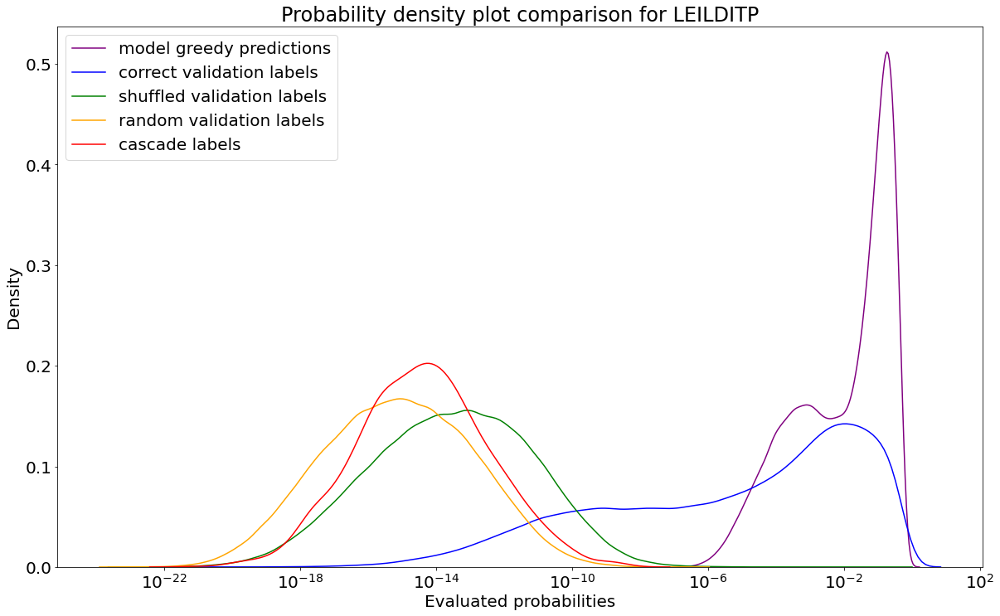

In [37]:
# 0 load the peptide eval and peptide pred
peptide_pred = np.load('model_evaluation/peptide_pred.npy', allow_pickle=True) # <------------------------------------------------------------------------change
peptide_eval = np.load('model_evaluation/peptide_eval.npy', allow_pickle=True) # <------------------------------------------------------------------------change
peptide_eval_shuffled = np.load('model_evaluation/peptide_eval_shuffled.npy', allow_pickle=True) # <------------------------------------------------------------------------change
peptide_eval_random = np.load('model_evaluation/peptide_eval_random.npy', allow_pickle=True) # <------------------------------------------------------------------------change

# 1.1 probability of the model's generation of complementary peptides given the validation target peptides
peptide_pred_prob= peptide_pred[:, 2].astype(np.float64)

# 1.2 probability of the model's evaluation of the validation target peptides and the validation complementary peptides
peptide_eval_prob = peptide_eval[:, 2].astype(np.float64)

# 1.3 probability of the model's evaluation of the validation target peptides and the shuffled validation complementary peptides
peptide_eval_shuffled_prob = peptide_eval_shuffled[:, 2].astype(np.float64)

# 1.4 probability of the model's evaluation of the validation target peptides and truly random peptides
peptide_eval_random_prob = peptide_eval_random[:, 2].astype(np.float64)

cascade_peptide_eval_prob = cascade_peptide_eval[:, 2].astype(np.float64)

# 1.5 plot the probability distribution
import seaborn as sns

plt.rcParams.update({
    'font.size': 45,
    'font.family': 'Liberation Sans',
    'lines.linewidth': 4,
})

plt.figure(figsize=(20, 12), facecolor=(1, 1, 1))
k0 = sns.kdeplot(peptide_pred_prob, log_scale=10, label= "model greedy predictions", c='purple')
k1 = sns.kdeplot(peptide_eval_prob, log_scale=10, label= "correct validation labels", c='blue')
k2 = sns.kdeplot(peptide_eval_shuffled_prob, log_scale=10, label= "shuffled validation labels", c='green')
k3 = sns.kdeplot(peptide_eval_random_prob, log_scale=10, label= "random validation labels", c = 'orange')
k4 = sns.kdeplot(cascade_peptide_eval_prob, log_scale=10, label= "cascade labels", c = 'red')

plt.xlabel('Evaluated probabilities')
plt.legend()
plt.title('Probability density plot comparison for {}'.format(task_target))
plt.savefig('model_evaluation/evaluated_density_plot_{}.png'.format(task_target))
plt.show()

#### Additional task 2: Probability distribution analysis of cascade method

In [9]:
import numpy as np
import pandas as pd

In [73]:
# task_target = 'QPRTFLLK'
# task_target = 'TLEILDIT'
task_target = 'LEILDITP'
# read a xlsx file using numpy
model_use = model_standard
prediction_length = 8

# read a xlsx file using numpy -- not tsv file
# complementary_peptides_info = pd.read_excel('complementary_peptides_Q.xlsx', header=None)
# complementary_peptides_info = pd.read_excel('complementary_peptides_T.xlsx', header=None)
complementary_peptides_info = pd.read_excel('complementary_peptides_L.xlsx', header=None)

complementary_peptides_info = complementary_peptides_info.to_numpy()
print("shape of cascade output: ", complementary_peptides_info.shape)
print("header: ", complementary_peptides_info[0])
print("example of data: ", complementary_peptides_info[1])
print("number of parallel:", len(complementary_peptides_info[complementary_peptides_info[:, 1]=='+']))
print("number of antiparallel:", len(complementary_peptides_info[complementary_peptides_info[:, 1]=='-']))

shape of cascade output:  (2480, 19)
header:  ['Complementary_sequence' 'parallel/antiparallel' 'len_initializer'
 'initializer' 'FirstResHB' 'NumberOfPaths' 'Complementarity_score'
 'Solubility_score' 'Solubility_bin' 'Count_score' 'Promiscuity_score'
 'Mean_enrichment' nan nan 'total' nan nan nan nan]
example of data:  ['AIIFKFFC' '-' 4 'KFFC' 1 1 105.1 -1.169412108 1 115 -9.9 1.246141054 nan
 nan 2480 nan nan nan nan]
number of parallel: 743
number of antiparallel: 1736


In [74]:
complementary_peptides = complementary_peptides_info[complementary_peptides_info[:, 1]=='-'][:, 0] # antiparallel
task_target_list = [task_target]*len(complementary_peptides)
num_minibatch = 100
cascade_peptide_eval = evaluate_minibatch(model_use, task_target_list, complementary_peptides, amino_dict, prediction_length + 2, device, num_minibatch=num_minibatch)
print("minibatch evaluatiion number: \n", len(cascade_peptide_eval))
print("minibatch evaluatiion: \n", cascade_peptide_eval[:10])

minibatch evaluatiion number: 
 1736
minibatch evaluatiion: 
 [['LEILDITP' 'AIIFKFFC' '1.004138650138158e-19']
 ['LEILDITP' 'KRYVKVIG' '1.051808837373774e-14']
 ['LEILDITP' 'FRYVKVIG' '1.7763819115754892e-13']
 ['LEILDITP' 'AKYVKVIG' '3.6104337835379807e-12']
 ['LEILDITP' 'KRYVKVET' '2.0316557725460284e-16']
 ['LEILDITP' 'FTYVKVIG' '2.738942656593693e-15']
 ['LEILDITP' 'RRYVKVIG' '2.9261061482892606e-14']
 ['LEILDITP' 'GFYVKVIG' '1.5122429931910746e-17']
 ['LEILDITP' 'LFYVKVIG' '3.666100209037481e-17']
 ['LEILDITP' 'FRYVKVET' '1.071154159328644e-16']]


In [75]:
complementary_peptides_info_new = np.concatenate((complementary_peptides_info, np.zeros((len(complementary_peptides_info), 1))), axis=1)
complementary_peptides_info_new[complementary_peptides_info_new[:, 1]=='-', -1] = cascade_peptide_eval[:, 2]
# add header transformer_score to the last column
complementary_peptides_info_new[0, -1] = 'transformer_score'
print("shape of cascade output: ", complementary_peptides_info.shape)
print("header: ", complementary_peptides_info_new[0])
print("example of data: ", complementary_peptides_info_new[1])
print("number of parallel:", len(complementary_peptides_info_new[complementary_peptides_info_new[:, 1]=='+']))
print("number of antiparallel:", len(complementary_peptides_info_new[complementary_peptides_info_new[:, 1]=='-']))

shape of cascade output:  (2480, 19)
header:  ['Complementary_sequence' 'parallel/antiparallel' 'len_initializer'
 'initializer' 'FirstResHB' 'NumberOfPaths' 'Complementarity_score'
 'Solubility_score' 'Solubility_bin' 'Count_score' 'Promiscuity_score'
 'Mean_enrichment' nan nan 'total' nan nan nan nan 'transformer_score']
example of data:  ['AIIFKFFC' '-' 4 'KFFC' 1 1 105.1 -1.169412108 1 115 -9.9 1.246141054 nan
 nan 2480 nan nan nan nan '1.004138650138158e-19']
number of parallel: 743
number of antiparallel: 1736


In [76]:
# save the output as a tsv file
# np.savetxt('complementary_peptides_Q_with_score.csv', complementary_peptides_info_new, delimiter=',', fmt='%s')
# np.savetxt('complementary_peptides_T_with_score.csv', complementary_peptides_info_new, delimiter=',', fmt='%s')
np.savetxt('complementary_peptides_L_with_score.csv', complementary_peptides_info_new, delimiter=',', fmt='%s')

#### Additional task 3: Probability distribution analysis of seen and unseen targets

In [38]:
# load training data
train_dict = np.load('train_l8_anti/train_dict_fold0.npy', allow_pickle=True)
train_dict = train_dict.tolist()
train_list = []
for target, value_dict in train_dict.items():
    for comp, count in value_dict.items():
        train_list.append([target, comp, count])
train_array = np.array(train_list)

# load validation data
validation_dict = np.load('validation_l8_anti/validation_dict_fold0.npy', allow_pickle=True) # <------------------------------------------------------------------------change
validation_dict = validation_dict.tolist()
validation_list = []
for target, value_dict in validation_dict.items():
    for comp, count in value_dict.items():
        validation_list.append([target, comp, count])
validation_array = np.array(validation_list)

# 0 load the peptide eval and peptide pred
peptide_pred = np.load('model_evaluation/peptide_pred.npy', allow_pickle=True) # <------------------------------------------------------------------------change
peptide_eval = np.load('model_evaluation/peptide_eval.npy', allow_pickle=True) # <------------------------------------------------------------------------change
peptide_eval_shuffled = np.load('model_evaluation/peptide_eval_shuffled.npy', allow_pickle=True) # <------------------------------------------------------------------------change
peptide_eval_random = np.load('model_evaluation/peptide_eval_random.npy', allow_pickle=True) # <------------------------------------------------------------------------change

# 1. probability distribution analysis:
# 1.1 probability of the model's generation of complementary peptides given the validation target peptides
peptide_pred_prob= peptide_pred[:, 2].astype(np.float64)

# 1.2 probability of the model's evaluation of the validation target peptides and the validation complementary peptides
peptide_eval_prob = peptide_eval[:, 2].astype(np.float64)

# 1.3 probability of the model's evaluation of the validation target peptides and the shuffled validation complementary peptides
peptide_eval_shuffled_prob = peptide_eval_shuffled[:, 2].astype(np.float64)

# 1.4 probability of the model's evaluation of the validation target peptides and truly random peptides
peptide_eval_random_prob = peptide_eval_random[:, 2].astype(np.float64)

In [39]:
# seen target be 1, unseen target be 0
seen_list = [] 
# use train_dict to check if the target is seen
for target, comp, count in validation_array:
    if target in train_dict:
        seen_list.append(1)
    else:
        seen_list.append(0)
seen_array = np.array(seen_list)

print("seen_array: ", seen_array)
print("seen_array shape: ", seen_array.shape)
print("number of 1: ", len(seen_array[seen_array==1]))
print("number of 0: ", len(seen_array[seen_array==0]))

seen_array:  [0 0 1 ... 1 0 1]
seen_array shape:  (214881,)
number of 1:  85287
number of 0:  129594


In [40]:
peptide_pred_prob_seen = peptide_pred_prob[seen_array==1]
peptide_pred_prob_unseen = peptide_pred_prob[seen_array==0]

peptide_eval_prob_seen = peptide_eval_prob[seen_array==1]
peptide_eval_prob_unseen = peptide_eval_prob[seen_array==0]

peptide_eval_shuffled_prob_seen = peptide_eval_shuffled_prob[seen_array==1]
peptide_eval_shuffled_prob_unseen = peptide_eval_shuffled_prob[seen_array==0]

peptide_eval_random_prob_seen = peptide_eval_random_prob[seen_array==1]
peptide_eval_random_prob_unseen = peptide_eval_random_prob[seen_array==0]

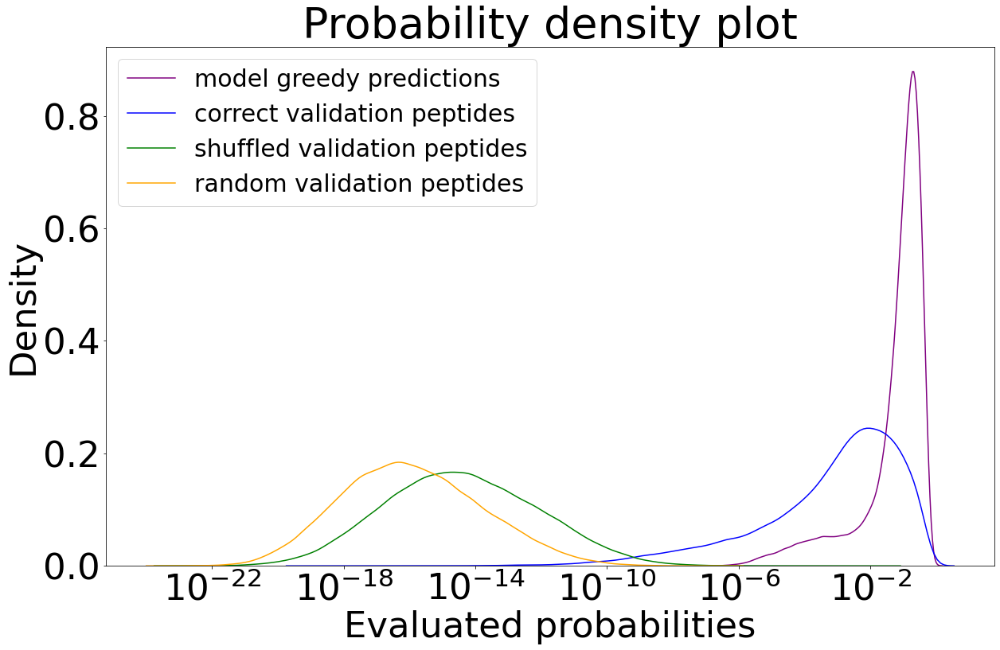

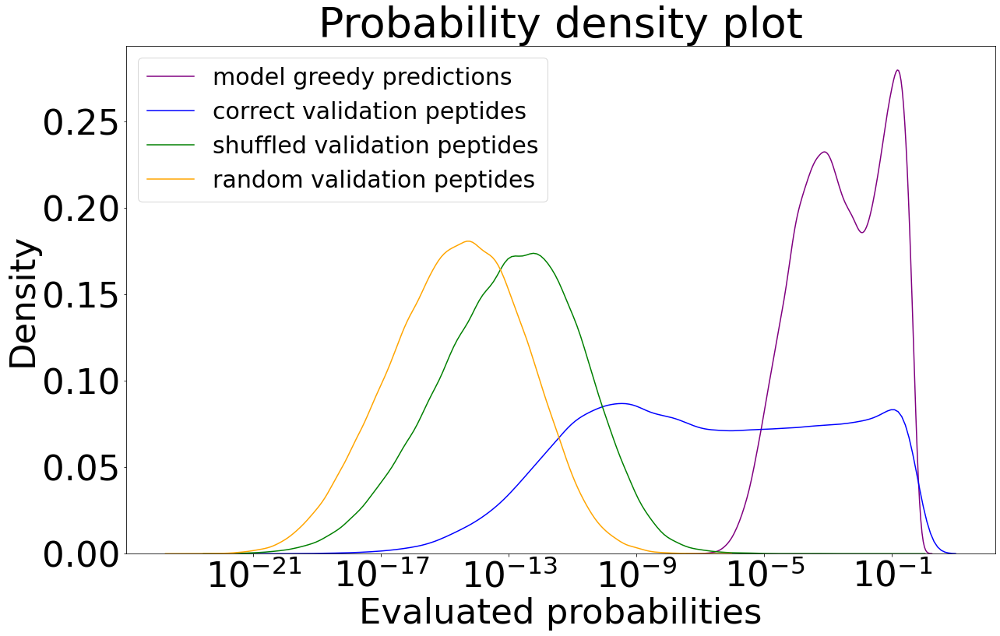

In [41]:
import seaborn as sns

plt.rcParams.update({
    'font.size': 45,
    'font.family': 'Liberation Sans',
    'lines.linewidth': 4,
})

plt.figure(figsize=(20, 12), facecolor=(1, 1, 1))
k0 = sns.kdeplot(peptide_pred_prob_seen, log_scale=10, label= "model greedy predictions", c='purple')
k1 = sns.kdeplot(peptide_eval_prob_seen, log_scale=10, label= "correct validation peptides", c='blue')
k2 = sns.kdeplot(peptide_eval_shuffled_prob_seen, log_scale=10, label= "shuffled validation peptides", c='green')
k3 = sns.kdeplot(peptide_eval_random_prob_seen, log_scale=10, label= "random validation peptides", c = 'orange')

plt.xlabel('Evaluated probabilities')
plt.legend(fontsize=30)
plt.title('Probability density plot')
plt.savefig('model_evaluation/evaluated_density_plot_seen.png', dpi=300)
plt.show()

plt.figure(figsize=(20, 12), facecolor=(1, 1, 1))
k0 = sns.kdeplot(peptide_pred_prob_unseen, log_scale=10, label= "model greedy predictions", c='purple')
k1 = sns.kdeplot(peptide_eval_prob_unseen, log_scale=10, label= "correct validation peptides", c='blue')
k2 = sns.kdeplot(peptide_eval_shuffled_prob_unseen, log_scale=10, label= "shuffled validation peptides", c='green')
k3 = sns.kdeplot(peptide_eval_random_prob_unseen, log_scale=10, label= "random validation peptides", c = 'orange')

plt.xlabel('Evaluated probabilities')
plt.legend(fontsize=30)
plt.title('Probability density plot')
plt.savefig('model_evaluation/evaluated_density_plot_unseen.png', dpi=300)
plt.show()

seen_comp_array:  [0 0 0 ... 1 1 1]
seen_comp_array shape:  (214881,)
number of 1:  90242
number of 0:  124639


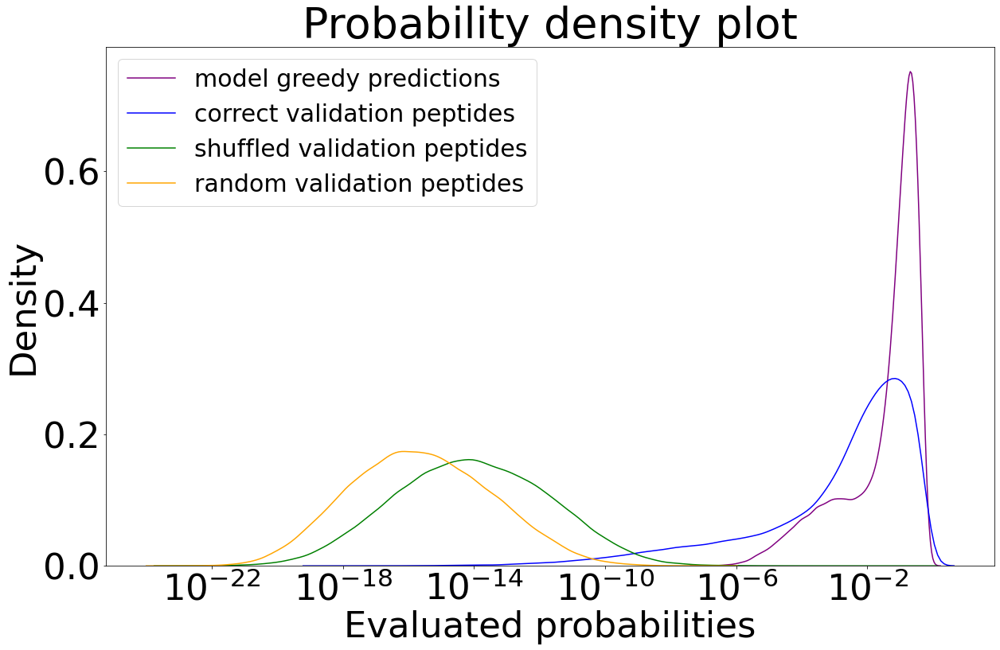

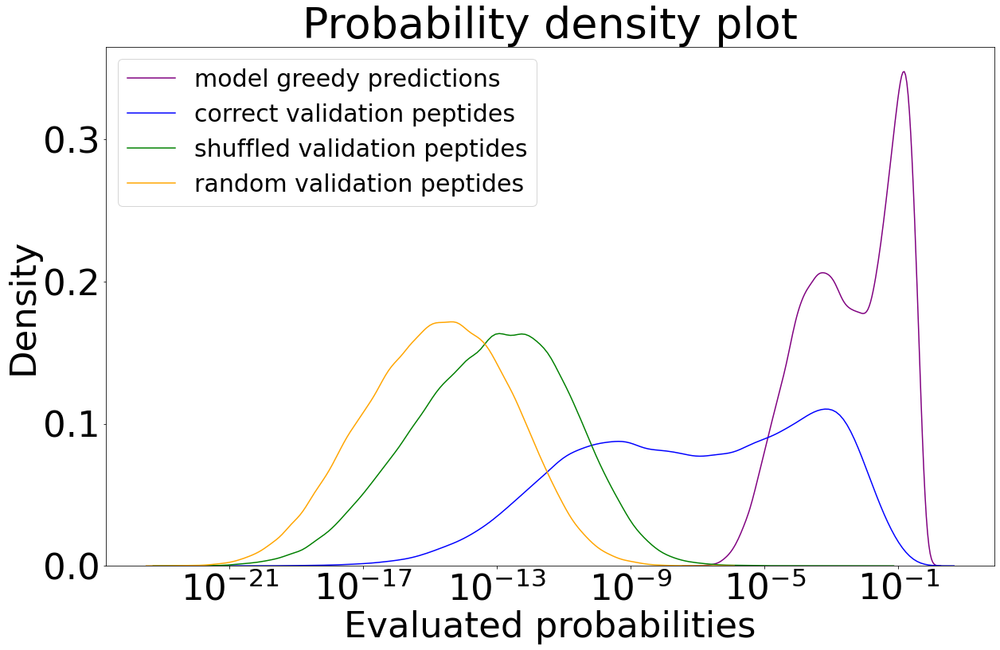

In [42]:
# seen comp be 1, unseen comp be 0
seen_comp_list = []

# create a train_comp dict to check if the comp is seen
train_comp_dict = {}
for target, value_dict in train_dict.items():
    for comp, count in value_dict.items():
        train_comp_dict[comp] = 1

# use train_comp dict to check if the comp is seen
for target, comp, count in validation_array:
    if comp in train_comp_dict:
        seen_comp_list.append(1)
    else:
        seen_comp_list.append(0)
seen_comp_array = np.array(seen_comp_list)

print("seen_comp_array: ", seen_comp_array)
print("seen_comp_array shape: ", seen_comp_array.shape)
print("number of 1: ", len(seen_comp_array[seen_comp_array==1]))
print("number of 0: ", len(seen_comp_array[seen_comp_array==0]))

peptide_pred_prob_seen_comp = peptide_pred_prob[seen_comp_array==1]
peptide_pred_prob_unseen_comp = peptide_pred_prob[seen_comp_array==0]

peptide_eval_prob_seen_comp = peptide_eval_prob[seen_comp_array==1]
peptide_eval_prob_unseen_comp = peptide_eval_prob[seen_comp_array==0]

peptide_eval_shuffled_prob_seen_comp = peptide_eval_shuffled_prob[seen_comp_array==1]
peptide_eval_shuffled_prob_unseen_comp = peptide_eval_shuffled_prob[seen_comp_array==0]

peptide_eval_random_prob_seen_comp = peptide_eval_random_prob[seen_comp_array==1]
peptide_eval_random_prob_unseen_comp = peptide_eval_random_prob[seen_comp_array==0]

plt.rcParams.update({
    'font.size': 45,
    'font.family': 'Liberation Sans',
    'lines.linewidth': 4,
})

plt.figure(figsize=(20, 12), facecolor=(1, 1, 1))
k0 = sns.kdeplot(peptide_pred_prob_seen_comp, log_scale=10, label= "model greedy predictions", c='purple')
k1 = sns.kdeplot(peptide_eval_prob_seen_comp, log_scale=10, label= "correct validation peptides", c='blue')
k2 = sns.kdeplot(peptide_eval_shuffled_prob_seen_comp, log_scale=10, label= "shuffled validation peptides", c='green')
k3 = sns.kdeplot(peptide_eval_random_prob_seen_comp, log_scale=10, label= "random validation peptides", c = 'orange')

plt.xlabel('Evaluated probabilities')
plt.legend(fontsize=30)
plt.title('Probability density plot')
plt.savefig('model_evaluation/evaluated_density_plot_seen_comp.png', dpi=300)
plt.show()

plt.figure(figsize=(20, 12), facecolor=(1, 1, 1))
k0 = sns.kdeplot(peptide_pred_prob_unseen_comp, log_scale=10, label= "model greedy predictions", c='purple')
k1 = sns.kdeplot(peptide_eval_prob_unseen_comp, log_scale=10, label= "correct validation peptides", c='blue')
k2 = sns.kdeplot(peptide_eval_shuffled_prob_unseen_comp, log_scale=10, label= "shuffled validation peptides", c='green')
k3 = sns.kdeplot(peptide_eval_random_prob_unseen_comp, log_scale=10, label= "random validation peptides", c = 'orange')

plt.xlabel('Evaluated probabilities')
plt.legend(fontsize=30)
plt.title('Probability density plot')
plt.savefig('model_evaluation/evaluated_density_plot_unseen_comp.png', dpi=300)
plt.show()

seen_none_array:  [0 0 1 ... 1 1 1]
seen_none_array shape:  (214881,)
number of 1:  135101
number of 0:  79780


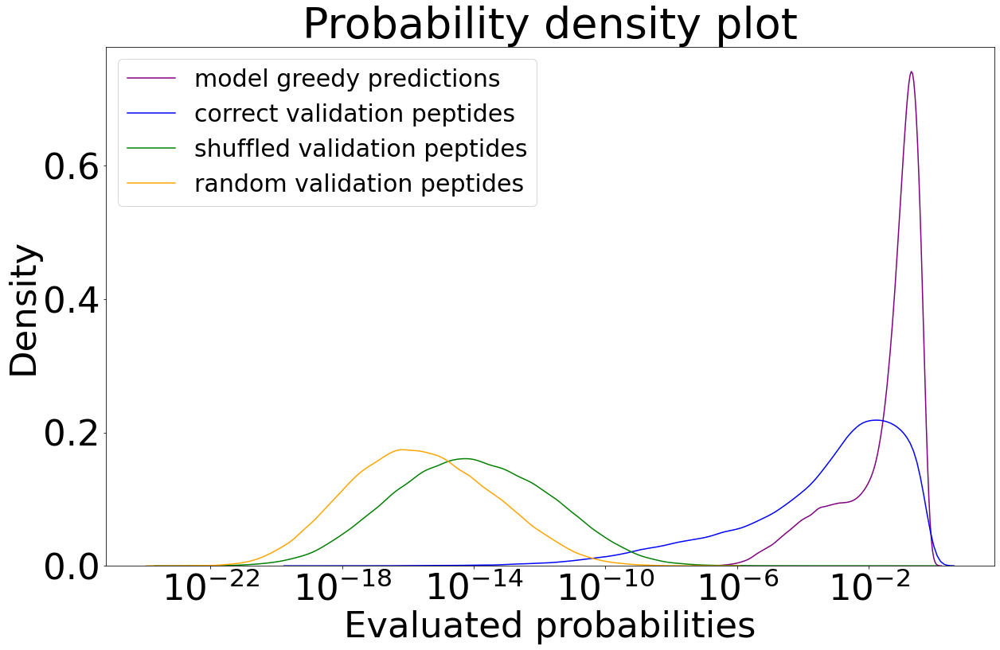

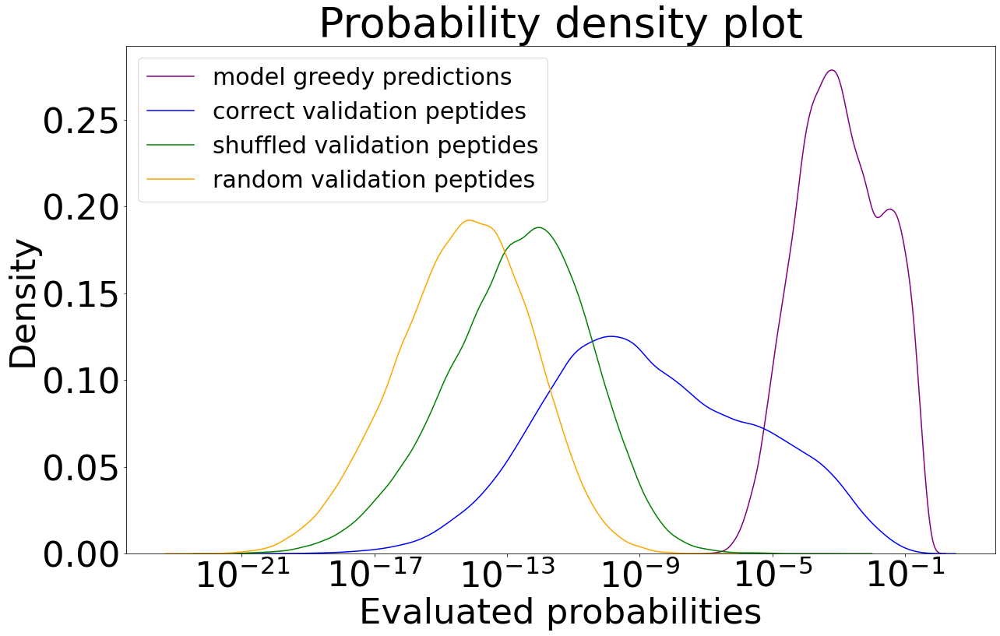

In [43]:
# seen comp be 1, unseen comp be 0
seen_none_list = []
# combine seen_list and seen_comp_list
for i in range(len(seen_list)):
	if seen_list[i] == 1 or seen_comp_list[i] == 1:
		seen_none_list.append(1)
	else:
		seen_none_list.append(0)
seen_none_array = np.array(seen_none_list)

print("seen_none_array: ", seen_none_array)
print("seen_none_array shape: ", seen_none_array.shape)
print("number of 1: ", len(seen_none_array[seen_none_array==1]))
print("number of 0: ", len(seen_none_array[seen_none_array==0]))

peptide_pred_prob_seen_none = peptide_pred_prob[seen_none_array==1]
peptide_pred_prob_unseen_none = peptide_pred_prob[seen_none_array==0]

peptide_eval_prob_seen_none = peptide_eval_prob[seen_none_array==1]
peptide_eval_prob_unseen_none = peptide_eval_prob[seen_none_array==0]

peptide_eval_shuffled_prob_seen_none = peptide_eval_shuffled_prob[seen_none_array==1]
peptide_eval_shuffled_prob_unseen_none = peptide_eval_shuffled_prob[seen_none_array==0]

peptide_eval_random_prob_seen_none = peptide_eval_random_prob[seen_none_array==1]
peptide_eval_random_prob_unseen_none = peptide_eval_random_prob[seen_none_array==0]

plt.rcParams.update({
    'font.size': 45,
    'font.family': 'Liberation Sans',
    'lines.linewidth': 4,
})

plt.figure(figsize=(20, 12), facecolor=(1, 1, 1))
k0 = sns.kdeplot(peptide_pred_prob_seen_none, log_scale=10, label= "model greedy predictions", c='purple')
k1 = sns.kdeplot(peptide_eval_prob_seen_none, log_scale=10, label= "correct validation peptides", c='blue')
k2 = sns.kdeplot(peptide_eval_shuffled_prob_seen_none, log_scale=10, label= "shuffled validation peptides", c='green')
k3 = sns.kdeplot(peptide_eval_random_prob_seen_none, log_scale=10, label= "random validation peptides", c = 'orange')

plt.xlabel('Evaluated probabilities')
plt.legend(fontsize=30)
plt.title('Probability density plot')
plt.savefig('model_evaluation/evaluated_density_plot_seen_none.png', dpi=300)
plt.show()

plt.figure(figsize=(20, 12), facecolor=(1, 1, 1))
k0 = sns.kdeplot(peptide_pred_prob_unseen_none, log_scale=10, label= "model greedy predictions", c='purple')
k1 = sns.kdeplot(peptide_eval_prob_unseen_none, log_scale=10, label= "correct validation peptides", c='blue')
k2 = sns.kdeplot(peptide_eval_shuffled_prob_unseen_none, log_scale=10, label= "shuffled validation peptides", c='green')
k3 = sns.kdeplot(peptide_eval_random_prob_unseen_none, log_scale=10, label= "random validation peptides", c = 'orange')

plt.xlabel('Evaluated probabilities')
plt.legend(fontsize=30)
plt.title('Probability density plot')
plt.savefig('model_evaluation/evaluated_density_plot_unseen_none.png', dpi=300)
plt.show()

# Task 4: Attention analysis (original)

In [3]:
# load training data
train_dict = np.load('train_l8_anti/train_dict_fold0.npy', allow_pickle=True)
train_dict = train_dict.tolist()
train_list = []
for target, value_dict in train_dict.items():
    for comp, count in value_dict.items():
        train_list.append([target, comp, count])
train_array = np.array(train_list)

In [4]:
import pickle
import numpy as np
import torch
import torch.nn as nn
from d2l import torch as d2l
import os

from TransformerBeta import *
import warnings
warnings.filterwarnings("ignore", message="mybio.py module not found")
warnings.filterwarnings("ignore", message="zyggregator not found!!!")

"""---------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------"""
"""Data preprocessing"""

amino_dict = {
		'<bos>': 0, 
		'<eos>': 1, 
		'<pad>': 2, 
		'<unk>': 3,
		'A': 4,
		'C': 5,
		'D': 6, 
		'E': 7,
		'F': 8, 
		'G': 9, 
		'H': 10,
		'I': 11, 
		'K': 12, 
		'L': 13, 
		'M': 14, 
		'N': 15, 
		'P': 16, 
		'Q': 17, 
		'R': 18, 
		'S': 19, 
		'T': 20, 
		'V': 21, 
		'W': 22, 
		'Y': 23 
		}


data_list_antiparallel= []
data_list_parallel= []

for i in range(1, 9):
	with open('BSn_libraries/BSn_libraries_copy/anti_frag_dic_{}.pkl'.format(i), 'rb') as f:
		data = pickle.load(f, encoding='latin1')
		data_list_antiparallel.append(data)

	with open('BSn_libraries/BSn_libraries_copy/para_frag_dic_{}.pkl'.format(i), 'rb') as f:
		data = pickle.load(f, encoding='latin1')
		data_list_parallel.append(data)

# target, complementary_seq, counts, promiscuity, length, working_score, hb_pattern, para/anti, freq
BSn_data = []
least_length = 3

for frag_i_data in data_list_parallel[least_length-1:]:
	for keys in frag_i_data.keys():

		length = len(keys)
		freq = len(frag_i_data[keys])
		for element in frag_i_data[keys]:

			working_score = length**2 * element.count_score - 0.01 * length * element.promiscuity_score
			list_i = [keys, element.complementary_sequence, element.count_score, element.promiscuity_score, length, working_score, element.hb_pattern, 0, freq]
			BSn_data.append(list_i)

for frag_i_data in data_list_antiparallel[least_length-1:]:
	for keys in frag_i_data.keys():

		length = len(keys)
		freq = len(frag_i_data[keys])
		for element in frag_i_data[keys]:

			working_score = length**2 * element.count_score - 0.01 * length * element.promiscuity_score
			list_i = [keys, element.complementary_sequence, element.count_score, element.promiscuity_score, length, working_score, element.hb_pattern, 1, freq]
			BSn_data.append(list_i)

# target, complementary_seq, counts, promiscuity, length, working_score, hb_pattern, para/anti, freq

BSn_data_dataset_sequence = np.array(BSn_data, dtype=object)
BSn_data_dataset2 = np.array(BSn_data_dataset_sequence)

target_indices = np.arange(BSn_data_dataset2.shape[0]).reshape(-1, 1)
BSn_data_dataset2_indices = np.hstack([BSn_data_dataset2, target_indices])

condition1 = np.nonzero(np.array([len(sequence)==8 and type ==1 for type, sequence in zip(BSn_data_dataset2_indices[:, 7], BSn_data_dataset2_indices[:, 0])]))
BSn_data_dataset2_indices_length8 = BSn_data_dataset2_indices[condition1]

WARNING mybio.py module not found - excecution may fail
WARNING zyggregator not found!!!


In [47]:
# extract a subset of train data
# print out some samples
num_seq = 1000
count_max = 100000
count_min = 100

validation_top_count = []
for data in train_array:
    if int(data[2]) <= count_max and int(data[2]) >= count_min:
        validation_top_count.append(data)
    if len(validation_top_count) > num_seq:
        break
validation_top_count = np.array(validation_top_count[:num_seq])   
print(len(validation_top_count))
print(validation_top_count[:20])

1000
[['YILLKGTL' 'RKILDIKA' '108']
 ['TLIFYNIY' 'VSHILSMT' '248']
 ['TMSLIHSV' 'YINYFILT' '250']
 ['KELWWFKI' 'VVIRCKYE' '105']
 ['VAQATEGQ' 'SWVAAKWK' '162']
 ['VAQATEGE' 'SWVAAKWK' '173']
 ['THLVSVFA' 'LMKGDLAI' '126']
 ['IALDGKML' 'AFVSVLHT' '126']
 ['YQIADQTI' 'SKFLVFLN' '120']
 ['NLFVLFKS' 'ITQDAIQY' '120']
 ['QNTQLYVE' 'QEGVVSVT' '108']
 ['FSDESRFN' 'IAGWVMVG' '782']
 ['FSDESRFM' 'FMGWVMIS' '318']
 ['ALLFDFKN' 'LELNDLKY' '176']
 ['YKLDNLEL' 'NKFDFLLA' '176']
 ['RLACYVTG' 'ELVVLVQY' '120']
 ['YQVLVVLE' 'GTVYCALR' '120']
 ['ISIRLWQP' 'AFWSCVET' '122']
 ['GGKLGYKQ' 'AFKFAIDF' '468']
 ['FSAGGYFA' 'YGLTLLAD' '505']]


In [6]:
# extract a subset of BSn data
# assign data to use 
BSn_target = BSn_data_dataset2_indices_length8[:, 0]
BSn_complementary = BSn_data_dataset2_indices_length8[:, 1]
BSn_count = BSn_data_dataset2_indices_length8[:, 2]
BSn_hb = BSn_data_dataset2_indices_length8[:, 6]
print(len(BSn_data_dataset2_indices_length8))


# Combine target, comp, and count into a single array of shape (n_data, 3)
BSn_combined_data = np.column_stack((BSn_target, BSn_complementary, BSn_count))
print(BSn_combined_data[:20])

49378
[['VTPRVSYA' 'YDAGVIVQ' 1]
 ['SIHVVEVQ' 'VTSTLKYH' 1]
 ['SIHVVEVQ' 'ILIVGAFG' 1]
 ['CNKSWRCG' 'YAQYYGKY' 1]
 ['VLEVRGEV' 'RYVLSLAV' 1]
 ['FHLYLMHK' 'YTAHRLSW' 1]
 ['VLVNYIYF' 'FLASGTSI' 1]
 ['SIHVVEVK' 'VTSTLKYV' 1]
 ['LALLIGYG' 'RVVQAAYS' 1]
 ['GKYELKVL' 'AQFNYTDY' 1]
 ['TLERRYWL' 'SLSWRVRQ' 1]
 ['LRLCLSRT' 'VSLTGIVT' 1]
 ['TYTFQLQD' 'VVTSHNTA' 1]
 ['YLVTIVLN' 'RTITMRVR' 1]
 ['SLSSSVTV' 'KVLCGLTV' 1]
 ['RDFVVLRT' 'LVYQYIET' 1]
 ['YDFELIFS' 'IRSTARKS' 1]
 ['TFSQPVTI' 'TGSFTTTG' 1]
 ['RLFKGIVK' 'YGIVTKFY' 1]
 ['FQLSLAFP' 'SKQTYSAG' 2]]


#### Target of selection

In [99]:
task_target = 'FGSYVAFI'
model_use = model_standard
prediction_length = 8

#### Search training database

In [100]:
# dataset search
print("Training Dataset search result: \n", search_target(train_array, task_target))
# dataset search
print("BSn Dataset search result: \n", search_target(BSn_combined_data, task_target))

Training Dataset search result: 
 [['FGSYVAFI' 'TSGTKHVW' '13']
 ['FGSYVAFI' 'AAGTKHVW' '5']]
BSn Dataset search result: 
 []


#### Greedy single prediction

In [101]:
dec_comple_peptide_pred, dec_prob, dec_attention_weight_seq = predict_greedy_single(model_use, task_target, amino_dict, prediction_length + 2, device, save_attention_weights=True, print_info=True)

Conditional probability at position 1 is 0.965632975101471
Conditional probability at position 2 is 0.9032230377197266
Conditional probability at position 3 is 0.9533034563064575
Conditional probability at position 4 is 0.9339156746864319
Conditional probability at position 5 is 0.8827058672904968
Conditional probability at position 6 is 0.6029351353645325
Conditional probability at position 7 is 0.743421733379364
Conditional probability at position 8 is 0.942155659198761
Input target sequence is FGSYVAFI, predicted complementary peptide is TSGTKHVW
Condition on input, predicted probability is 0.2894612589498489


#### Candidates sampling

In [98]:
num_candidates = 10
max_iter = 20

peptide_candidates = sample_candidates(model_use, task_target, num_candidates, amino_dict, prediction_length + 2, device, max_iter=max_iter)
print(peptide_candidates)

number of total candidates sampled: 22
number of unique top candidates successfully sampled: 10
[['IFAVYSGF' '0.21944239735603333']
 ['VFAVYSGF' '0.1367301344871521']
 ['IFAAYSGF' '0.0216115340590477']
 ['VFAVYAGF' '0.013168509118258953']
 ['VFAAYSGF' '0.011883107014000416']
 ['IFCVYSGF' '0.0013247266178950667']
 ['LFSVYSGF' '0.0008733020513318479']
 ['IFAVYIGF' '0.00028012465918436646']
 ['IFAIYSNF' '9.073015098692849e-05']
 ['VFAAYTSF' '2.2317946786643006e-05']]


#### Peptides pair evaluation

In [94]:
task_target = task_target
dec_comple_peptide_pred = 'GWTFYYPK'

dec_prob, dec_attention_weight_seq = evaluate_single(model_use, task_target, dec_comple_peptide_pred,amino_dict, prediction_length + 2, device, save_attention_weights=True, print_info=True)

Conditional probability at position 1 is 0.9472663402557373
Conditional probability at position 2 is 0.21951799094676971
Conditional probability at position 3 is 0.9620195031166077
Conditional probability at position 4 is 0.9347108006477356
Conditional probability at position 5 is 0.9345396161079407
Conditional probability at position 6 is 0.8677448034286499
Conditional probability at position 7 is 0.9292095303535461
Conditional probability at position 8 is 0.7683368921279907
Input target sequence is GMAVAIIY, complementary peptide is GWTFYYPK
Evaluated probability is 0.10825761185631548


#### Visualize attention

In [10]:
# attention weights preprocessing

encoder_self_attention_raw = [torch.unsqueeze(attention, dim=0) for attention in model_use.encoder.attention_weights]
decoder_self_attention_raw = [torch.unsqueeze(attention, dim=0) for attention in dec_attention_weight_seq[-1][0]]
decoder_encoder_attention_raw = [torch.unsqueeze(attention, dim=0) for attention in dec_attention_weight_seq[-1][1]]

encoder_self_attention = [torch.tensor(np.delete(np.delete(layer_attention.detach().numpy(), [-2, -1], 3), [-2, -1], 2)) for layer_attention in encoder_self_attention_raw]
decoder_self_attention = [torch.tensor(np.delete(np.delete(layer_attention.detach().numpy(), -1, 3), -1, 2)) for layer_attention in decoder_self_attention_raw]
decoder_encoder_attention = [torch.tensor(np.delete(np.delete(layer_attention.detach().numpy(), [-2, -1], 3), -1, 2)) for layer_attention in decoder_encoder_attention_raw]
print(encoder_self_attention[0].shape)
print(decoder_self_attention[0].shape)
print(decoder_encoder_attention[0].shape)

# encoder_text = d2l.truncate_pad(list(task_target) + ['<eos>'], prediction_length+2, '<pad>')
# decoder_text = ['<bos>'] + list(dec_comple_peptide_pred)

encoder_text = list(task_target)
decoder_text = list(dec_comple_peptide_pred)

print(encoder_text)
print(decoder_text)

torch.Size([1, 8, 8, 8])
torch.Size([1, 8, 8, 8])
torch.Size([1, 8, 8, 8])
['W', 'V', 'L', 'C', 'L', 'A', 'M', 'G']
['Q', 'L', 'L', 'L', 'G', 'E', 'I', 'C']


In [11]:
# attention model view

from bertviz import model_view

model_view(
	encoder_attention=encoder_self_attention, 
	decoder_attention=decoder_self_attention,
	cross_attention=decoder_encoder_attention, 
	encoder_tokens=encoder_text,
	decoder_tokens=decoder_text, 
	display_mode="light"
)

<IPython.core.display.Javascript object>

In [12]:
# attention head_view

from bertviz import head_view
head_view(
	encoder_attention=encoder_self_attention, 
	decoder_attention=decoder_self_attention,
	cross_attention=decoder_encoder_attention, 
	encoder_tokens=encoder_text,
	decoder_tokens=decoder_text, 
)

<IPython.core.display.Javascript object>

# Task 4: Attention analysis (additional)

In [102]:
# 0.1 load the model
model_path = "model_M_23Apr10_0108PM" # <------------------------------------------------------------------------change
# model_path = "model_M_reverse_23Apr18_0432PM" # <------------------------------------------------------------------------change

query_size, key_size, value_size, num_hiddens = 512, 512, 512, 512
num_layers, dropout = 6, 0.2
lr, training_steps, batch_size, label_smoothing = 0.0004, 300000, 4096, 0.1
ffn_num_input, ffn_num_hiddens, num_heads = 512, 2048, 8

norm_shape = [512] # 512 corresponds to the dim of such number to normalize
device = d2l.try_gpu()

encoder_standard = TransformerEncoder(
	len(amino_dict), key_size, query_size, value_size, num_hiddens, 
	norm_shape, ffn_num_input, ffn_num_hiddens, num_heads,
	num_layers, dropout)
decoder_standard = TransformerDecoder(
	len(amino_dict), key_size, query_size, value_size, num_hiddens, 
	norm_shape, ffn_num_input, ffn_num_hiddens, num_heads,
	num_layers, dropout, shared_embedding=encoder_standard.embedding)
model_standard = EncoderDecoder(encoder_standard, decoder_standard)

model_standard_total_params = sum(p.numel() for p in model_standard.parameters())
model_standard_total_trainable_params = sum(p.numel() for p in model_standard.parameters() if p.requires_grad)

state_dict = torch.load(model_path,map_location=('cpu'))
from collections import OrderedDict
new_state_dict = OrderedDict()
for k, v in state_dict.items():
	name = k[7:] #remove 'module'
	new_state_dict[name] = v

model_standard.load_state_dict(new_state_dict)

model_use = model_standard # <------------------------------------------------------------------------change
prediction_length = 8 # <------------------------------------------------------------------------change

# 0.2 create a txt file to record the results
if not os.path.exists('model_evaluation'):
	os.mkdir('model_evaluation')
print('Standard model: total number of parameters: {}'.format(model_standard_total_params))
print('Standard model: total number of trainable parameters: {}'.format(model_standard_total_trainable_params))

Standard model: total number of parameters: 44126232
Standard model: total number of trainable parameters: 44126232


In [4]:
# load training data
train_dict = np.load('train_l8_anti/train_dict_fold0.npy', allow_pickle=True)
train_dict = train_dict.tolist()
train_list = []
for target, value_dict in train_dict.items():
    for comp, count in value_dict.items():
        train_list.append([target, comp, count])
train_array = np.array(train_list)

In [105]:
# extract a subset of train data
# print out some samples
num_seq = 1000
count_max = 100000
count_min = 1000

train_top_count = []
for data in train_array:
    if int(data[2]) <= count_max and int(data[2]) >= count_min:
        train_top_count.append(data)
    if len(train_top_count) > num_seq:
        break
train_top_count = np.array(train_top_count[:num_seq])   
print(len(train_top_count))
print(train_top_count[:20])

788
[['RALRLEDL' 'PTVRFAAL' '52354']
 ['RALRLEDL' 'PTMRFAAL' '4463']
 ['RALRLEDL' 'PSVRFAAL' '2567']
 ['ALRLEDLR' 'TVRFAALI' '19000']
 ['ALRLEDLR' 'TMRFAALI' '10162']
 ['ALRLEDLR' 'SVRFAALI' '1238']
 ['RKIAVYDL' 'IEIISVDF' '1698']
 ['DIEIIEAH' 'AFLVTHDG' '1436']
 ['DIEIIEAH' 'AFMATHEG' '1489']
 ['GTKLVTVH' 'FTAEVQID' '1853']
 ['GTKLVTVH' 'FTAEVQVD' '3125']
 ['GTKLVTVH' 'FTAEVQVE' '1558']
 ['YGHAYVPL' 'DIVVRSLA' '1663']
 ['GLMFGYAC' 'YAVQVECR' '1220']
 ['HTLNGSGL' 'VIQVMEVK' '3736']
 ['HTLNGSGL' 'VFKVLEVK' '1282']
 ['AFFQFYVA' 'QYLQCSLK' '3875']
 ['CIIVCSIE' 'RVVEMEYE' '5549']
 ['CIIVCSIE' 'RVVEMEFE' '1295']
 ['SDFSLVRL' 'IDVILVLE' '1015']]


In [66]:
task_target = 'RALRLEDL'
model_use = model_standard
prediction_length = 8

In [67]:
task_target = task_target
dec_comple_peptide_pred = 'PTMRFAAL'
# dec_comple_peptide_pred = 'PTMRFAAL'[::-1]

dec_prob, dec_attention_weight_seq = evaluate_single(model_use, task_target, dec_comple_peptide_pred,amino_dict, prediction_length + 2, device, save_attention_weights=True, print_info=True)

Conditional probability at position 1 is 0.9359272122383118
Conditional probability at position 2 is 0.9008457660675049
Conditional probability at position 3 is 0.11286001652479172
Conditional probability at position 4 is 0.9406906366348267
Conditional probability at position 5 is 0.9496768712997437
Conditional probability at position 6 is 0.9347270727157593
Conditional probability at position 7 is 0.9356752038002014
Conditional probability at position 8 is 0.9418700933456421
Input target sequence is RALRLEDL, complementary peptide is PTMRFAAL
Evaluated probability is 0.0700255062760922


In [68]:
# attention weights preprocessing

encoder_self_attention_raw = [torch.unsqueeze(attention, dim=0) for attention in model_use.encoder.attention_weights]
decoder_self_attention_raw = [torch.unsqueeze(attention, dim=0) for attention in dec_attention_weight_seq[-1][0]]
decoder_encoder_attention_raw = [torch.unsqueeze(attention, dim=0) for attention in dec_attention_weight_seq[-1][1]]

# encoder_self_attention = [torch.tensor(np.delete(np.delete(layer_attention.detach().numpy(), [-2, -1], 3), [-2, -1], 2)) for layer_attention in encoder_self_attention_raw]
# decoder_self_attention = [torch.tensor(np.delete(np.delete(layer_attention.detach().numpy(), 0, 3), 0, 2)) for layer_attention in decoder_self_attention_raw]
# decoder_encoder_attention = [torch.tensor(np.delete(np.delete(layer_attention.detach().numpy(), [0], 2), [-2, -1], 3)) for layer_attention in decoder_encoder_attention_raw]
# print(encoder_self_attention[0].shape)
# print(decoder_self_attention[0].shape)
# print(decoder_encoder_attention[0].shape)
# encoder_text = list(task_target)
# decoder_text = list(dec_comple_peptide_pred)
# print(encoder_text)
# print(decoder_text)

# encoder_self_attention = [torch.tensor(layer_attention.detach().numpy()) for layer_attention in encoder_self_attention_raw]
# decoder_self_attention = [torch.tensor(layer_attention.detach().numpy()) for layer_attention in decoder_self_attention_raw]
# decoder_encoder_attention = [torch.tensor(layer_attention.detach().numpy()) for layer_attention in decoder_encoder_attention_raw]
# encoder_text = d2l.truncate_pad(list(task_target) + ['<eos>'], prediction_length+2, '<pad>')
# decoder_text = ['<bos>'] + list(dec_comple_peptide_pred)
# print(encoder_self_attention[0].shape)
# print(decoder_self_attention[0].shape)
# print(decoder_encoder_attention[0].shape)
# print(encoder_text)
# print(decoder_text)

encoder_self_attention = [torch.tensor(np.delete(np.delete(layer_attention.detach().numpy(), -1, 3), -1, 2)) for layer_attention in encoder_self_attention_raw]
decoder_self_attention = [torch.tensor(layer_attention.detach().numpy()) for layer_attention in decoder_self_attention_raw]
decoder_encoder_attention = [torch.tensor(np.delete(layer_attention.detach().numpy(), -1, 3)) for layer_attention in decoder_encoder_attention_raw]
print(encoder_self_attention[0].shape)
print(decoder_self_attention[0].shape)
print(decoder_encoder_attention[0].shape)
encoder_text = list(task_target) + ['<eos>']
decoder_text = ['<bos>'] + list(dec_comple_peptide_pred)
print(encoder_text)
print(decoder_text)

torch.Size([1, 8, 9, 9])
torch.Size([1, 8, 9, 9])
torch.Size([1, 8, 9, 9])
['R', 'A', 'L', 'R', 'L', 'E', 'D', 'L', '<eos>']
['<bos>', 'P', 'T', 'M', 'R', 'F', 'A', 'A', 'L']


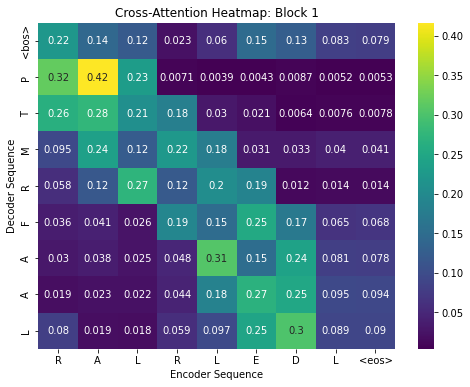

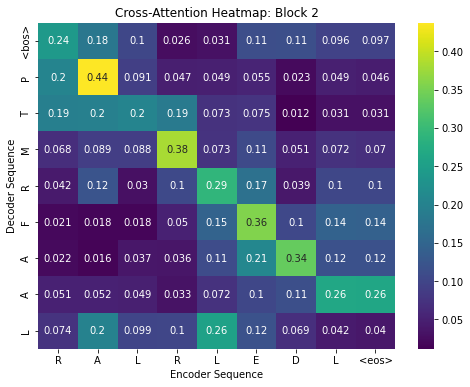

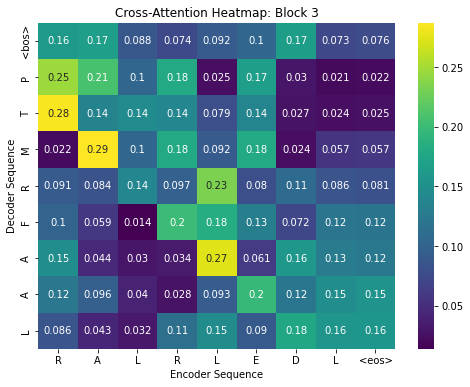

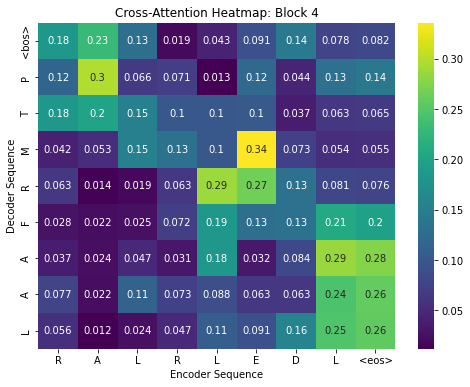

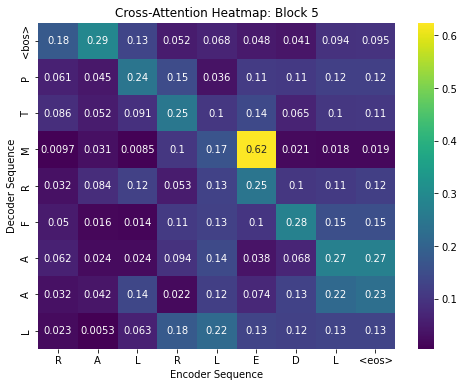

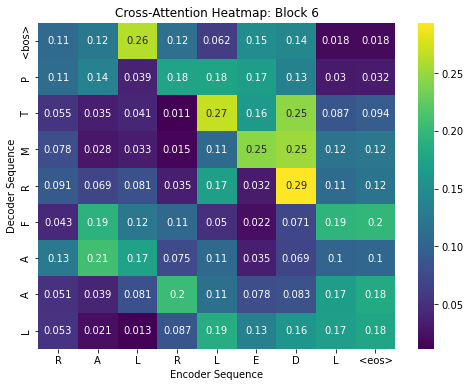

In [69]:
import seaborn as sns
import matplotlib.pyplot as plt

def plot_attention_heatmap(attention, encoder_text, decoder_text, block):
    plt.figure(figsize=(8, 6))
    sns.heatmap(attention[0], annot=True, cmap='viridis', xticklabels=encoder_text, yticklabels=decoder_text)
    plt.title(f'Cross-Attention Heatmap: Block {block}')
    plt.xlabel('Encoder Sequence')
    plt.ylabel('Decoder Sequence')
    plt.show()

decoder_encoder_attention_avg = [torch.mean(layer_attention, dim=1) for layer_attention in decoder_encoder_attention]

# Visualize the attention heatmap for each block
for i, attention in enumerate(decoder_encoder_attention_avg):
    plot_attention_heatmap(attention.detach().numpy(), encoder_text, decoder_text, i+1)

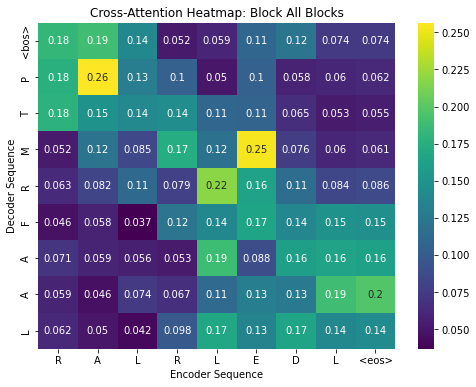

In [70]:
# Calculate the average cross-attention across all blocks
decoder_encoder_attention_blocks_avg = torch.mean(torch.stack(decoder_encoder_attention_avg, dim=0), dim=0)

# Visualize the average cross-attention heatmap
plot_attention_heatmap(decoder_encoder_attention_blocks_avg.detach().numpy(), encoder_text, decoder_text, 'All Blocks')

#### forward directed analysis on 1000 random data

Processed 100 data pairs.
Processed 200 data pairs.
Processed 300 data pairs.
Processed 400 data pairs.
Processed 500 data pairs.
Processed 600 data pairs.
Processed 700 data pairs.
Processed 800 data pairs.
Processed 900 data pairs.
Processed 1000 data pairs.


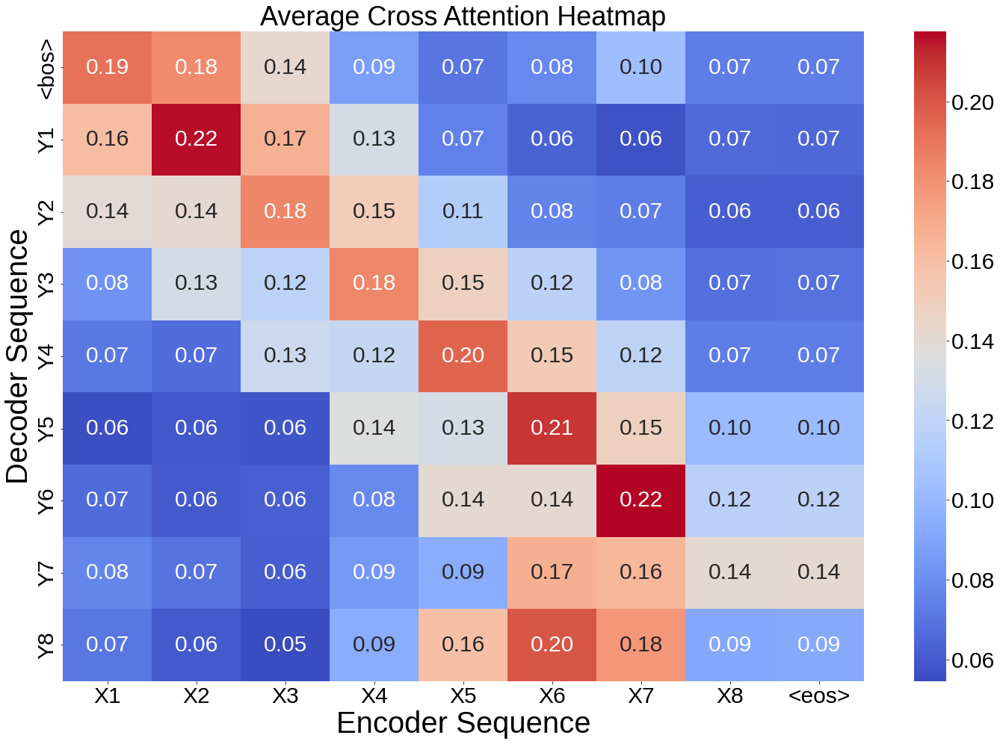

In [5]:
import numpy as np
import torch
import seaborn as sns
import matplotlib.pyplot as plt

# 1. Import the necessary libraries
import random

def plot_attention_heatmap(attention_matrix, encoder_text, decoder_text, title, save_path=None):
    plt.rcParams.update({
        'font.size': 30,
        'font.family': 'Liberation Sans',
        'lines.linewidth': 3,
    })
    plt.figure(figsize=(24, 16), facecolor=(1, 1, 1))
    sns.heatmap(attention_matrix, xticklabels=encoder_text, yticklabels=decoder_text, cmap="coolwarm", annot=True, fmt=".2f")
    plt.xlabel("Encoder Sequence", fontsize=40)
    plt.ylabel("Decoder Sequence", fontsize=40)
    plt.title(title, fontsize=40)
    plt.title(title)
    if save_path:
        plt.savefig(save_path, bbox_inches='tight')
    plt.show()

# 2. Modify the train_array to have 10,00 random samples
random_indices = np.random.choice(train_array.shape[0], 1000, replace=False)
train_array_random = train_array[random_indices]

# 3. Create a function to process a single data pair and return the average attention heatmap
def process_data_pair(model_use, task_target, dec_comple_peptide_pred, device):
    dec_prob, dec_attention_weight_seq = evaluate_single(model_use, task_target, dec_comple_peptide_pred, amino_dict, prediction_length + 2, device, save_attention_weights=True, print_info=False)
    decoder_encoder_attention_raw = [torch.unsqueeze(attention, dim=0) for attention in dec_attention_weight_seq[-1][1]]
    decoder_encoder_attention = [torch.tensor(np.delete(layer_attention.detach().numpy(), -1, 3)) for layer_attention in decoder_encoder_attention_raw]
    decoder_encoder_attention_avg = [torch.mean(layer_attention, dim=1) for layer_attention in decoder_encoder_attention]
    decoder_encoder_attention_blocks_avg = torch.mean(torch.stack(decoder_encoder_attention_avg, dim=0), dim=0)
    
    return decoder_encoder_attention_blocks_avg

# 4. Loop through the randomly selected data pairs, process them, and print the informative messages
attention_blocks_avg_list = []

for i, data_pair in enumerate(train_array_random):
    task_target, dec_comple_peptide_pred, _ = data_pair
    attention_blocks_avg = process_data_pair(model_use, task_target, dec_comple_peptide_pred, device)
    attention_blocks_avg_list.append(attention_blocks_avg)
    
    if (i + 1) % 100 == 0:
        print(f'Processed {i + 1} data pairs.')


encoder_text = ['X1', 'X2', 'X3', 'X4', 'X5', 'X6', 'X7', 'X8', '<eos>']
decoder_text = ['<bos>', 'Y1', 'Y2', 'Y3', 'Y4', 'Y5', 'Y6', 'Y7', 'Y8']
# 5. Calculate the average attention heatmap over all the 1,000 data pairs
final_attention_blocks_avg = torch.mean(torch.stack(attention_blocks_avg_list, dim=0), dim=0).squeeze()

# 6. Plot the final average attention heatmap
# plot_attention_heatmap(final_attention_blocks_avg.detach().numpy(), encoder_text, decoder_text, 'Average Cross Attention Heatmap', save_path='model_evaluation/avg_attention_heatmap.png')

#### reverse analysis

In [60]:
# 0.1 load the model
# model_path = "model_M_23Apr10_0108PM" # <------------------------------------------------------------------------change
model_path = "model_M_reverse_23Apr18_0432PM" # <------------------------------------------------------------------------change

query_size, key_size, value_size, num_hiddens = 512, 512, 512, 512
num_layers, dropout = 6, 0.2
lr, training_steps, batch_size, label_smoothing = 0.0004, 300000, 4096, 0.1
ffn_num_input, ffn_num_hiddens, num_heads = 512, 2048, 8

norm_shape = [512] # 512 corresponds to the dim of such number to normalize
device = d2l.try_gpu()

encoder_standard = TransformerEncoder(
	len(amino_dict), key_size, query_size, value_size, num_hiddens, 
	norm_shape, ffn_num_input, ffn_num_hiddens, num_heads,
	num_layers, dropout)
decoder_standard = TransformerDecoder(
	len(amino_dict), key_size, query_size, value_size, num_hiddens, 
	norm_shape, ffn_num_input, ffn_num_hiddens, num_heads,
	num_layers, dropout, shared_embedding=encoder_standard.embedding)
model_standard = EncoderDecoder(encoder_standard, decoder_standard)

model_standard_total_params = sum(p.numel() for p in model_standard.parameters())
model_standard_total_trainable_params = sum(p.numel() for p in model_standard.parameters() if p.requires_grad)

state_dict = torch.load(model_path,map_location=('cpu'))
from collections import OrderedDict
new_state_dict = OrderedDict()
for k, v in state_dict.items():
	name = k[7:] #remove 'module'
	new_state_dict[name] = v

model_standard.load_state_dict(new_state_dict)

model_use = model_standard # <------------------------------------------------------------------------change
prediction_length = 8 # <------------------------------------------------------------------------change

# 0.2 create a txt file to record the results
if not os.path.exists('model_evaluation'):
	os.mkdir('model_evaluation')
print('Standard model: total number of parameters: {}'.format(model_standard_total_params))
print('Standard model: total number of trainable parameters: {}'.format(model_standard_total_trainable_params))

Standard model: total number of parameters: 44126232
Standard model: total number of trainable parameters: 44126232


Processed 100 data pairs.
Processed 200 data pairs.
Processed 300 data pairs.
Processed 400 data pairs.
Processed 500 data pairs.
Processed 600 data pairs.
Processed 700 data pairs.
Processed 800 data pairs.
Processed 900 data pairs.
Processed 1000 data pairs.


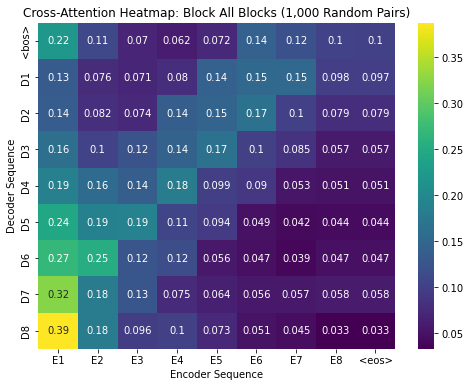

In [62]:
import numpy as np
import torch
import seaborn as sns
import matplotlib.pyplot as plt

# 1. Import the necessary libraries
import random

# 2. Modify the train_array to have 10,00 random samples
random_indices = np.random.choice(train_array.shape[0], 1000, replace=False)
train_array_random = train_array[random_indices]

# 3. Create a function to process a single data pair and return the average attention heatmap
def process_data_pair(model_use, task_target, dec_comple_peptide_pred, device):
    dec_prob, dec_attention_weight_seq = evaluate_single(model_use, task_target, dec_comple_peptide_pred, amino_dict, prediction_length + 2, device, save_attention_weights=True, print_info=False)
    decoder_encoder_attention_raw = [torch.unsqueeze(attention, dim=0) for attention in dec_attention_weight_seq[-1][1]]
    decoder_encoder_attention = [torch.tensor(np.delete(layer_attention.detach().numpy(), -1, 3)) for layer_attention in decoder_encoder_attention_raw]
    decoder_encoder_attention_avg = [torch.mean(layer_attention, dim=1) for layer_attention in decoder_encoder_attention]
    decoder_encoder_attention_blocks_avg = torch.mean(torch.stack(decoder_encoder_attention_avg, dim=0), dim=0)
    
    return decoder_encoder_attention_blocks_avg

# 4. Loop through the randomly selected data pairs, process them, and print the informative messages
attention_blocks_avg_list = []

for i, data_pair in enumerate(train_array_random):
    task_target, dec_comple_peptide_pred, _ = data_pair
    dec_comple_peptide_pred = dec_comple_peptide_pred[::-1]
    attention_blocks_avg = process_data_pair(model_use, task_target, dec_comple_peptide_pred, device)
    attention_blocks_avg_list.append(attention_blocks_avg)
    
    if (i + 1) % 100 == 0:
        print(f'Processed {i + 1} data pairs.')

# 5. Calculate the average attention heatmap over all the 1,000 data pairs
final_attention_blocks_avg = torch.mean(torch.stack(attention_blocks_avg_list, dim=0), dim=0)

encoder_text = ['E1', 'E2', 'E3', 'E4', 'E5', 'E6', 'E7', 'E8', '<eos>']
decoder_text = ['<bos>', 'D1', 'D2', 'D3', 'D4', 'D5', 'D6', 'D7', 'D8']
# 6. Plot the final average attention heatmap
plot_attention_heatmap(final_attention_blocks_avg.detach().numpy(), encoder_text, decoder_text, 'All Blocks (1,000 Random Pairs)')

# Task 5: Validation acc + log prob vs Dist plot

In [23]:
import numpy as np
import matplotlib.pyplot as plt

In [24]:
# load validation data
validation_dict = np.load('validation_l8_anti/validation_dict_fold0.npy', allow_pickle=True) # <------------------------------------------------------------------------change
validation_dict = validation_dict.tolist()
validation_list = []
for target, value_dict in validation_dict.items():
    for comp, count in value_dict.items():
        validation_list.append([target, comp, count])
validation_array = np.array(validation_list)

peptide_pred = np.load('model_evaluation/peptide_pred.npy', allow_pickle=True)
peptide_eval = np.load('model_evaluation/peptide_eval.npy', allow_pickle=True)
peptide_eval_shuffled = np.load('model_evaluation/peptide_eval_shuffled.npy', allow_pickle=True)
peptide_eval_random = np.load('model_evaluation/peptide_eval_random.npy', allow_pickle=True)

# load closest_dist
validation_training_hamming_dict = np.load('validation_l8_anti/validation_training_hamming_distance_dict.npy', allow_pickle=True)
validation_training_hamming_dict = validation_training_hamming_dict.tolist()

closest_dist = []
for batch_num, data_dict in validation_training_hamming_dict.items():
    # find the closest distance
    min_distance = 100
    for hamming_distance, num_data in data_dict.items():
        if hamming_distance < min_distance and hamming_distance != 0:
            min_distance = hamming_distance
    closest_dist.append(min_distance)
closest_dist = np.array(closest_dist)

# print info
print(validation_array.shape)
print(peptide_pred.shape)
print(peptide_eval.shape)
print(closest_dist.shape)

(214881, 3)
(214881, 3)
(214881, 3)
(214881,)


Number of sequences with closet dist 1:  102349
Number of sequences with closet dist 2:  29484
Number of sequences with closet dist 3:  17745
Number of sequences with closet dist 4:  13084
Number of sequences with closet dist 5:  10839
Number of sequences with closet dist 6:  10362
Number of sequences with closet dist 7:  14755
Number of sequences with closet dist 8:  14424
Number of sequences with closet dist 9:  1832
Number of sequences with closet dist 10:  7


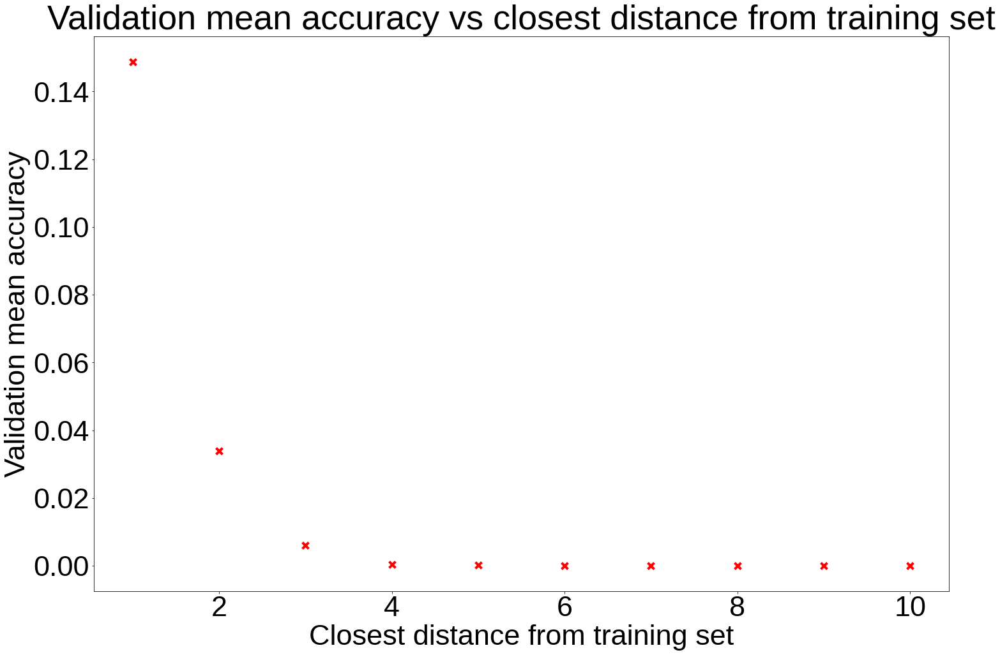

In [25]:
# plot mean accuracy vs dist graph 
min_dist = np.min(closest_dist)
max_dist = np.max(closest_dist)

acc_list = [[] for i in range(min_dist, max_dist + 1)]
for dist, prediction, truth in zip(closest_dist, peptide_pred[:, 1], validation_array[:, 1]):
	if prediction == truth:
		acc_list[dist - min_dist].append(1)
	else:
		acc_list[dist - min_dist].append(0)

mean_acc_list = []
for i, acc in enumerate(acc_list):
    mean_acc_list.append(np.mean(acc))
    print("Number of sequences with closet dist {}: ".format(range(min_dist, max_dist + 1)[i]), len(acc))
    
plt.rcParams.update({
    'font.size': 45,
    'font.family': 'Liberation Sans',
    'lines.linewidth': 4,
})

plt.figure(figsize=(24, 16), facecolor=(1, 1, 1))
plt.scatter(range(min_dist, max_dist + 1), mean_acc_list, c='r', s=100, marker = "x")
plt.xlabel('Closest distance from training set')
plt.ylabel('Validation mean accuracy')
plt.title('Validation mean accuracy vs closest distance from training set')
plt.savefig('model_evaluation/mean_acc_vs_dist_scatter_plot.png', bbox_inches='tight')
plt.show()

Number of sequences with closet dist 1:  102349
Number of sequences with closet dist 2:  29484
Number of sequences with closet dist 3:  17745
Number of sequences with closet dist 4:  13084
Number of sequences with closet dist 5:  10839
Number of sequences with closet dist 6:  10362
Number of sequences with closet dist 7:  14755
Number of sequences with closet dist 8:  14424
Number of sequences with closet dist 9:  1832
Number of sequences with closet dist 10:  7


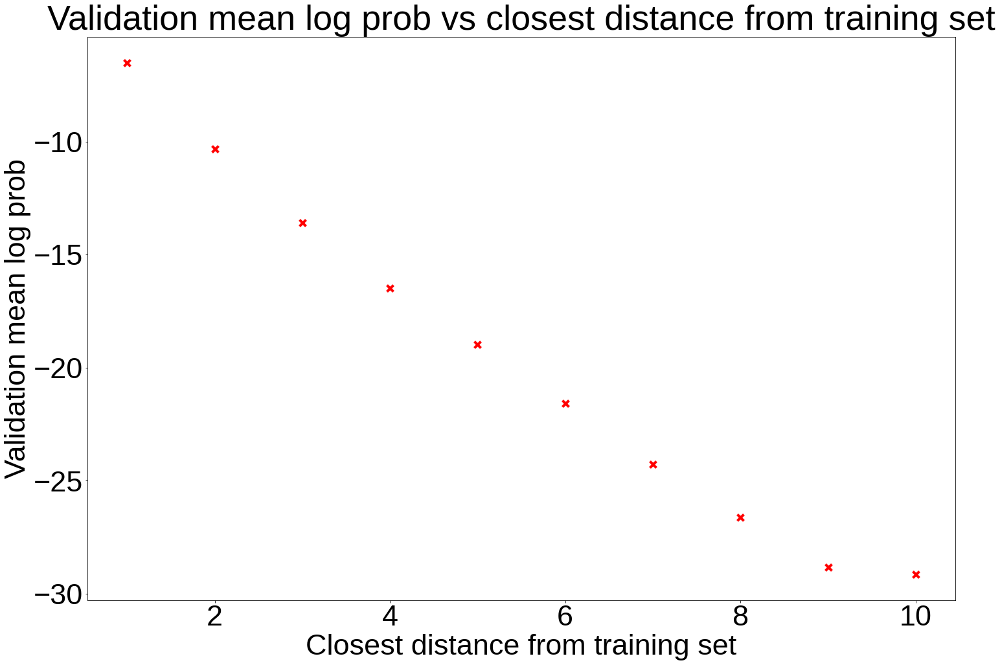

In [26]:
# plot mean log prob vs dist graph 
min_dist = np.min(closest_dist)
max_dist = np.max(closest_dist)

prob_list = [[] for i in range(min_dist, max_dist + 1)]
peptide_eval_prob = peptide_eval[:, 2].astype(np.float64)
for dist, prob in zip(closest_dist, peptide_eval_prob):
	prob_list[dist - min_dist].append(prob)

mean_prob_list = [np.mean(np.log(prob)) for prob in prob_list]
for i, prob in enumerate(prob_list):
	print("Number of sequences with closet dist {}: ".format(range(min_dist, max_dist + 1)[i]), len(prob))

plt.rcParams.update({
    'font.size': 45,
    'font.family': 'Liberation Sans',
    'lines.linewidth': 4,
})

plt.figure(figsize=(24, 16), facecolor=(1, 1, 1))
plt.scatter(range(min_dist, max_dist + 1), mean_prob_list, c='r', s=100, marker = "x")
plt.xlabel('Closest distance from training set')
plt.ylabel('Validation mean log prob')
plt.title('Validation mean log prob vs closest distance from training set')
plt.savefig('model_evaluation/mean_log_prob_vs_dist_scatter_plot.png', bbox_inches='tight')
plt.show()

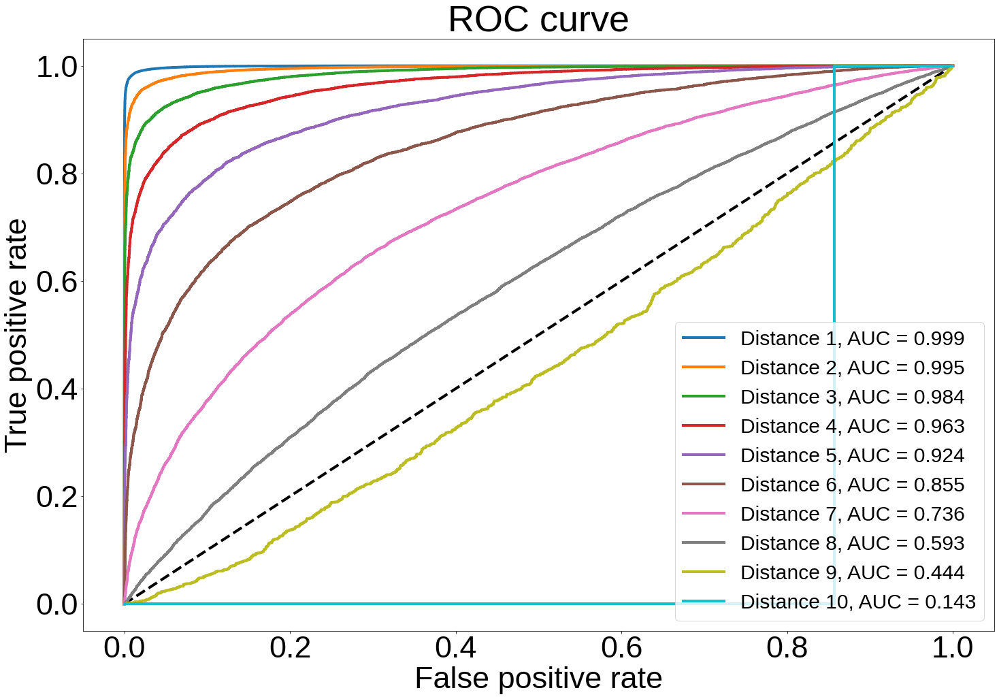

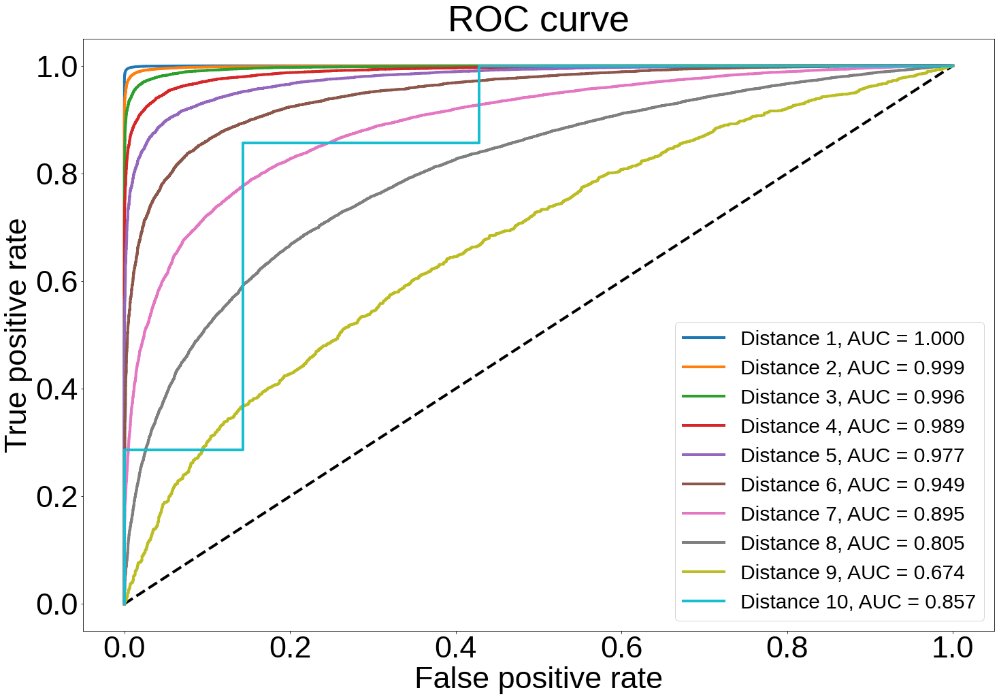

In [27]:
# plot different ROC curves for different dist
from sklearn.metrics import roc_curve, auc

min_dist = np.min(closest_dist)
max_dist = np.max(closest_dist)

# Compute ROC curves and ROC areas for each class for shuffled data
fpr = dict()
tpr = dict()
roc_auc = dict()
peptide_eval_shuffled_prob = peptide_eval_shuffled[:, 2].astype(np.float64)
peptide_eval_random_prob = peptide_eval_random[:, 2].astype(np.float64)
peptide_eval_prob = peptide_eval[:, 2].astype(np.float64)
for i in range(min_dist, max_dist + 1):
    y_true = np.concatenate((np.ones(len(peptide_eval_prob[closest_dist == i])), np.zeros(len(peptide_eval_shuffled_prob[closest_dist == i]))))
    y_score = np.concatenate((peptide_eval_prob[closest_dist == i], peptide_eval_shuffled_prob[closest_dist == i]))
    fpr[i], tpr[i], _ = roc_curve(y_true, y_score)
    roc_auc[i] = auc(fpr[i], tpr[i])
    
# Compute ROC curves and ROC areas for each class for random data
fpr_random = dict()
tpr_random = dict()
roc_auc_random = dict()
for i in range(min_dist, max_dist + 1):
    y_true = np.concatenate((np.ones(len(peptide_eval_prob[closest_dist == i])), np.zeros(len(peptide_eval_random_prob[closest_dist == i]))))
    y_score = np.concatenate((peptide_eval_prob[closest_dist == i], peptide_eval_random_prob[closest_dist == i]))
    fpr_random[i], tpr_random[i], _ = roc_curve(y_true, y_score)
    roc_auc_random[i] = auc(fpr_random[i], tpr_random[i])

plt.rcParams.update({
    'font.size': 45,
    'font.family': 'Liberation Sans',
    'lines.linewidth': 4,
})

# plot ROC curves
plt.figure(figsize=(24, 16), facecolor=(1, 1, 1))
plt.plot([0, 1], [0, 1], 'k--')
for i in range(min_dist, max_dist + 1):
    plt.plot(fpr[i], tpr[i], label='Distance {}, AUC = {:.3f}'.format(i, roc_auc[i]))
plt.xlabel('False positive rate')
plt.ylabel('True positive rate')
plt.title('ROC curve')
plt.legend(loc='best', fontsize=30)
plt.savefig('model_evaluation/ROC_curve_dist_shuffled.png', bbox_inches='tight')
plt.show()

plt.figure(figsize=(24, 16), facecolor=(1, 1, 1))
plt.plot([0, 1], [0, 1], 'k--')
for i in range(min_dist, max_dist + 1):
    plt.plot(fpr_random[i], tpr_random[i], label='Distance {}, AUC = {:.3f}'.format(i, roc_auc_random[i]))
plt.xlabel('False positive rate')
plt.ylabel('True positive rate')
plt.title('ROC curve')
plt.legend(loc='best', fontsize=30)
plt.savefig('model_evaluation/ROC_curve_dist_random.png', bbox_inches='tight')
plt.show()

# Task 6: Frequency check - use script "model_evaluate_frequency_check_greedy"

# Task 6: Frequency check - use script "model_evaluate_frequency_check_sample"

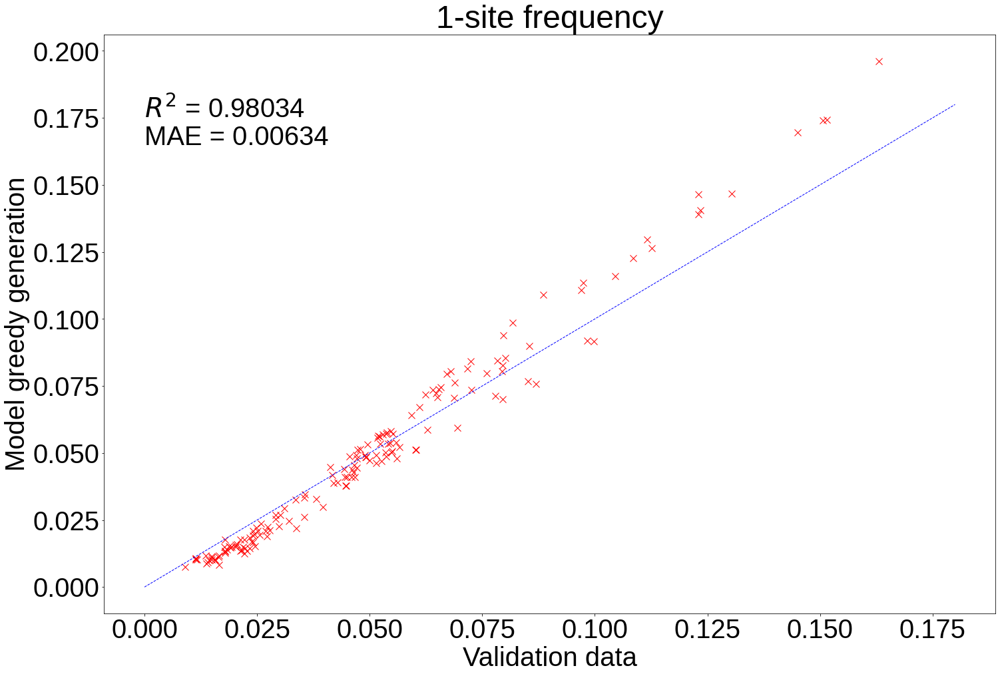

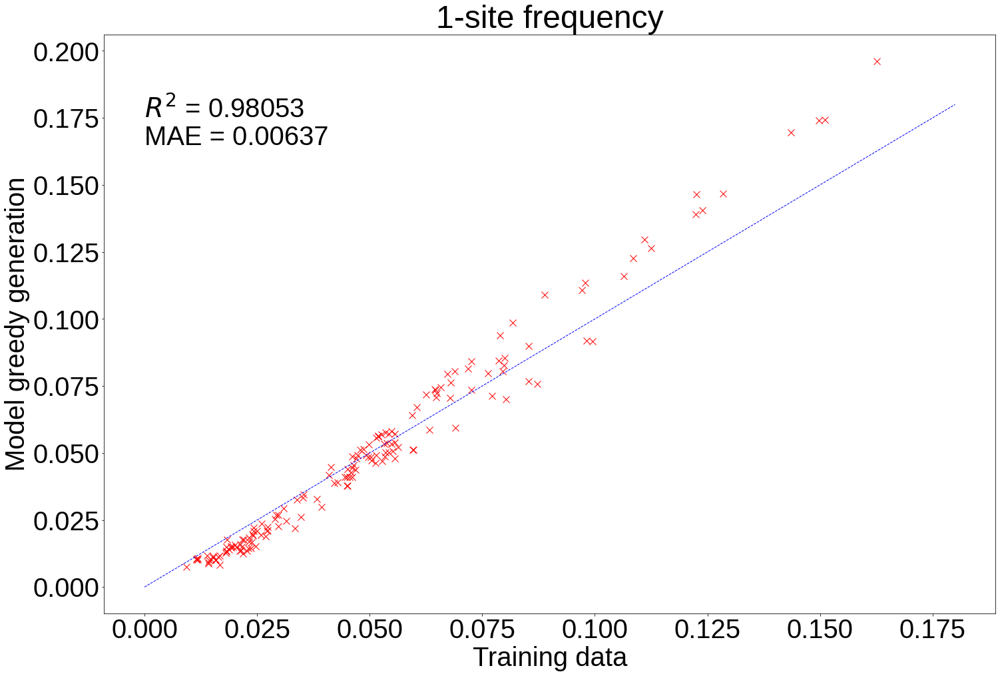

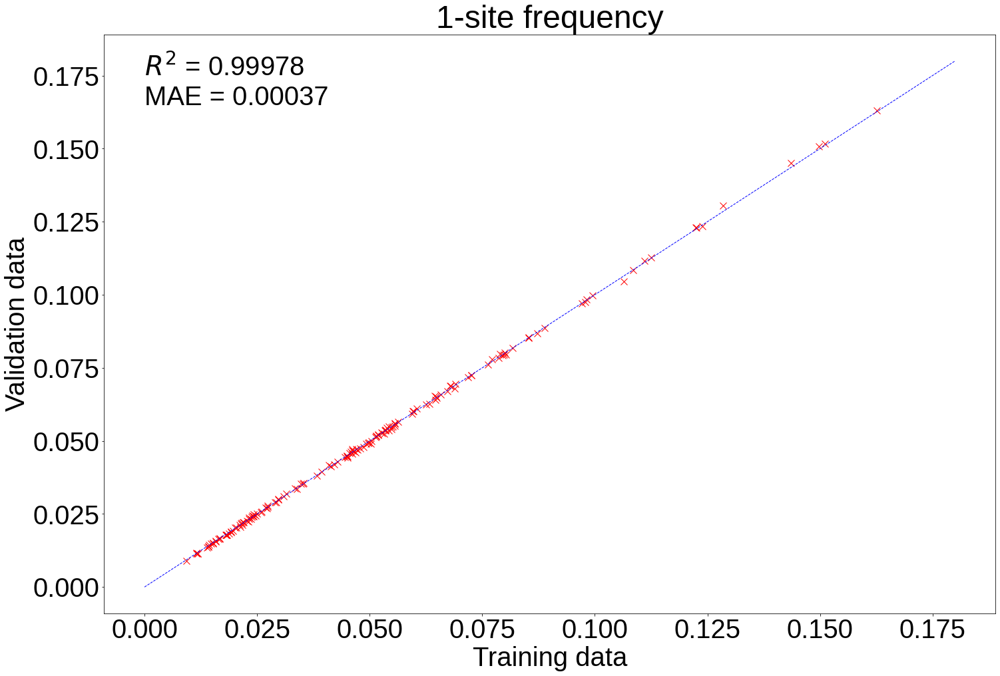

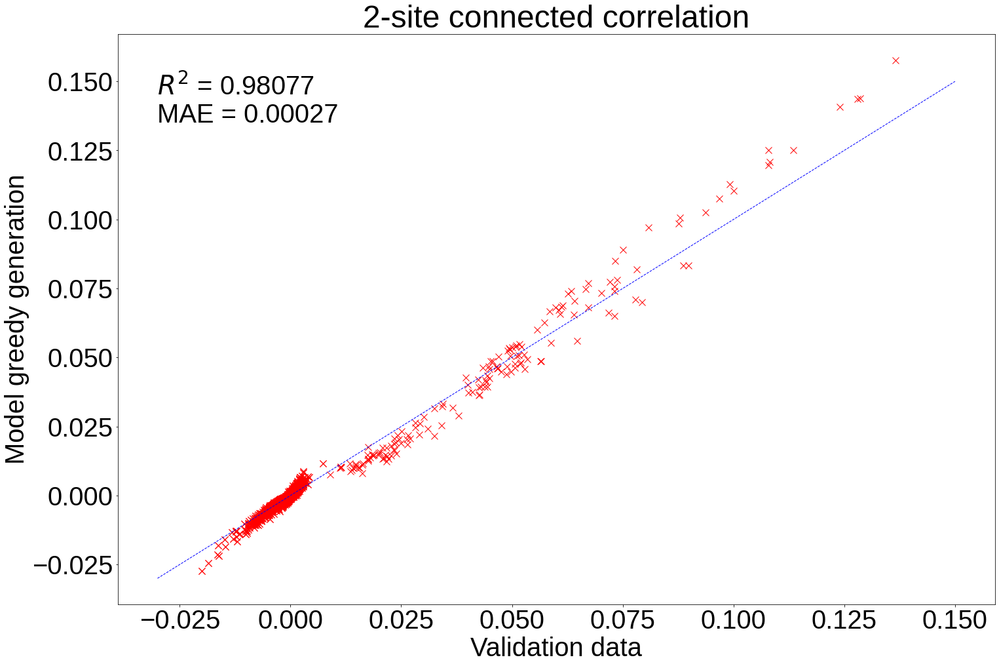

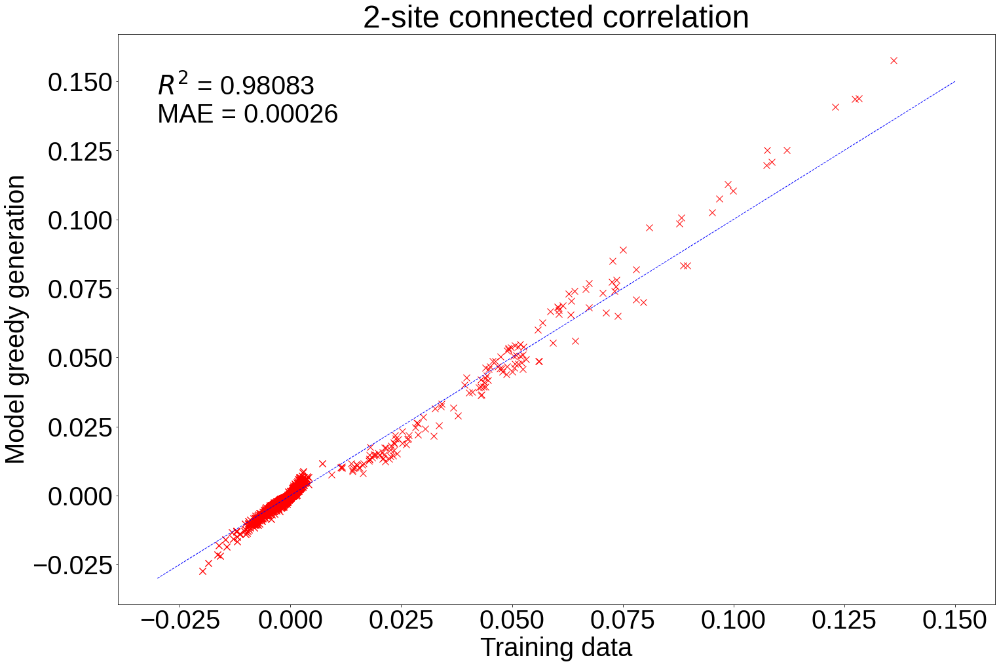

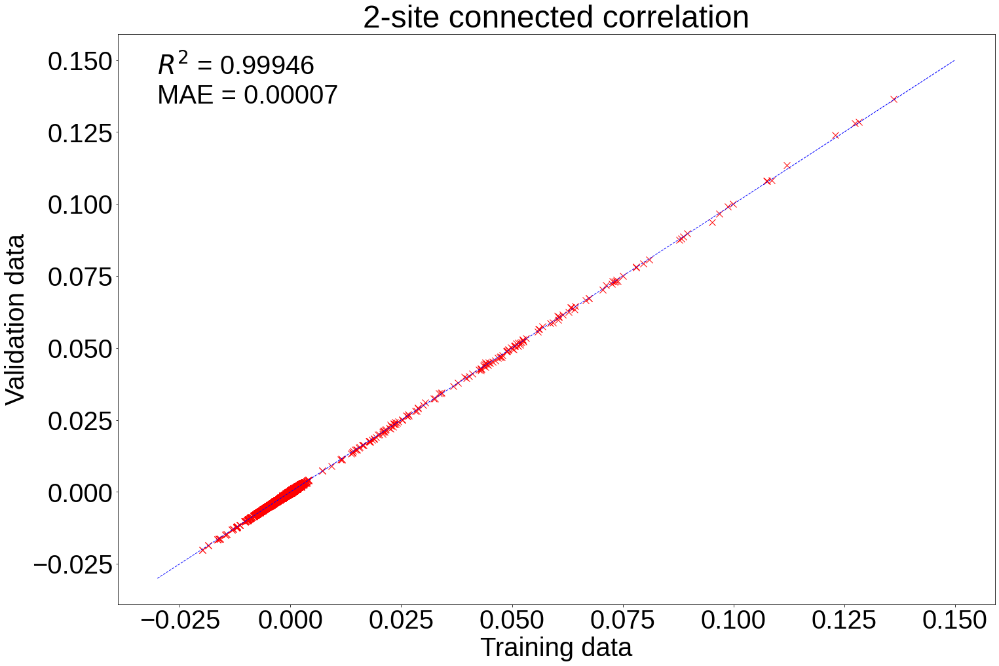

In [5]:
import numpy as np
import matplotlib.pyplot as plt

# load validation data
validation_dict = np.load('validation_l8_anti/validation_dict_fold0.npy', allow_pickle=True) # <------------------------------------------------------------------------change
validation_dict = validation_dict.tolist()
validation_list = []
for target, value_dict in validation_dict.items():
    for comp, count in value_dict.items():
        validation_list.append([target, comp, count])
validation_array = np.array(validation_list)

# load training data
train_dict = np.load('train_l8_anti/train_dict_fold0.npy', allow_pickle=True)
train_dict = train_dict.tolist()
train_list = []
for target, value_dict in train_dict.items():
    for comp, count in value_dict.items():
        train_list.append([target, comp, count])
train_array = np.array(train_list)

# load peptide_pred
peptide_pred = np.load('model_evaluation/peptide_pred.npy', allow_pickle=True)

amino_dict_freq = {'A': 0,
'C': 1,
'D': 2,
'E': 3,
'F': 4,
'G': 5,
'H': 6,
'I': 7,
'K': 8,
'L': 9,
'M': 10,
'N': 11,
'P': 12,
'Q': 13,
'R': 14,
'S': 15,
'T': 16,
'V': 17,
'W': 18,
'Y': 19}

# 1. calculate amino acid frequency in each position for validation data

# create a 2 by 2 array to store number of amino acids in each position
amino_count = np.zeros((len(validation_array[0][1]), len(amino_dict_freq)))

# count amino acids in each position
for i in range(len(validation_array)):
	for j in range(len(validation_array[i][1])):
		amino_count[j][amino_dict_freq[validation_array[i][1][j]]] += 1
        
# calculate amino acid frequency in each position
amino_freq = amino_count / np.sum(amino_count, axis=1)[:, None]

# 2. calculate amino acid frequency in each position for training data

# create a 2 by 2 array to store number of amino acids in each position
amino_count_train = np.zeros((len(train_array[0][1]), len(amino_dict_freq)))

# count amino acids in each position
for i in range(len(train_array)):
	for j in range(len(train_array[i][1])):
		amino_count_train[j][amino_dict_freq[train_array[i][1][j]]] += 1

# calculate amino acid frequency in each position
amino_freq_train = amino_count_train / np.sum(amino_count_train, axis=1)[:, None]

# 3. calculate amino acid frequency in each position for prediction

# create a 2 by 2 array to store number of amino acids in each position
amino_count_pred = np.zeros((len(validation_array[0][1]), len(amino_dict_freq)))

# count amino acids in each position
for i in range(len(peptide_pred)):
	for j in range(len(peptide_pred[i][1])):
		# if the amino acid is not in the dictionary, skip this whole prediction sequence
		if peptide_pred[i][1][j] not in amino_dict_freq:
			break
		amino_count_pred[j][amino_dict_freq[peptide_pred[i][1][j]]] += 1

# calculate amino acid frequency in each position
amino_freq_pred = amino_count_pred / np.sum(amino_count_pred, axis=1)[:, None]

# 4. scatter plot the validation data frequency vs model generation frequency on a single plot
# calculate the correlation coefficient r^2
r2 = np.corrcoef(amino_freq_pred.flatten(), amino_freq.flatten())[0, 1]**2
# calculate the mean absolute error
mae = np.mean(np.abs(amino_freq_pred.flatten() - amino_freq.flatten()))

plt.rcParams.update({
    'font.size': 40,
    'font.family': 'Liberation Sans',
    'lines.linewidth': 1,
})

plt.figure(figsize=(24, 16), facecolor=(1, 1, 1))
for i in range(len(amino_freq)):
	plt.scatter(amino_freq[i], amino_freq_pred[i], c='r', s=100, marker = "x")
# add a dotted line of y=x
x = np.linspace(0, 0.18, 100)
y = x
plt.plot(x, y, 'b--')
plt.xlabel('Validation data')
plt.ylabel('Model greedy generation')
plt.text(0., 0.175, '$R^{2}$ = '+ format(r2, '.5f'), fontsize=40)
plt.text(0., 0.165, 'MAE = ' + format(mae, '.5f'), fontsize=40)
plt.title('1-site frequency')
plt.savefig('model_evaluation/1_site_freq_validation_vs_model_greedy_generation.png', bbox_inches='tight')
plt.show()

# 5. scatter plot the training data frequency vs model generation frequency on a single plot
# calculate the correlation coefficient r^2
r2 = np.corrcoef(amino_freq_pred.flatten(), amino_freq_train.flatten())[0, 1]**2
# calculate the mean absolute error
mae = np.mean(np.abs(amino_freq_pred.flatten() - amino_freq_train.flatten()))

plt.figure(figsize=(24, 16), facecolor=(1, 1, 1))
for i in range(len(amino_freq_train)):
	plt.scatter(amino_freq_train[i], amino_freq_pred[i], c='r', s=100, marker = "x")
# add a dotted line of y=x
x = np.linspace(0, 0.18, 100)
y = x
plt.plot(x, y, 'b--')
plt.xlabel('Training data')
plt.ylabel('Model greedy generation')
plt.title('1-site frequency')
plt.text(0., 0.175, '$R^{2}$ = ' + format(r2, '.5f'), fontsize=40)
plt.text(0., 0.165, 'MAE = ' + format(mae, '.5f'), fontsize=40)
plt.savefig('model_evaluation/1_site_freq_training_vs_model_greedy_generation.png', bbox_inches='tight')
plt.show()

# 6. scatter plot the training data frequency vs validation data frequency on a single plot
# calculate the correlation coefficient r^2
r2 = np.corrcoef(amino_freq.flatten(), amino_freq_train.flatten())[0, 1]**2
# calculate the mean absolute error
mae = np.mean(np.abs(amino_freq.flatten() - amino_freq_train.flatten()))

plt.figure(figsize=(24, 16), facecolor=(1, 1, 1))
for i in range(len(amino_freq_train)):
	plt.scatter(amino_freq_train[i], amino_freq[i], c='r', s=100, marker = "x")
# add a dotted line of y=x
x = np.linspace(0, 0.18, 100)
y = x
plt.plot(x, y, 'b--')
plt.xlabel('Training data')
plt.ylabel('Validation data')
plt.title('1-site frequency')
plt.text(0., 0.175, '$R^{2}$ = ' + format(r2, '.5f'), fontsize=40)
plt.text(0., 0.165, 'MAE = ' + format(mae, '.5f'), fontsize=40)
plt.savefig('model_evaluation/1_site_freq_training_vs_validation.png', bbox_inches='tight')
plt.show()

# 1. calculate amino acid to amino acid frequency in two positions for validation data

# create a 4D array to store number of amino acids in each position
# 1st dimension: position
# 2nd dimension: position
# 3rd dimension: amino acid
# 4th dimension: amino acid
amino_count_2_sites = np.zeros((len(validation_array[0][1]), len(validation_array[0][1]), len(amino_dict_freq), len(amino_dict_freq)))

# count amino acid to amino acid in each position pair
for i in range(len(validation_array)):
	for j in range(len(validation_array[i][1])):
		for k in range(len(validation_array[i][1])):
			amino_count_2_sites[j][k][amino_dict_freq[validation_array[i][1][j]]][amino_dict_freq[validation_array[i][1][k]]] += 1
            
# calculate amino acid to amino acid frequency in each position pair
amino_freq_2_sites = amino_count_2_sites / np.sum(amino_count_2_sites, axis=(2, 3))[:, :, None, None]

# calculate correlation given by amino_freq_2_sites - product of amino_freq at each position
amino_freq_2_sites_corr = amino_freq_2_sites - np.einsum('ij,kl->ikjl', amino_freq, amino_freq)

# 2. calculate amino acid to amino acid frequency in two positions for training data

# create a 4D array to store number of amino acids in each position
# 1st dimension: position
# 2nd dimension: position
# 3rd dimension: amino acid
# 4th dimension: amino acid
amino_count_2_sites_train = np.zeros((len(train_array[0][1]), len(train_array[0][1]), len(amino_dict_freq), len(amino_dict_freq)))

# count amino acid to amino acid in each position pair
for i in range(len(train_array)):
	for j in range(len(train_array[i][1])):
		for k in range(len(train_array[i][1])):
			amino_count_2_sites_train[j][k][amino_dict_freq[train_array[i][1][j]]][amino_dict_freq[train_array[i][1][k]]] += 1

# calculate amino acid to amino acid frequency in each position pair
amino_freq_2_sites_train = amino_count_2_sites_train / np.sum(amino_count_2_sites_train, axis=(2, 3))[:, :, None, None]

# calculate correlation given by amino_freq_2_sites_train - product of amino_freq at each position
amino_freq_2_sites_train_corr = amino_freq_2_sites_train - np.einsum('ij,kl->ikjl', amino_freq_train, amino_freq_train)

# 3. calculate amino acid to amino acid frequency in two positions for prediction

# create a 4D array to store number of amino acids in each position
# 1st dimension: position
# 2nd dimension: position
# 3rd dimension: amino acid
# 4th dimension: amino acid
amino_count_2_sites_pred = np.zeros((len(validation_array[0][1]), len(validation_array[0][1]), len(amino_dict_freq), len(amino_dict_freq)))

# count amino acid to amino acid in each position pair
for i in range(len(peptide_pred)):
	for j in range(len(peptide_pred[i][1])):
		# if any of the amino acid in the prediction is not in the dictionary, skip this whole prediction sequence
		if any(amino not in amino_dict_freq for amino in peptide_pred[i][1]):
			break
		for k in range(len(peptide_pred[i][1])):
			amino_count_2_sites_pred[j][k][amino_dict_freq[peptide_pred[i][1][j]]][amino_dict_freq[peptide_pred[i][1][k]]] += 1


# calculate amino acid to amino acid frequency in each position pair
amino_freq_2_sites_pred = amino_count_2_sites_pred / np.sum(amino_count_2_sites_pred, axis=(2, 3))[:, :, None, None]

# calculate correlation given by amino_freq_2_sites - product of amino_freq at each position
amino_freq_2_sites_pred_corr = amino_freq_2_sites_pred - np.einsum('ij,kl->ikjl', amino_freq_pred, amino_freq_pred)

# 4. scatter plot the validation data frequency vs model generation frequency on a single plot
# calculate the correlation coefficient r^2
r2 = np.corrcoef(amino_freq_2_sites_corr.flatten(), amino_freq_2_sites_pred_corr.flatten())[0, 1]**2
# calculate the mean absolute error
mae = np.mean(np.abs(amino_freq_2_sites_corr.flatten() - amino_freq_2_sites_pred_corr.flatten()))

plt.figure(figsize=(24, 16), facecolor=(1, 1, 1))
for i in range(len(amino_freq_2_sites_corr)):
	for j in range(len(amino_freq_2_sites_corr[i])):
		plt.scatter(amino_freq_2_sites_corr[i][j], amino_freq_2_sites_pred_corr[i][j], c='r', s=100, marker = "x")
# add a dotted line of y=x
x = np.linspace(-0.03, 0.15, 100)
y = x
plt.plot(x, y, 'b--')
plt.xlabel('Validation data')
plt.ylabel('Model greedy generation')
plt.title('2-site connected correlation')
plt.text(-0.030, 0.145, '$R^{2}$ = ' + format(r2, '.5f'), fontsize=40)
plt.text(-0.030, 0.135, 'MAE = ' + format(mae, '.5f'), fontsize=40)
plt.savefig('model_evaluation/2_site_corr_validation_vs_model_greedy_generation.png', bbox_inches='tight')
plt.show()

# 5. scatter plot the training data frequency vs model generation frequency on a single plot
# calculate the correlation coefficient r^2
r2 = np.corrcoef(amino_freq_2_sites_train_corr.flatten(), amino_freq_2_sites_pred_corr.flatten())[0, 1]**2
# calculate the mean absolute error
mae = np.mean(np.abs(amino_freq_2_sites_train_corr.flatten() - amino_freq_2_sites_pred_corr.flatten()))

plt.figure(figsize=(24, 16), facecolor=(1, 1, 1))
for i in range(len(amino_freq_2_sites_train_corr)):
	for j in range(len(amino_freq_2_sites_train_corr[i])):
		plt.scatter(amino_freq_2_sites_train_corr[i][j], amino_freq_2_sites_pred_corr[i][j], c='r', s=100, marker = "x")
# add a dotted line of y=x
x = np.linspace(-0.03, 0.15, 100)
y = x
plt.plot(x, y, 'b--')
plt.xlabel('Training data')
plt.ylabel('Model greedy generation')
plt.title('2-site connected correlation')
plt.text(-0.030, 0.145, '$R^{2}$ = ' + format(r2, '.5f'), fontsize=40)
plt.text(-0.030, 0.135, 'MAE = ' + format(mae, '.5f'), fontsize=40)
plt.savefig('model_evaluation/2_site_corr_training_vs_model_greedy_generation.png', bbox_inches='tight')
plt.show()

# 6. scatter plot the training data frequency vs validation data frequency on a single plot
# calculate the correlation coefficient r^2
r2 = np.corrcoef(amino_freq_2_sites_train_corr.flatten(), amino_freq_2_sites_corr.flatten())[0, 1]**2
# calculate the mean absolute error
mae = np.mean(np.abs(amino_freq_2_sites_train_corr.flatten() - amino_freq_2_sites_corr.flatten()))

plt.figure(figsize=(24, 16), facecolor=(1, 1, 1))
for i in range(len(amino_freq_2_sites_train_corr)):
	for j in range(len(amino_freq_2_sites_train_corr[i])):
		plt.scatter(amino_freq_2_sites_train_corr[i][j], amino_freq_2_sites_corr[i][j], c='r', s=100, marker = "x")
# add a dotted line of y=x
x = np.linspace(-0.03, 0.15, 100)
y = x
plt.plot(x, y, 'b--')
plt.xlabel('Training data')
plt.ylabel('Validation data')
plt.title('2-site connected correlation')
plt.text(-0.030, 0.145, '$R^{2}$ = ' + format(r2, '.5f'), fontsize=40)
plt.text(-0.030, 0.135, 'MAE = ' + format(mae, '.5f'), fontsize=40)
plt.savefig('model_evaluation/2_site_corr_training_vs_validation.png', bbox_inches='tight')
plt.show()

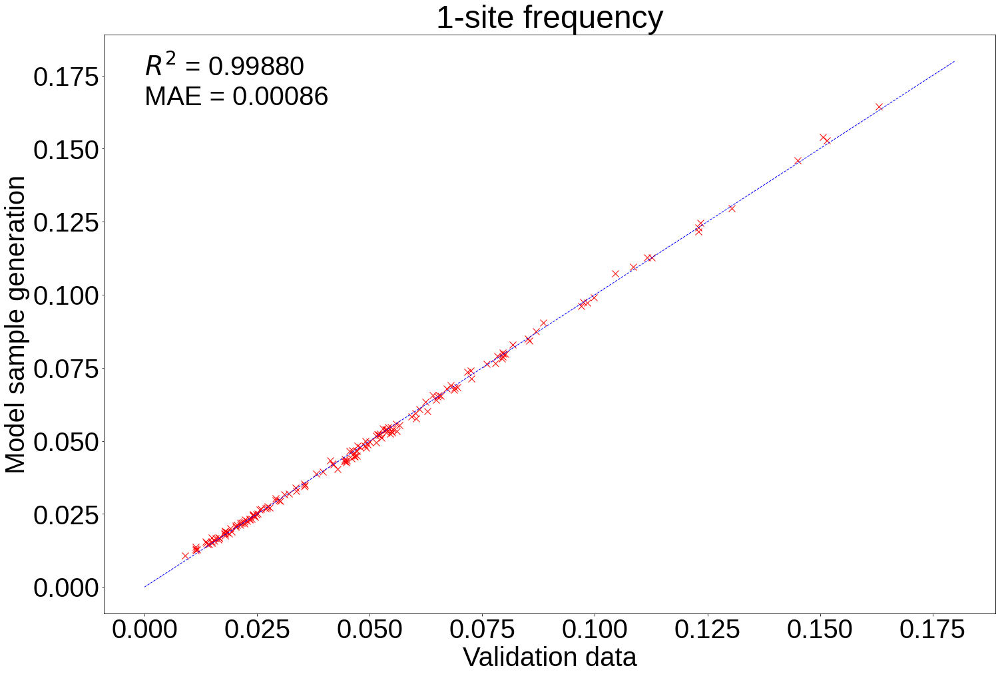

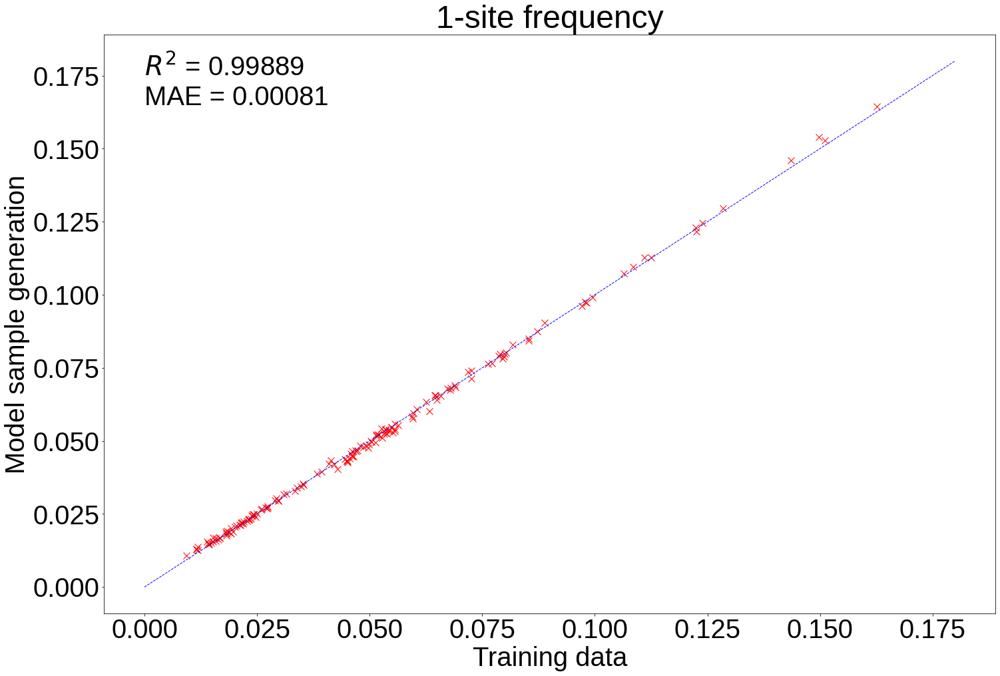

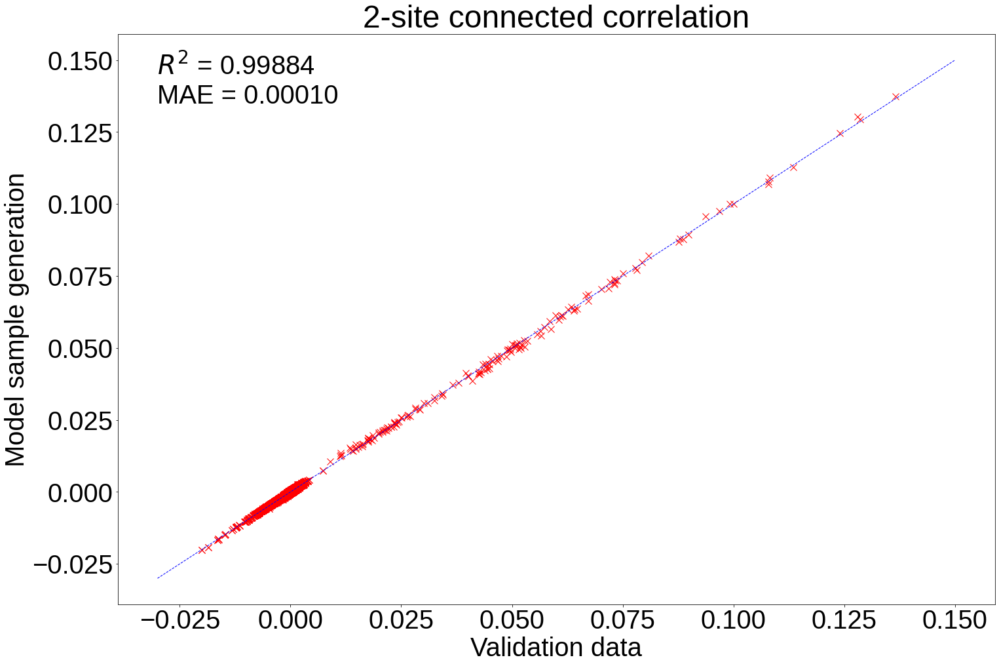

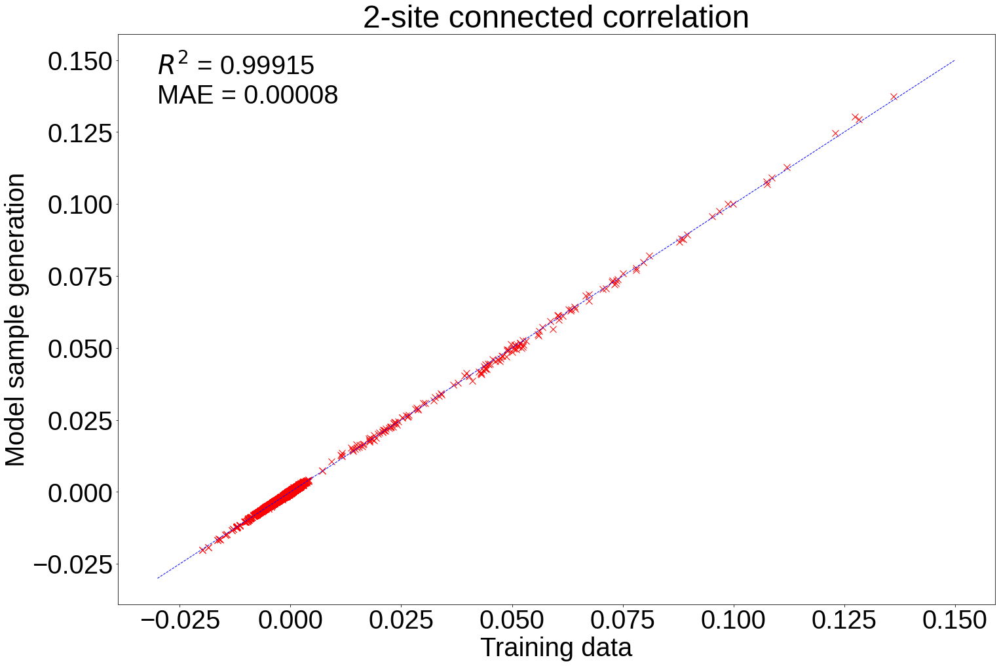

In [6]:
import numpy as np
import matplotlib.pyplot as plt

# load validation data
validation_dict = np.load('validation_l8_anti/validation_dict_fold0.npy', allow_pickle=True) # <------------------------------------------------------------------------change
validation_dict = validation_dict.tolist()
validation_list = []
for target, value_dict in validation_dict.items():
    for comp, count in value_dict.items():
        validation_list.append([target, comp, count])
validation_array = np.array(validation_list)

# load training data
train_dict = np.load('train_l8_anti/train_dict_fold0.npy', allow_pickle=True)
train_dict = train_dict.tolist()
train_list = []
for target, value_dict in train_dict.items():
    for comp, count in value_dict.items():
        train_list.append([target, comp, count])
train_array = np.array(train_list)

# load peptide_samp
peptide_samp = np.load('model_evaluation/peptide_samp.npy', allow_pickle=True)

amino_dict_freq = {'A': 0,
'C': 1,
'D': 2,
'E': 3,
'F': 4,
'G': 5,
'H': 6,
'I': 7,
'K': 8,
'L': 9,
'M': 10,
'N': 11,
'P': 12,
'Q': 13,
'R': 14,
'S': 15,
'T': 16,
'V': 17,
'W': 18,
'Y': 19}

# 1. calculate amino acid frequency in each position for validation data

# create a 2 by 2 array to store number of amino acids in each position
amino_count = np.zeros((len(validation_array[0][1]), len(amino_dict_freq)))

# count amino acids in each position
for i in range(len(validation_array)):
	for j in range(len(validation_array[i][1])):
		amino_count[j][amino_dict_freq[validation_array[i][1][j]]] += 1
        
# calculate amino acid frequency in each position
amino_freq = amino_count / np.sum(amino_count, axis=1)[:, None]

# 2. calculate amino acid frequency in each position for training data

# create a 2 by 2 array to store number of amino acids in each position
amino_count_train = np.zeros((len(train_array[0][1]), len(amino_dict_freq)))

# count amino acids in each position
for i in range(len(train_array)):
	for j in range(len(train_array[i][1])):
		amino_count_train[j][amino_dict_freq[train_array[i][1][j]]] += 1

# calculate amino acid frequency in each position
amino_freq_train = amino_count_train / np.sum(amino_count_train, axis=1)[:, None]

# 3. calculate amino acid frequency in each position for prediction

# create a 2 by 2 array to store number of amino acids in each position
amino_count_pred = np.zeros((len(validation_array[0][1]), len(amino_dict_freq)))

# count amino acids in each position
for i in range(len(peptide_samp)):
	for j in range(len(peptide_samp[i][1])):
		# if the amino acid is not in the dictionary, skip this whole prediction sequence
		if peptide_samp[i][1][j] not in amino_dict_freq:
			break
		amino_count_pred[j][amino_dict_freq[peptide_samp[i][1][j]]] += 1

# calculate amino acid frequency in each position
amino_freq_pred = amino_count_pred / np.sum(amino_count_pred, axis=1)[:, None]

# 4. scatter plot the validation data frequency vs model generation frequency on a single plot
# calculate the correlation coefficient r^2
r2 = np.corrcoef(amino_freq.flatten(), amino_freq_pred.flatten())[0, 1]**2
# calculate the mean absolute error
mae = np.mean(np.abs(amino_freq.flatten() - amino_freq_pred.flatten()))

plt.rcParams.update({
    'font.size': 40,
    'font.family': 'Liberation Sans',
    'lines.linewidth': 1,
})

plt.figure(figsize=(24, 16), facecolor=(1, 1, 1))
for i in range(len(amino_freq)):
	plt.scatter(amino_freq[i], amino_freq_pred[i], c='r', s=100, marker = "x")
# add a dotted line of y=x
x = np.linspace(0, 0.18, 100)
y = x
plt.plot(x, y, 'b--')
plt.xlabel('Validation data')
plt.ylabel('Model sample generation')
plt.title('1-site frequency')
plt.text(0., 0.175, '$R^{2}$ = ' + format(r2, '.5f'), fontsize=40)
plt.text(0., 0.165, 'MAE = ' + format(mae, '.5f'), fontsize=40)
plt.savefig('model_evaluation/1_site_freq_validation_vs_model_sample_generation.png', bbox_inches='tight')
plt.show()

# 5. scatter plot the training data frequency vs model generation frequency on a single plot
# calculate the correlation coefficient r^2
r2 = np.corrcoef(amino_freq_train.flatten(), amino_freq_pred.flatten())[0, 1]**2
# calculate the mean absolute error
mae = np.mean(np.abs(amino_freq_train.flatten() - amino_freq_pred.flatten()))

plt.figure(figsize=(24, 16), facecolor=(1, 1, 1))
for i in range(len(amino_freq_train)):
	plt.scatter(amino_freq_train[i], amino_freq_pred[i], c='r', s=100, marker = "x")
# add a dotted line of y=x
x = np.linspace(0, 0.18, 100)
y = x
plt.plot(x, y, 'b--')
plt.xlabel('Training data')
plt.ylabel('Model sample generation')
plt.title('1-site frequency')
plt.text(0., 0.175, '$R^{2}$ = ' + format(r2, '.5f'), fontsize=40)
plt.text(0., 0.165, 'MAE = ' + format(mae, '.5f'), fontsize=40)
plt.savefig('model_evaluation/1_site_freq_training_vs_model_sample_generation.png', bbox_inches='tight')
plt.show()


# 1. calculate amino acid to amino acid frequency in two positions for validation data

# create a 4D array to store number of amino acids in each position
# 1st dimension: position
# 2nd dimension: position
# 3rd dimension: amino acid
# 4th dimension: amino acid
amino_count_2_sites = np.zeros((len(validation_array[0][1]), len(validation_array[0][1]), len(amino_dict_freq), len(amino_dict_freq)))

# count amino acid to amino acid in each position pair
for i in range(len(validation_array)):
	for j in range(len(validation_array[i][1])):
		for k in range(len(validation_array[i][1])):
			amino_count_2_sites[j][k][amino_dict_freq[validation_array[i][1][j]]][amino_dict_freq[validation_array[i][1][k]]] += 1
            
# calculate amino acid to amino acid frequency in each position pair
amino_freq_2_sites = amino_count_2_sites / np.sum(amino_count_2_sites, axis=(2, 3))[:, :, None, None]

# calculate correlation given by amino_freq_2_sites - product of amino_freq at each position
amino_freq_2_sites_corr = amino_freq_2_sites - np.einsum('ij,kl->ikjl', amino_freq, amino_freq)

# 2. calculate amino acid to amino acid frequency in two positions for training data

# create a 4D array to store number of amino acids in each position
# 1st dimension: position
# 2nd dimension: position
# 3rd dimension: amino acid
# 4th dimension: amino acid
amino_count_2_sites_train = np.zeros((len(train_array[0][1]), len(train_array[0][1]), len(amino_dict_freq), len(amino_dict_freq)))

# count amino acid to amino acid in each position pair
for i in range(len(train_array)):
	for j in range(len(train_array[i][1])):
		for k in range(len(train_array[i][1])):
			amino_count_2_sites_train[j][k][amino_dict_freq[train_array[i][1][j]]][amino_dict_freq[train_array[i][1][k]]] += 1

# calculate amino acid to amino acid frequency in each position pair
amino_freq_2_sites_train = amino_count_2_sites_train / np.sum(amino_count_2_sites_train, axis=(2, 3))[:, :, None, None]

# calculate correlation given by amino_freq_2_sites_train - product of amino_freq at each position
amino_freq_2_sites_train_corr = amino_freq_2_sites_train - np.einsum('ij,kl->ikjl', amino_freq_train, amino_freq_train)

# 3. calculate amino acid to amino acid frequency in two positions for prediction

# create a 4D array to store number of amino acids in each position
# 1st dimension: position
# 2nd dimension: position
# 3rd dimension: amino acid
# 4th dimension: amino acid
amino_count_2_sites_pred = np.zeros((len(validation_array[0][1]), len(validation_array[0][1]), len(amino_dict_freq), len(amino_dict_freq)))

# count amino acid to amino acid in each position pair
for i in range(len(peptide_samp)):
	for j in range(len(peptide_samp[i][1])):
		# if any of the amino acid in the prediction is not in the dictionary, skip this whole prediction sequence
		if any(amino not in amino_dict_freq for amino in peptide_samp[i][1]):
			break
		for k in range(len(peptide_samp[i][1])):
			amino_count_2_sites_pred[j][k][amino_dict_freq[peptide_samp[i][1][j]]][amino_dict_freq[peptide_samp[i][1][k]]] += 1


# calculate amino acid to amino acid frequency in each position pair
amino_freq_2_sites_pred = amino_count_2_sites_pred / np.sum(amino_count_2_sites_pred, axis=(2, 3))[:, :, None, None]

# calculate correlation given by amino_freq_2_sites - product of amino_freq at each position
amino_freq_2_sites_pred_corr = amino_freq_2_sites_pred - np.einsum('ij,kl->ikjl', amino_freq_pred, amino_freq_pred)

# 4. scatter plot the validation data frequency vs model generation frequency on a single plot
# calculate the correlation coefficient r^2
r2 = np.corrcoef(amino_freq_2_sites_corr.flatten(), amino_freq_2_sites_pred_corr.flatten())[0, 1]**2
# calculate the mean absolute error
mae = np.mean(np.abs(amino_freq_2_sites_corr.flatten() - amino_freq_2_sites_pred_corr.flatten()))

plt.figure(figsize=(24, 16), facecolor=(1, 1, 1))
for i in range(len(amino_freq_2_sites_corr)):
	for j in range(len(amino_freq_2_sites_corr[i])):
		plt.scatter(amino_freq_2_sites_corr[i][j], amino_freq_2_sites_pred_corr[i][j], c='r', s=100, marker = "x")
# add a dotted line of y=x
x = np.linspace(-0.03, 0.15, 100)
y = x
plt.plot(x, y, 'b--')
plt.xlabel('Validation data')
plt.ylabel('Model sample generation')
plt.title('2-site connected correlation')
plt.text(-0.030, 0.145, '$R^{2}$ = ' + format(r2, '.5f'), fontsize=40)
plt.text(-0.030, 0.135, 'MAE = ' + format(mae, '.5f'), fontsize=40)
plt.savefig('model_evaluation/2_site_corr_validation_vs_model_sample_generation.png', bbox_inches='tight')
plt.show()

# 5. scatter plot the training data frequency vs model generation frequency on a single plot
# calculate the correlation coefficient r^2
r2 = np.corrcoef(amino_freq_2_sites_train_corr.flatten(), amino_freq_2_sites_pred_corr.flatten())[0, 1]**2
# calculate the mean absolute error
mae = np.mean(np.abs(amino_freq_2_sites_train_corr.flatten() - amino_freq_2_sites_pred_corr.flatten()))

plt.figure(figsize=(24, 16), facecolor=(1, 1, 1))
for i in range(len(amino_freq_2_sites_train_corr)):
	for j in range(len(amino_freq_2_sites_train_corr[i])):
		plt.scatter(amino_freq_2_sites_train_corr[i][j], amino_freq_2_sites_pred_corr[i][j], c='r', s=100, marker = "x")
# add a dotted line of y=x
x = np.linspace(-0.03, 0.15, 100)
y = x
plt.plot(x, y, 'b--')
plt.xlabel('Training data')
plt.ylabel('Model sample generation')
plt.title('2-site connected correlation')
plt.text(-0.030, 0.145, '$R^{2}$ = ' + format(r2, '.5f'), fontsize=40)
plt.text(-0.030, 0.135, 'MAE = ' + format(mae, '.5f'), fontsize=40)
plt.savefig('model_evaluation/2_site_corr_training_vs_model_sample_generation.png', bbox_inches='tight')
plt.show()

# Task 7: Biophysical check

In [32]:
import matplotlib.pyplot as plt
import numpy as np
import scipy.stats as stats
from scipy.stats import ks_2samp
from astropy.stats import kuiper_two
from Bio.SeqUtils.ProtParam import ProteinAnalysis

In [33]:
# load validation data
validation_dict = np.load('validation_l8_anti/validation_dict_fold0.npy', allow_pickle=True) # <------------------------------------------------------------------------change
validation_dict = validation_dict.tolist()
validation_list = []
for target, value_dict in validation_dict.items():
    for comp, count in value_dict.items():
        validation_list.append([target, comp, count])
validation_array = np.array(validation_list)

# load training data
train_dict = np.load('train_l8_anti/train_dict_fold0.npy', allow_pickle=True)
train_dict = train_dict.tolist()
train_list = []
for target, value_dict in train_dict.items():
    for comp, count in value_dict.items():
        train_list.append([target, comp, count])
train_array = np.array(train_list)

# load model sample generation data
peptide_samp = np.load('model_evaluation/peptide_samp.npy', allow_pickle=True)
peptide_eval_random = np.load('model_evaluation/peptide_eval_random.npy', allow_pickle=True)

#### Charge distribution check

In [34]:
# calculate the charge of each peptide for peptide_samp[:, 1], peptide_eval_random[:, 1], validation_array[:, 1], train_array[:, 1]

# 1. Calculate charge distribution: For each protein sequence in both datasets, calculate the net charge. The net charge can be determined by counting the positively charged amino acids (arginine (R), lysine (K), and histidine (H)) and negatively charged amino acids (aspartic acid (D) and glutamic acid (E)) and finding the difference.
amino_positive = ['R', 'K', 'H']
amino_negative = ['D', 'E']
charge_samp = []
charge_eval_random = []
charge_validation = []
charge_train = []
for i in range(len(peptide_samp)):
    charge = 0
    for j in range(len(peptide_samp[i][1])):
        if peptide_samp[i][1][j] in amino_positive:
            charge += 1
        elif peptide_samp[i][1][j] in amino_negative:
            charge -= 1
    charge_samp.append(charge)

for i in range(len(peptide_eval_random)):
    charge = 0
    for j in range(len(peptide_eval_random[i][1])):
        if peptide_eval_random[i][1][j] in amino_positive:
            charge += 1
        elif peptide_eval_random[i][1][j] in amino_negative:
            charge -= 1
    charge_eval_random.append(charge)

for i in range(len(validation_array)):
    charge = 0
    for j in range(len(validation_array[i][1])):
        if validation_array[i][1][j] in amino_positive:
            charge += 1
        elif validation_array[i][1][j] in amino_negative:
            charge -= 1
    charge_validation.append(charge)

for i in range(len(train_array)):
    charge = 0
    for j in range(len(train_array[i][1])):
        if train_array[i][1][j] in amino_positive:
            charge += 1
        elif train_array[i][1][j] in amino_negative:
            charge -= 1
    charge_train.append(charge)

# 2. Normalize the charge values: Normalize the net charge values by dividing the net charge of each protein by its length (number of amino acids in the sequence). This will allow for a fair comparison between the two datasets.
charge_samp = np.array(charge_samp)
charge_eval_random = np.array(charge_eval_random)
charge_validation = np.array(charge_validation)
charge_train = np.array(charge_train)

charge_samp_norm = charge_samp / len(peptide_samp[0][1])
charge_eval_random_norm = charge_eval_random / len(peptide_eval_random[0][1])
charge_validation_norm = charge_validation / len(validation_array[0][1])
charge_train_norm = charge_train / len(train_array[0][1])

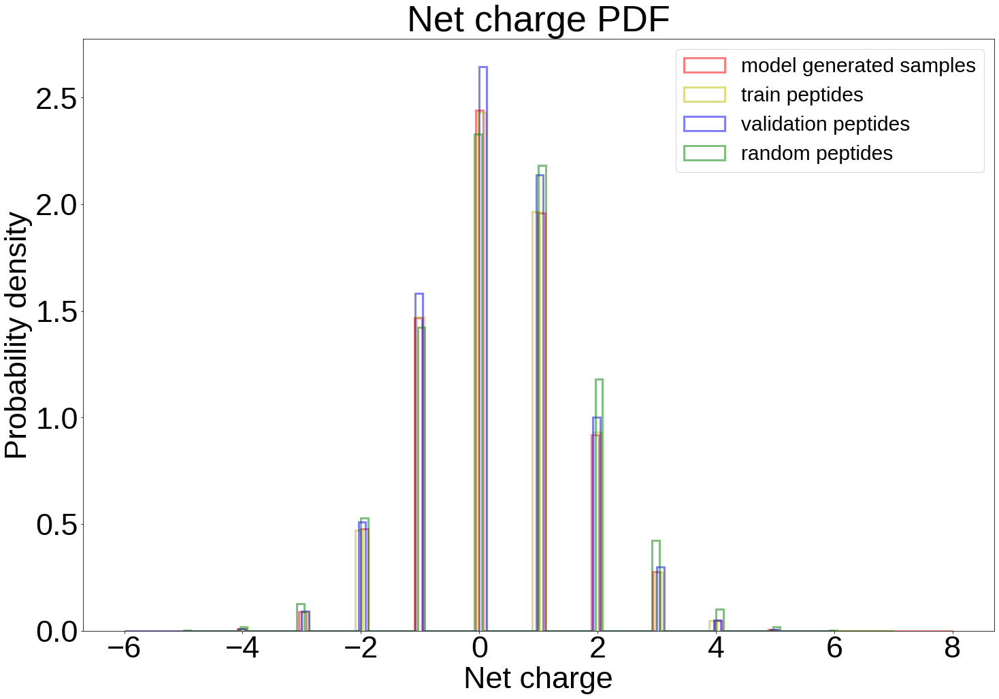

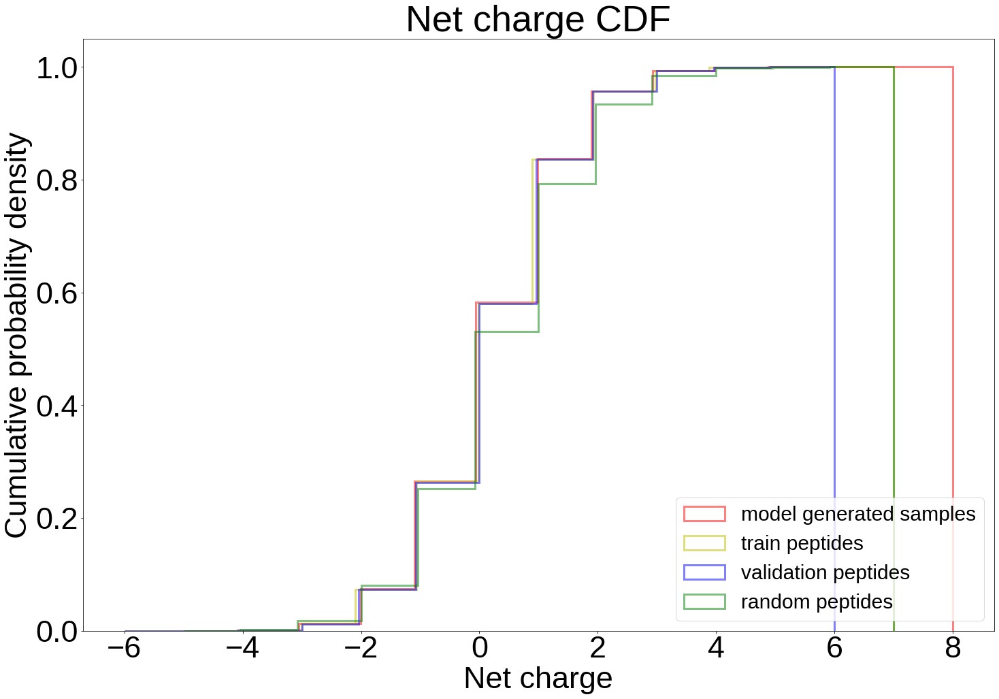

In [35]:
# plot the PDFs

plt.rcParams.update({
    'font.size': 45,
    'font.family': 'Liberation Sans',
    'lines.linewidth': 3,
})


plt.figure(figsize=(24, 16), facecolor=(1, 1, 1))
plt.hist(charge_samp, bins=100, density=True, alpha=0.5, histtype='step', color='r', label='model generated samples', lw=3)
plt.hist(charge_train, bins=100, density=True, alpha=0.5, histtype='step', color='y', label='train peptides', lw=3)
plt.hist(charge_validation, bins=100, density=True, alpha=0.5, histtype='step', color='b', label='validation peptides', lw=3)
plt.hist(charge_eval_random, bins=100, density=True, alpha=0.5, histtype='step', color='g', label='random peptides', lw=3)
plt.xlabel('Net charge')
plt.ylabel('Probability density')
plt.title('Net charge PDF')
plt.legend(loc = 'upper right', fontsize = 30)
plt.savefig('model_evaluation/charge_distribution_PDF.png', bbox_inches='tight')
plt.show()

# plot the CDFs
plt.figure(figsize=(24, 16), facecolor=(1, 1, 1))
plt.hist(charge_samp, bins=100, density=True, alpha=0.5, histtype='step', color='r', label='model generated samples', cumulative=True, lw=3)
plt.hist(charge_train, bins=100, density=True, alpha=0.5, histtype='step', color='y', label='train peptides', cumulative=True, lw=3)
plt.hist(charge_validation, bins=100, density=True, alpha=0.5, histtype='step', color='b', label='validation peptides', cumulative=True, lw=3)
plt.hist(charge_eval_random, bins=100, density=True, alpha=0.5, histtype='step', color='g', label='random peptides', cumulative=True, lw=3)
plt.xlabel('Net charge')
plt.ylabel('Cumulative probability density')
plt.title('Net charge CDF')
plt.legend(loc = 'lower right', fontsize = 30)
plt.savefig('model_evaluation/charge_distribution_CDF.png', bbox_inches='tight')
plt.show()

In [36]:
# 4. Perform the KS test: You can perform the KS test using a statistical software or programming language (e.g., R, Python). The KS test will compare the CDFs of the two datasets and return the KS statistic (D) and a p-value.
# samp vs. train
D_1, p_1 = ks_2samp(charge_samp_norm, charge_train_norm)
# samp vs. validation
D_2, p_2 = ks_2samp(charge_samp_norm, charge_validation_norm)
# samp vs. eval_random
D_3, p_3 = ks_2samp(charge_samp_norm, charge_eval_random_norm)
# train vs. validation
D_4, p_4 = ks_2samp(charge_train_norm, charge_validation_norm)
# train vs. eval_random
D_5, p_5 = ks_2samp(charge_train_norm, charge_eval_random_norm)
# validation vs. eval_random
D_6, p_6 = ks_2samp(charge_validation_norm, charge_eval_random_norm)

# 5. Interpret the results: If the p-value is less than 0.05, the two datasets are significantly different. If the p-value is greater than 0.05, the two datasets are not significantly different.
print('samp vs. train: D =', D_1, 'p-value =', p_1)
print('samp vs. validation: D =', D_2, 'p-value =', p_2)
print('samp vs. eval_random: D =', D_3, 'p-value =', p_3)
print('train vs. validation: D =', D_4, 'p-value =', p_4)
print('train vs. eval_random: D =', D_5, 'p-value =', p_5)
print('validation vs. eval_random: D =', D_6, 'p-value =', p_6)

samp vs. train: D = 0.0021214547361129155 p-value = 0.34839787975933756
samp vs. validation: D = 0.0027550132398862504 p-value = 0.38785127896591187
samp vs. eval_random: D = 0.0519589912556252 p-value = 1.5575990225782286e-252
train vs. validation: D = 0.0017054429610912636 p-value = 0.6265404188013151
train vs. eval_random: D = 0.04983753651951228 p-value = 0.0
validation vs. eval_random: D = 0.04920397801573895 p-value = 1.7059786690755523e-226


In [37]:
# samp vs. train
D_1, fpp_1 = kuiper_two(charge_samp_norm, charge_train_norm)
# samp vs. validation
D_2, fpp_2 = kuiper_two(charge_samp_norm, charge_validation_norm)
# samp vs. eval_random
D_3, fpp_3 = kuiper_two(charge_samp_norm, charge_eval_random_norm)
# train vs. validation
D_4, fpp_4 = kuiper_two(charge_train_norm, charge_validation_norm)
# train vs. eval_random
D_5, fpp_5 = kuiper_two(charge_train_norm, charge_eval_random_norm)
# validation vs. eval_random
D_6, fpp_6 = kuiper_two(charge_validation_norm, charge_eval_random_norm)

print('samp vs. train: D =', D_1, 'p-value, false positive probability =', fpp_1)
print('samp vs. validation: D =', D_2, 'p-value, false positive probability =', fpp_2)
print('samp vs. eval_random: D =', D_3, 'p-value, false positive probability =', fpp_3)
print('train vs. validation: D =', D_4, 'p-value, false positive probability =', fpp_4)
print('train vs. eval_random: D =', D_5, 'p-value, false positive probability =', fpp_5)
print('validation vs. eval_random: D =', D_6, 'p-value, false positive probability =', fpp_6)

samp vs. train: D = 0.0023593784732429046 p-value, false positive probability = 0.7727346021885203
samp vs. validation: D = 0.0027643207170480596 p-value, false positive probability = 0.9176175389039442
samp vs. eval_random: D = 0.05819500095402256 p-value, false positive probability = 0.0
train vs. validation: D = 0.0018696214370949964 p-value, false positive probability = 0.9696089655247975
train vs. eval_random: D = 0.0570400869974558 p-value, false positive probability = 0.0
validation vs. eval_random: D = 0.056859377981306 p-value, false positive probability = 5.029931139246117e-299


#### hydrophobicity distribution check

In [38]:
kyte_doolittle_scale = {
    'A': 1.8, 'R': -4.5, 'N': -3.5, 'D': -3.5, 'C': 2.5,
    'Q': -3.5, 'E': -3.5, 'G': -0.4, 'H': -3.2, 'I': 4.5,
    'L': 3.8, 'K': -3.9, 'M': 1.9, 'F': 2.8, 'P': -1.6,
    'S': -0.8, 'T': -0.7, 'W': -0.9, 'Y': -1.3, 'V': 4.2
}

def hydrophobicity(sequence, scale):
    return np.mean([scale[residue] for residue in sequence if residue in scale])

hydrophobicity_samp = np.array([hydrophobicity(sequence, kyte_doolittle_scale) for sequence in peptide_samp[:, 1]])
hydrophobicity_eval_random = np.array([hydrophobicity(sequence, kyte_doolittle_scale) for sequence in peptide_eval_random[:, 1]])
hydrophobicity_validation = np.array([hydrophobicity(sequence, kyte_doolittle_scale) for sequence in validation_array[:, 1]])
hydrophobicity_train = np.array([hydrophobicity(sequence, kyte_doolittle_scale) for sequence in train_array[:, 1]])

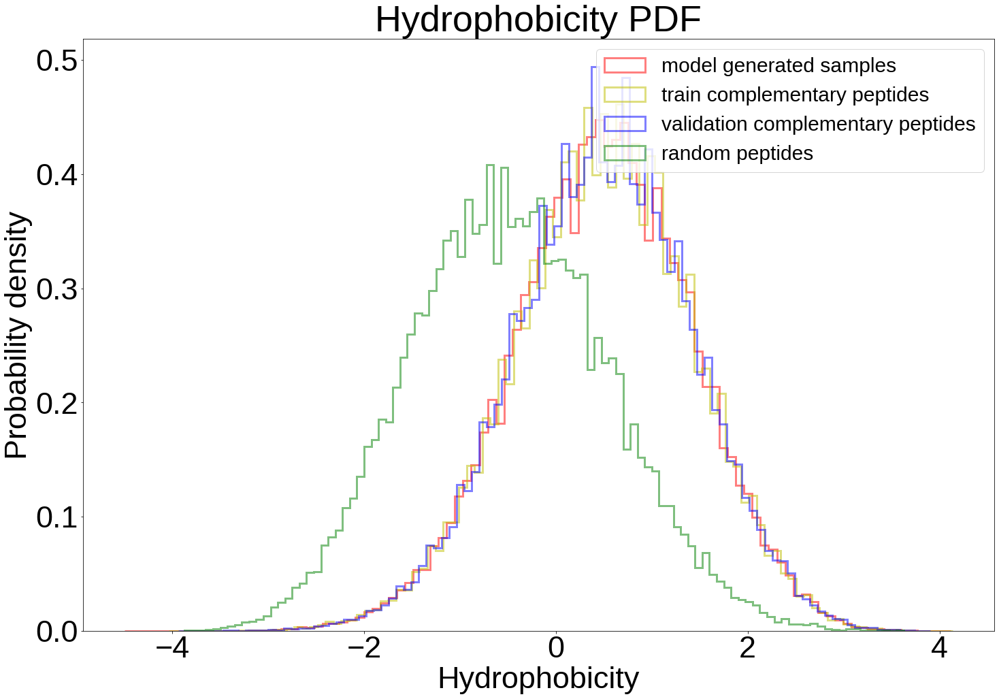

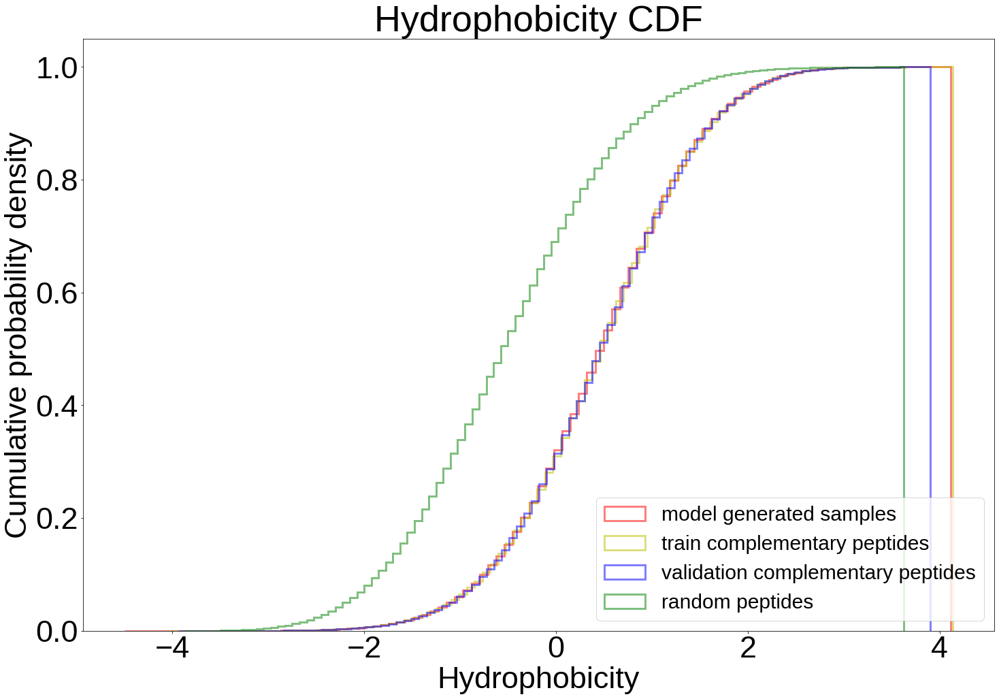

In [39]:
# plot the PDFs

plt.rcParams.update({
    'font.size': 45,
    'font.family': 'Liberation Sans',
    'lines.linewidth': 3,
})


plt.figure(figsize=(24, 16), facecolor=(1, 1, 1))
plt.hist(hydrophobicity_samp, bins=100, density=True, alpha=0.5, histtype='step', color='r', label='model generated samples', lw=3)
plt.hist(hydrophobicity_train, bins=100, density=True, alpha=0.5, histtype='step', color='y', label='train complementary peptides', lw=3)
plt.hist(hydrophobicity_validation, bins=100, density=True, alpha=0.5, histtype='step', color='b', label='validation complementary peptides', lw=3)
plt.hist(hydrophobicity_eval_random, bins=100, density=True, alpha=0.5, histtype='step', color='g', label='random peptides', lw=3)
plt.xlabel('Hydrophobicity')
plt.ylabel('Probability density')
plt.title('Hydrophobicity PDF')
plt.legend(loc='upper right', fontsize=30)
plt.savefig('model_evaluation/hydrophobicity_distribution_PDF.png', bbox_inches='tight')
plt.show()

# plot the CDFs
plt.figure(figsize=(24, 16), facecolor=(1, 1, 1))
plt.hist(hydrophobicity_samp, bins=100, density=True, alpha=0.5, histtype='step', color='r', label='model generated samples', cumulative=True, lw=3)
plt.hist(hydrophobicity_train, bins=100, density=True, alpha=0.5, histtype='step', color='y', label='train complementary peptides', cumulative=True, lw=3)
plt.hist(hydrophobicity_validation, bins=100, density=True, alpha=0.5, histtype='step', color='b', label='validation complementary peptides', cumulative=True, lw=3)
plt.hist(hydrophobicity_eval_random, bins=100, density=True, alpha=0.5, histtype='step', color='g', label='random peptides', cumulative=True, lw=3)
plt.xlabel('Hydrophobicity')
plt.ylabel('Cumulative probability density')
plt.title('Hydrophobicity CDF')
plt.legend(loc='lower right', fontsize=30)
plt.savefig('model_evaluation/hydrophobicity_distribution_CDF.png', bbox_inches='tight')
plt.show()

In [40]:
# samp vs. train
D_1, p_1 = ks_2samp(hydrophobicity_samp, hydrophobicity_train)
# samp vs. validation
D_2, p_2 = ks_2samp(hydrophobicity_samp, hydrophobicity_validation)
# samp vs. eval_random
D_3, p_3 = ks_2samp(hydrophobicity_samp, hydrophobicity_eval_random)
# train vs. validation
D_4, p_4 = ks_2samp(hydrophobicity_train, hydrophobicity_validation)
# train vs. eval_random
D_5, p_5 = ks_2samp(hydrophobicity_train, hydrophobicity_eval_random)
# validation vs. eval_random
D_6, p_6 = ks_2samp(hydrophobicity_validation, hydrophobicity_eval_random)

# 5. Interpret the results: If the p-value is less than 0.05, the two datasets are significantly different. If the p-value is greater than 0.05, the two datasets are not significantly different.
print('samp vs. train: D =', D_1, 'p-value =', p_1)
print('samp vs. validation: D =', D_2, 'p-value =', p_2)
print('samp vs. eval_random: D =', D_3, 'p-value =', p_3)
print('train vs. validation: D =', D_4, 'p-value =', p_4)
print('train vs. eval_random: D =', D_5, 'p-value =', p_5)
print('validation vs. eval_random: D =', D_6, 'p-value =', p_6)

samp vs. train: D = 0.002971386918174057 p-value = 0.06562098925820925
samp vs. validation: D = 0.002782935671371556 p-value = 0.3754361188066916
samp vs. eval_random: D = 0.39260334789953505 p-value = 0.0
train vs. validation: D = 0.0014191397433316322 p-value = 0.8303265932639454
train vs. eval_random: D = 0.394235145666322 p-value = 0.0
validation vs. eval_random: D = 0.3937342063746911 p-value = 0.0


In [41]:
# samp vs. train
D_1, fpp_1 = kuiper_two(hydrophobicity_samp, hydrophobicity_train)
# samp vs. validation
D_2, fpp_2 = kuiper_two(hydrophobicity_samp, hydrophobicity_validation)
# samp vs. eval_random
D_3, fpp_3 = kuiper_two(hydrophobicity_samp, hydrophobicity_eval_random)
# train vs. validation
D_4, fpp_4 = kuiper_two(hydrophobicity_train, hydrophobicity_validation)
# train vs. eval_random
D_5, fpp_5 = kuiper_two(hydrophobicity_train, hydrophobicity_eval_random)
# validation vs. eval_random
D_6, fpp_6 = kuiper_two(hydrophobicity_validation, hydrophobicity_eval_random)

print('samp vs. train: D =', D_1, 'p-value, false positive probability =', fpp_1)
print('samp vs. validation: D =', D_2, 'p-value, false positive probability =', fpp_2)
print('samp vs. eval_random: D =', D_3, 'p-value, false positive probability =', fpp_3)
print('train vs. validation: D =', D_4, 'p-value, false positive probability =', fpp_4)
print('train vs. eval_random: D =', D_5, 'p-value, false positive probability =', fpp_5)
print('validation vs. eval_random: D =', D_6, 'p-value, false positive probability =', fpp_6)

samp vs. train: D = 0.0036467332430685337 p-value, false positive probability = 0.10798712371472857
samp vs. validation: D = 0.0032948469152694016 p-value, false positive probability = 0.7129780652809242
samp vs. eval_random: D = 0.3926126553763742 p-value, false positive probability = 0.0
train vs. validation: D = 0.002641947239090482 p-value, false positive probability = 0.5911927580990899
train vs. eval_random: D = 0.39423566274895216 p-value, false positive probability = 0.0
validation vs. eval_random: D = 0.3937388601129482 p-value, false positive probability = 0.0


#### Molecular weights distribution check

In [42]:
molecular_weights = {
    'A': 89.094,   # Alanine
    'R': 174.203,  # Arginine
    'N': 132.119,  # Asparagine
    'D': 133.104,  # Aspartic acid
    'C': 121.154,  # Cysteine
    'E': 147.131,  # Glutamic acid
    'Q': 146.146,  # Glutamine
    'G': 75.067,   # Glycine
    'H': 155.156,  # Histidine
    'I': 131.175,  # Isoleucine
    'L': 131.175,  # Leucine
    'K': 146.189,  # Lysine
    'M': 149.208,  # Methionine
    'F': 165.192,  # Phenylalanine
    'P': 115.132,  # Proline
    'S': 105.093,  # Serine
    'T': 119.120,  # Threonine
    'W': 204.228,  # Tryptophan
    'Y': 181.191,  # Tyrosine
    'V': 117.148,  # Valine
}

def calculate_molecular_weights(sequence, scale):
    return np.mean([scale[residue] for residue in sequence if residue in scale])

molecular_weights_samp = np.array([calculate_molecular_weights(sequence, molecular_weights) for sequence in peptide_samp[:, 1]])
molecular_weights_eval_random = np.array([calculate_molecular_weights(sequence, molecular_weights) for sequence in peptide_eval_random[:, 1]])
molecular_weights_validation = np.array([calculate_molecular_weights(sequence, molecular_weights) for sequence in validation_array[:, 1]])
molecular_weights_train = np.array([calculate_molecular_weights(sequence, molecular_weights) for sequence in train_array[:, 1]])

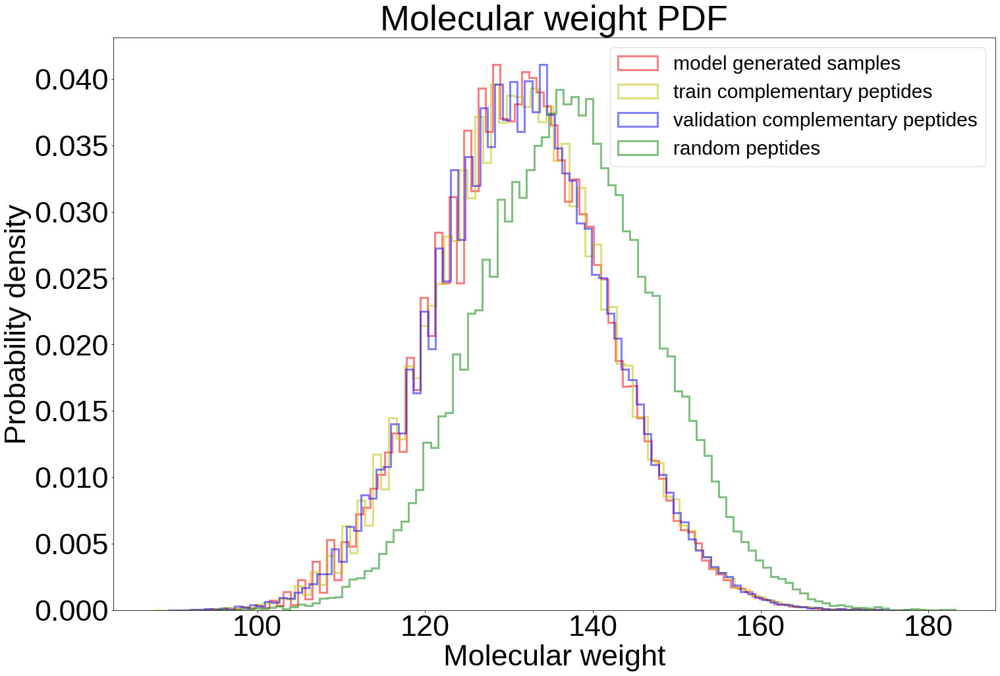

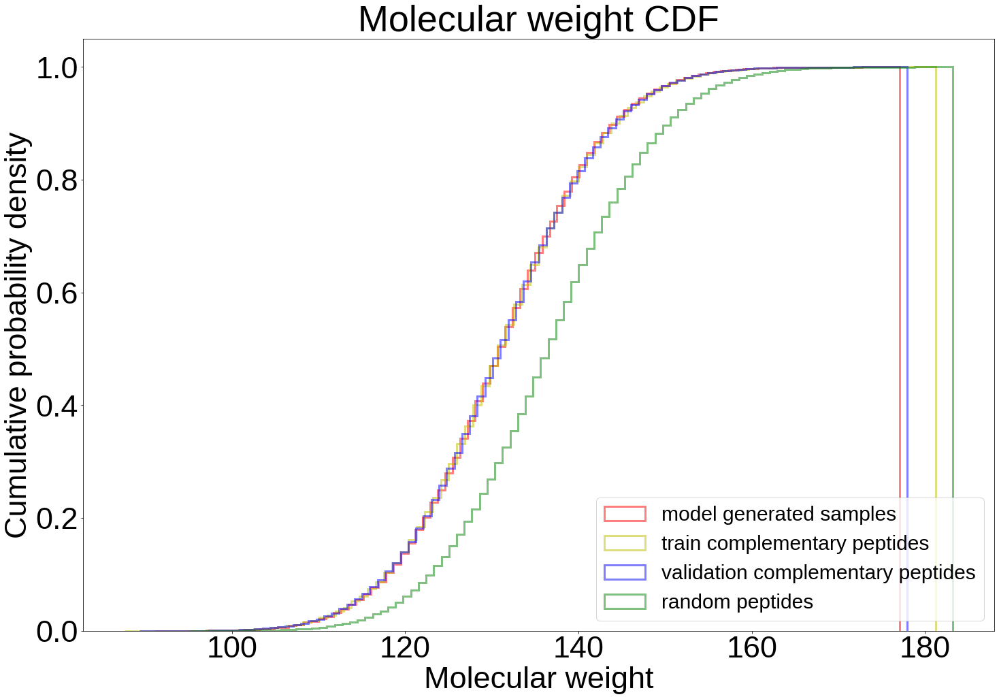

In [43]:
# plot the PDFs

plt.rcParams.update({
    'font.size': 45,
    'font.family': 'Liberation Sans',
    'lines.linewidth': 3,
})


plt.figure(figsize=(24, 16), facecolor=(1, 1, 1))
plt.hist(molecular_weights_samp, bins=100, density=True, alpha=0.5, histtype='step', color='r', label='model generated samples', lw=3)
plt.hist(molecular_weights_train, bins=100, density=True, alpha=0.5, histtype='step', color='y', label='train complementary peptides', lw=3)
plt.hist(molecular_weights_validation, bins=100, density=True, alpha=0.5, histtype='step', color='b', label='validation complementary peptides', lw=3)
plt.hist(molecular_weights_eval_random, bins=100, density=True, alpha=0.5, histtype='step', color='g', label='random peptides', lw=3)
plt.xlabel('Molecular weight')
plt.ylabel('Probability density')
plt.title('Molecular weight PDF')
plt.legend(loc='upper right', fontsize=30)
plt.savefig('model_evaluation/molecular_weight_distribution_PDF.png', bbox_inches='tight')
plt.show()


# plot the CDFs
plt.figure(figsize=(24, 16), facecolor=(1, 1, 1))
plt.hist(molecular_weights_samp, bins=100, density=True, alpha=0.5, histtype='step', color='r', label='model generated samples', cumulative=True, lw=3)
plt.hist(molecular_weights_train, bins=100, density=True, alpha=0.5, histtype='step', color='y', label='train complementary peptides', cumulative=True, lw=3)
plt.hist(molecular_weights_validation, bins=100, density=True, alpha=0.5, histtype='step', color='b', label='validation complementary peptides', cumulative=True, lw=3)
plt.hist(molecular_weights_eval_random, bins=100, density=True, alpha=0.5, histtype='step', color='g', label='random peptides', cumulative=True, lw=3)
plt.xlabel('Molecular weight')
plt.ylabel('Cumulative probability density')
plt.title('Molecular weight CDF')
plt.legend(loc='lower right', fontsize=30)
plt.savefig('model_evaluation/molecular_weight_distribution_CDF.png', bbox_inches='tight')
plt.show()

In [44]:
# samp vs. train
D_1, p_1 = ks_2samp(molecular_weights_samp, molecular_weights_train)
# samp vs. validation
D_2, p_2 = ks_2samp(molecular_weights_samp, molecular_weights_validation)
# samp vs. eval_random
D_3, p_3 = ks_2samp(molecular_weights_samp, molecular_weights_eval_random)
# train vs. validation
D_4, p_4 = ks_2samp(molecular_weights_train, molecular_weights_validation)
# train vs. eval_random
D_5, p_5 = ks_2samp(molecular_weights_train, molecular_weights_eval_random)
# validation vs. eval_random
D_6, p_6 = ks_2samp(molecular_weights_validation, molecular_weights_eval_random)

# 5. Interpret the results: If the p-value is less than 0.05, the two datasets are significantly different. If the p-value is greater than 0.05, the two datasets are not significantly different.
print('samp vs. train: D =', D_1, 'p-value =', p_1)
print('samp vs. validation: D =', D_2, 'p-value =', p_2)
print('samp vs. eval_random: D =', D_3, 'p-value =', p_3)
print('train vs. validation: D =', D_4, 'p-value =', p_4)
print('train vs. eval_random: D =', D_5, 'p-value =', p_5)
print('validation vs. eval_random: D =', D_6, 'p-value =', p_6)

samp vs. train: D = 0.004699456947286351 p-value = 0.0003889163220296368
samp vs. validation: D = 0.004914347941418762 p-value = 0.011112624591752192
samp vs. eval_random: D = 0.21439308268297336 p-value = 0.0
train vs. validation: D = 0.0015850740853206036 p-value = 0.7154955854989163
train vs. eval_random: D = 0.21164796835806687 p-value = 0.0
validation vs. eval_random: D = 0.2105444408765782 p-value = 0.0


In [45]:
# samp vs. train
D_1, fpp_1 = kuiper_two(molecular_weights_samp, molecular_weights_train)
# samp vs. validation
D_2, fpp_2 = kuiper_two(molecular_weights_samp, molecular_weights_validation)
# samp vs. eval_random
D_3, fpp_3 = kuiper_two(molecular_weights_samp, molecular_weights_eval_random)
# train vs. validation
D_4, fpp_4 = kuiper_two(molecular_weights_train, molecular_weights_validation)
# train vs. eval_random
D_5, fpp_5 = kuiper_two(molecular_weights_train, molecular_weights_eval_random)
# validation vs. eval_random
D_6, fpp_6 = kuiper_two(molecular_weights_validation, molecular_weights_eval_random)

print('samp vs. train: D =', D_1, 'p-value, false positive probability =', fpp_1)
print('samp vs. validation: D =', D_2, 'p-value, false positive probability =', fpp_2)
print('samp vs. eval_random: D =', D_3, 'p-value, false positive probability =', fpp_3)
print('train vs. validation: D =', D_4, 'p-value, false positive probability =', fpp_4)
print('train vs. eval_random: D =', D_5, 'p-value, false positive probability =', fpp_5)
print('validation vs. eval_random: D =', D_6, 'p-value, false positive probability =', fpp_6)

samp vs. train: D = 0.007046306277375363 p-value, false positive probability = 3.387574963196888e-07
samp vs. validation: D = 0.007897394371768536 p-value, false positive probability = 7.728797463060385e-05
samp vs. eval_random: D = 0.21439308268283103 p-value, false positive probability = 0.0
train vs. validation: D = 0.0027562007646229607 p-value, false positive probability = 0.5157248879406119
train vs. eval_random: D = 0.21164796835469973 p-value, false positive probability = 0.0
validation vs. eval_random: D = 0.21054444087643975 p-value, false positive probability = 0.0


#### iso-electric point distribution check

In [46]:
def calculate_isoelectric_point(peptide_sequence):
    analysis = ProteinAnalysis(peptide_sequence)
    return analysis.isoelectric_point()

isoelectric_point_samp = np.array([calculate_isoelectric_point(sequence) for sequence in peptide_samp[:, 1]])
isoelectric_point_eval_random = np.array([calculate_isoelectric_point(sequence) for sequence in peptide_eval_random[:, 1]])
isoelectric_point_validation = np.array([calculate_isoelectric_point(sequence) for sequence in validation_array[:, 1]])
isoelectric_point_train = np.array([calculate_isoelectric_point(sequence) for sequence in train_array[:, 1]])

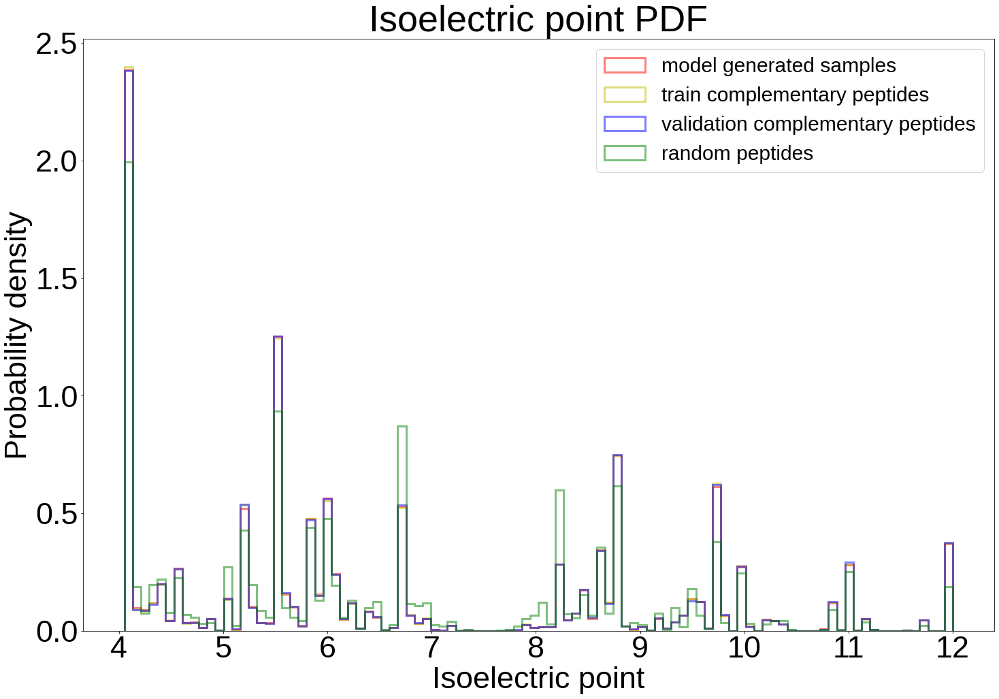

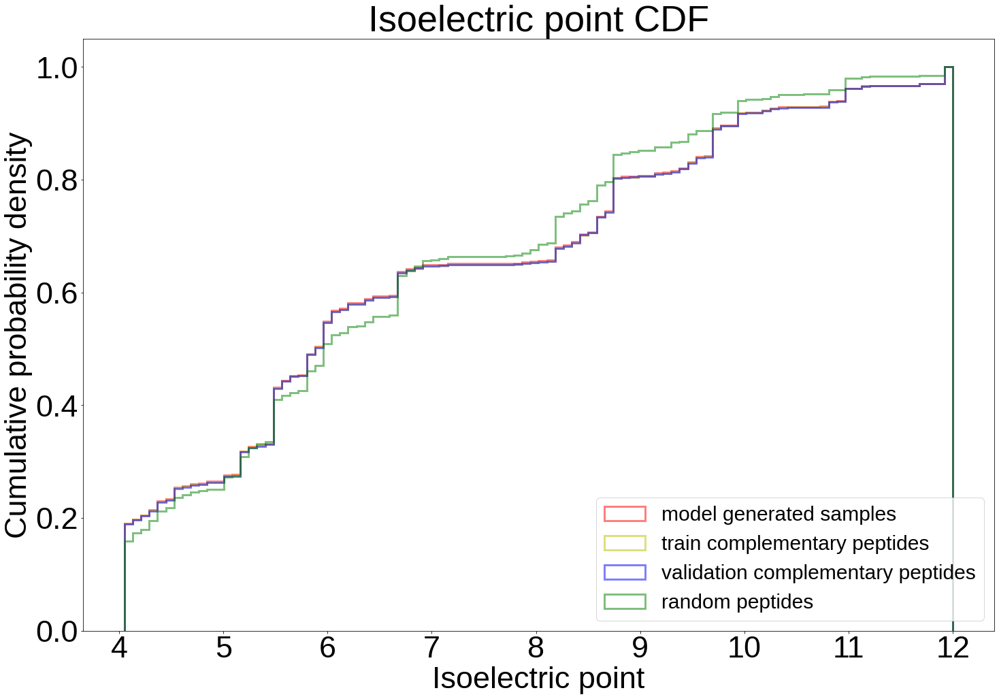

In [47]:
# plot the PDFs

plt.rcParams.update({
    'font.size': 45,
    'font.family': 'Liberation Sans',
    'lines.linewidth': 3,
})


plt.figure(figsize=(24, 16), facecolor=(1, 1, 1))
plt.hist(isoelectric_point_samp, bins=100, density=True, alpha=0.5, histtype='step', color='r', label='model generated samples', lw=3)
plt.hist(isoelectric_point_train, bins=100, density=True, alpha=0.5, histtype='step', color='y', label='train complementary peptides', lw=3)
plt.hist(isoelectric_point_validation, bins=100, density=True, alpha=0.5, histtype='step', color='b', label='validation complementary peptides', lw=3)
plt.hist(isoelectric_point_eval_random, bins=100, density=True, alpha=0.5, histtype='step', color='g', label='random peptides', lw=3)
plt.xlabel('Isoelectric point')
plt.ylabel('Probability density')
plt.title('Isoelectric point PDF')
plt.legend(loc='upper right', fontsize=30)
plt.savefig('model_evaluation/isoelectric_point_distribution_PDF.png', bbox_inches='tight')
plt.show()

# plot the CDFs
plt.figure(figsize=(24, 16), facecolor=(1, 1, 1))
plt.hist(isoelectric_point_samp, bins=100, density=True, alpha=0.5, color='r', cumulative=True, histtype='step', label='model generated samples', lw=3)
plt.hist(isoelectric_point_train, bins=100, density=True, alpha=0.5, color='y', cumulative=True, histtype='step', label='train complementary peptides', lw=3)
plt.hist(isoelectric_point_validation, bins=100, density=True, alpha=0.5, color='b', cumulative=True, histtype='step', label='validation complementary peptides', lw=3)
plt.hist(isoelectric_point_eval_random, bins=100, density=True, alpha=0.5, color='g', cumulative=True, histtype='step', label='random peptides', lw=3)
plt.xlabel('Isoelectric point')
plt.ylabel('Cumulative probability density')
plt.title('Isoelectric point CDF')
plt.legend(loc='lower right', fontsize=30)
plt.savefig('model_evaluation/isoelectric_point_distribution_CDF.png', bbox_inches='tight')
plt.show()

In [48]:
# samp vs. train
D_1, p_1 = ks_2samp(isoelectric_point_samp, isoelectric_point_train)
# samp vs. validation
D_2, p_2 = ks_2samp(isoelectric_point_samp, isoelectric_point_validation)
# samp vs. eval_random
D_3, p_3 = ks_2samp(isoelectric_point_samp, isoelectric_point_eval_random)
# train vs. validation
D_4, p_4 = ks_2samp(isoelectric_point_train, isoelectric_point_validation)
# train vs. eval_random
D_5, p_5 = ks_2samp(isoelectric_point_train, isoelectric_point_eval_random)
# validation vs. eval_random
D_6, p_6 = ks_2samp(isoelectric_point_validation, isoelectric_point_eval_random)

print('samp vs. train: D =', D_1, 'p-value =', p_1)
print('samp vs. validation: D =', D_2, 'p-value =', p_2)
print('samp vs. eval_random: D =', D_3, 'p-value =', p_3)
print('train vs. validation: D =', D_4, 'p-value =', p_4)
print('train vs. eval_random: D =', D_5, 'p-value =', p_5)
print('validation vs. eval_random: D =', D_6, 'p-value =', p_6)

samp vs. train: D = 0.002693432837080789 p-value = 0.12065264090457262
samp vs. validation: D = 0.002987700168930685 p-value = 0.2922651116759416
samp vs. eval_random: D = 0.05780408691322181 p-value = 1.72861614434e-312
train vs. validation: D = 0.001947972951069854 p-value = 0.45470460224075615
train vs. eval_random: D = 0.06011701941008152 p-value = 0.0
validation vs. eval_random: D = 0.059795887025842154 p-value = 0.0


In [49]:
# samp vs. train
D_1, fpp_1 = kuiper_two(isoelectric_point_samp, isoelectric_point_train)
# samp vs. validation
D_2, fpp_2 = kuiper_two(isoelectric_point_samp, isoelectric_point_validation)
# samp vs. eval_random
D_3, fpp_3 = kuiper_two(isoelectric_point_samp, isoelectric_point_eval_random)
# train vs. validation
D_4, fpp_4 = kuiper_two(isoelectric_point_train, isoelectric_point_validation)
# train vs. eval_random
D_5, fpp_5 = kuiper_two(isoelectric_point_train, isoelectric_point_eval_random)
# validation vs. eval_random
D_6, fpp_6 = kuiper_two(isoelectric_point_validation, isoelectric_point_eval_random)

print('samp vs. train: D =', D_1, 'p-value, false positive probability =', fpp_1)
print('samp vs. validation: D =', D_2, 'p-value, false positive probability =', fpp_2)
print('samp vs. eval_random: D =', D_3, 'p-value, false positive probability =', fpp_3)
print('train vs. validation: D =', D_4, 'p-value, false positive probability =', fpp_4)
print('train vs. eval_random: D =', D_5, 'p-value, false positive probability =', fpp_5)
print('validation vs. eval_random: D =', D_6, 'p-value, false positive probability =', fpp_6)

samp vs. train: D = 0.003434633030939037 p-value, false positive probability = 0.168961332153866
samp vs. validation: D = 0.0029877001689307325 p-value, false positive probability = 0.8453892115525491
samp vs. eval_random: D = 0.10132585012170664 p-value, false positive probability = 0.0
train vs. validation: D = 0.0026123868337348324 p-value, false positive probability = 0.6108661780101594
train vs. eval_random: D = 0.10144961368438415 p-value, false positive probability = 0.0
validation vs. eval_random: D = 0.10083255383213217 p-value, false positive probability = 0.0


#### aromaticity distribution check

In [50]:
def calculate_aromaticity(peptide_sequence):
    analysis = ProteinAnalysis(peptide_sequence)
    return analysis.aromaticity()

aromaticity_samp = np.array([calculate_aromaticity(sequence) for sequence in peptide_samp[:, 1]])
aromaticity_eval_random = np.array([calculate_aromaticity(sequence) for sequence in peptide_eval_random[:, 1]])
aromaticity_validation = np.array([calculate_aromaticity(sequence) for sequence in validation_array[:, 1]])
aromaticity_train = np.array([calculate_aromaticity(sequence) for sequence in train_array[:, 1]])

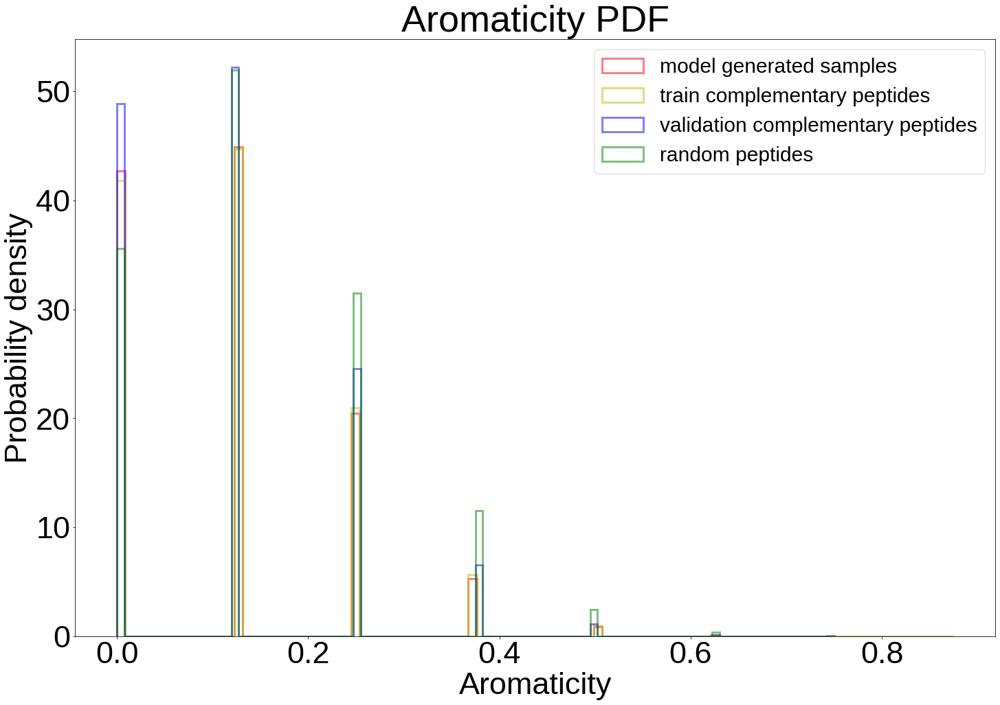

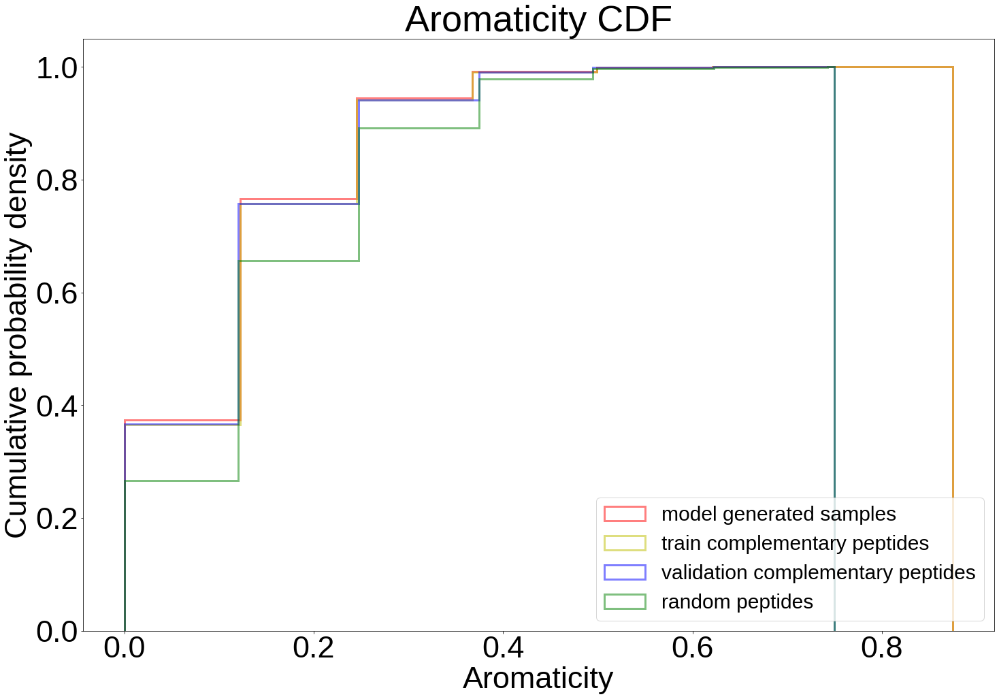

In [51]:
# plot the PDFs

plt.rcParams.update({
    'font.size': 45,
    'font.family': 'Liberation Sans',
    'lines.linewidth': 3,
})


plt.figure(figsize=(24, 16), facecolor=(1, 1, 1))
plt.hist(aromaticity_samp, bins=100, density=True, alpha=0.5, histtype='step', color='r', label='model generated samples', lw=3)
plt.hist(aromaticity_train, bins=100, density=True, alpha=0.5, histtype='step', color='y', label='train complementary peptides', lw=3)
plt.hist(aromaticity_validation, bins=100, density=True, alpha=0.5, histtype='step', color='b', label='validation complementary peptides', lw=3)
plt.hist(aromaticity_eval_random, bins=100, density=True, alpha=0.5, histtype='step', color='g', label='random peptides', lw=3)
plt.xlabel('Aromaticity')
plt.ylabel('Probability density')
plt.title('Aromaticity PDF')
plt.legend(loc='upper right', fontsize=30)
plt.savefig('model_evaluation/aromaticity_distribution_PDF.png', bbox_inches='tight')
plt.show()

# plot the CDFs
plt.figure(figsize=(24, 16), facecolor=(1, 1, 1))
plt.hist(aromaticity_samp, bins=100, density=True, alpha=0.5, color='r', cumulative=True, histtype='step', label='model generated samples', lw=3)
plt.hist(aromaticity_train, bins=100, density=True, alpha=0.5, color='y', cumulative=True, histtype='step', label='train complementary peptides', lw=3)
plt.hist(aromaticity_validation, bins=100, density=True, alpha=0.5, color='b', cumulative=True, histtype='step', label='validation complementary peptides', lw=3)
plt.hist(aromaticity_eval_random, bins=100, density=True, alpha=0.5, color='g', cumulative=True, histtype='step', label='random peptides', lw=3)
plt.xlabel('Aromaticity')
plt.ylabel('Cumulative probability density')
plt.title('Aromaticity CDF')
plt.legend(loc='lower right', fontsize=30)
plt.savefig('model_evaluation/aromaticity_distribution_CDF.png', bbox_inches='tight')
plt.show()

In [52]:
# samp vs. train
D_1, p_1 = ks_2samp(aromaticity_samp, aromaticity_train)
# samp vs. validation
D_2, p_2 = ks_2samp(aromaticity_samp, aromaticity_validation)
# samp vs. eval_random
D_3, p_3 = ks_2samp(aromaticity_samp, aromaticity_eval_random)
# train vs. validation
D_4, p_4 = ks_2samp(aromaticity_train, aromaticity_validation)
# train vs. eval_random
D_5, p_5 = ks_2samp(aromaticity_train, aromaticity_eval_random)
# validation vs. eval_random
D_6, p_6 = ks_2samp(aromaticity_validation, aromaticity_eval_random)

print('samp vs. train: D =', D_1, 'p-value =', p_1)
print('samp vs. validation: D =', D_2, 'p-value =', p_2)
print('samp vs. eval_random: D =', D_3, 'p-value =', p_3)
print('train vs. validation: D =', D_4, 'p-value =', p_4)
print('train vs. eval_random: D =', D_5, 'p-value =', p_5)
print('validation vs. eval_random: D =', D_6, 'p-value =', p_6)

samp vs. train: D = 0.008839658943821771 p-value = 1.4874722791263747e-13
samp vs. validation: D = 0.008511687864445894 p-value = 3.447140836946179e-07
samp vs. eval_random: D = 0.11013537725531808 p-value = 0.0
train vs. validation: D = 0.001119390846207935 p-value = 0.9684540941513167
train vs. eval_random: D = 0.10129571831149631 p-value = 0.0
validation vs. eval_random: D = 0.10162368939087219 p-value = 0.0


In [53]:
# samp vs. train
D_1, fpp_1 = kuiper_two(aromaticity_samp, aromaticity_train)
# samp vs. validation
D_2, fpp_2 = kuiper_two(aromaticity_samp, aromaticity_validation)
# samp vs. eval_random
D_3, fpp_3 = kuiper_two(aromaticity_samp, aromaticity_eval_random)
# train vs. validation
D_4, fpp_4 = kuiper_two(aromaticity_train, aromaticity_validation)
# train vs. eval_random
D_5, fpp_5 = kuiper_two(aromaticity_train, aromaticity_eval_random)
# validation vs. eval_random
D_6, fpp_6 = kuiper_two(aromaticity_validation, aromaticity_eval_random)

print('samp vs. train: D =', D_1, 'p-value, false positive probability =', fpp_1)
print('samp vs. validation: D =', D_2, 'p-value, false positive probability =', fpp_2)
print('samp vs. eval_random: D =', D_3, 'p-value, false positive probability =', fpp_3)
print('train vs. validation: D =', D_4, 'p-value, false positive probability =', fpp_4)
print('train vs. eval_random: D =', D_5, 'p-value, false positive probability =', fpp_5)
print('validation vs. eval_random: D =', D_6, 'p-value, false positive probability =', fpp_6)

samp vs. train: D = 0.008842244356748713 p-value, false positive probability = 8.648789277221552e-12
samp vs. validation: D = 0.008516341603026587 p-value, false positive probability = 1.017501686586789e-05
samp vs. eval_random: D = 0.11014003099386212 p-value, false positive probability = 0.0
train vs. validation: D = 0.0011193908508036982 p-value, false positive probability = 0.9999996857449123
train vs. eval_random: D = 0.101297786637916 p-value, false positive probability = 0.0
validation vs. eval_random: D = 0.10162368939084393 p-value, false positive probability = 0.0


# Task 8: Hamming simmilarity score for training, validation and validation+training

# Task 9: Model selection

In [1]:
import numpy as np
import matplotlib.pyplot as plt

In [28]:
# load training loss array
model_base_training_loss = np.loadtxt('model_selection/model_base/model_training/model_base_training_loss.csv', delimiter=',')
model_A_training_loss = np.loadtxt('model_selection/model_A/model_training/model_A_training_loss.csv', delimiter=',')
model_B_training_loss = np.loadtxt('model_selection/model_B/model_training/model_B_training_loss.csv', delimiter=',')
model_C_training_loss = np.loadtxt('model_selection/model_C/model_training/model_C_training_loss.csv', delimiter=',')
model_D_training_loss = np.loadtxt('model_selection/model_D/model_training/model_D_training_loss.csv', delimiter=',')
model_E_training_loss = np.loadtxt('model_selection/model_E/model_training/model_E_training_loss.csv', delimiter=',')
model_F_training_loss = np.loadtxt('model_selection/model_F/model_training/model_F_training_loss.csv', delimiter=',')
model_G_training_loss = np.loadtxt('model_selection/model_G/model_training/model_G_training_loss.csv', delimiter=',')
model_H_training_loss = np.loadtxt('model_selection/model_H/model_training/model_H_training_loss.csv', delimiter=',')
model_I_training_loss = np.loadtxt('model_selection/model_I/model_training/model_I_training_loss.csv', delimiter=',')
model_J_training_loss = np.loadtxt('model_selection/model_J/model_training/model_J_training_loss.csv', delimiter=',')
model_K_training_loss = np.loadtxt('model_selection/model_K/model_training/model_K_training_loss.csv', delimiter=',')
model_L_training_loss = np.loadtxt('model_selection/model_L/model_training/model_L_training_loss.csv', delimiter=',')
model_M_training_loss = np.loadtxt('model_selection/model_M/model_training/model_M_training_loss.csv', delimiter=',')

# load validation loss array  
model_base_validation_loss = np.loadtxt('model_selection/model_base/model_training/model_base_validation_score_loss.csv', delimiter=',')
model_A_validation_loss = np.loadtxt('model_selection/model_A/model_training/model_A_validation_score_loss.csv', delimiter=',')
model_B_validation_loss = np.loadtxt('model_selection/model_B/model_training/model_B_validation_score_loss.csv', delimiter=',')
model_C_validation_loss = np.loadtxt('model_selection/model_C/model_training/model_C_validation_score_loss.csv', delimiter=',')
model_D_validation_loss = np.loadtxt('model_selection/model_D/model_training/model_D_validation_score_loss.csv', delimiter=',')
model_E_validation_loss = np.loadtxt('model_selection/model_E/model_training/model_E_validation_score_loss.csv', delimiter=',')
model_F_validation_loss = np.loadtxt('model_selection/model_F/model_training/model_F_validation_score_loss.csv', delimiter=',')
model_G_validation_loss = np.loadtxt('model_selection/model_G/model_training/model_G_validation_score_loss.csv', delimiter=',')
model_H_validation_loss = np.loadtxt('model_selection/model_H/model_training/model_H_validation_score_loss.csv', delimiter=',')
model_I_validation_loss = np.loadtxt('model_selection/model_I/model_training/model_I_validation_score_loss.csv', delimiter=',')
model_J_validation_loss = np.loadtxt('model_selection/model_J/model_training/model_J_validation_score_loss.csv', delimiter=',')
model_K_validation_loss = np.loadtxt('model_selection/model_K/model_training/model_K_validation_score_loss.csv', delimiter=',')
model_L_validation_loss = np.loadtxt('model_selection/model_L/model_training/model_L_validation_score_loss.csv', delimiter=',')
model_M_validation_loss = np.loadtxt('model_selection/model_M/model_training/model_M_validation_score_loss.csv', delimiter=',')

# retrain training loss
model_M_training_loss_retrain = np.loadtxt('model_M/model_M_training_loss.csv', delimiter=',')

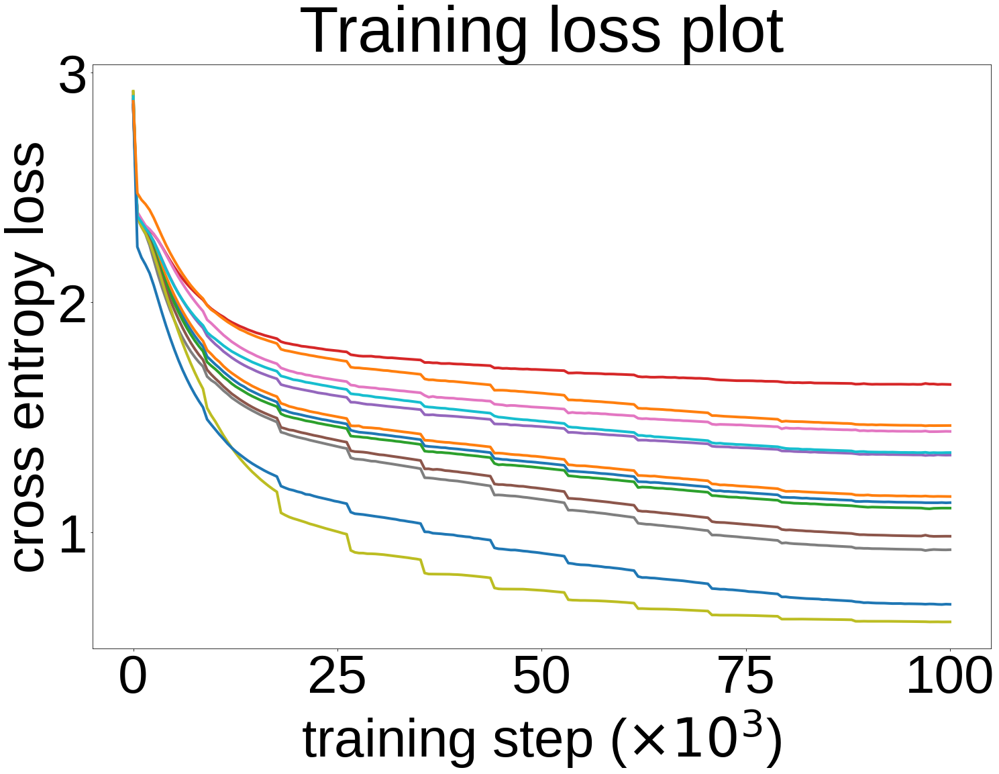

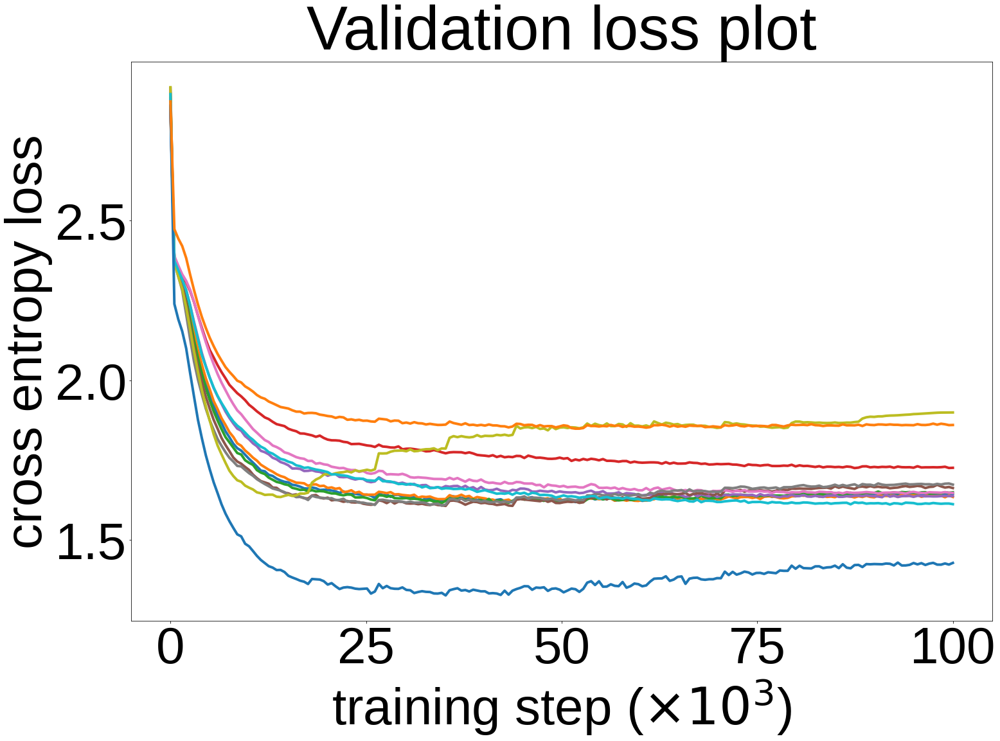

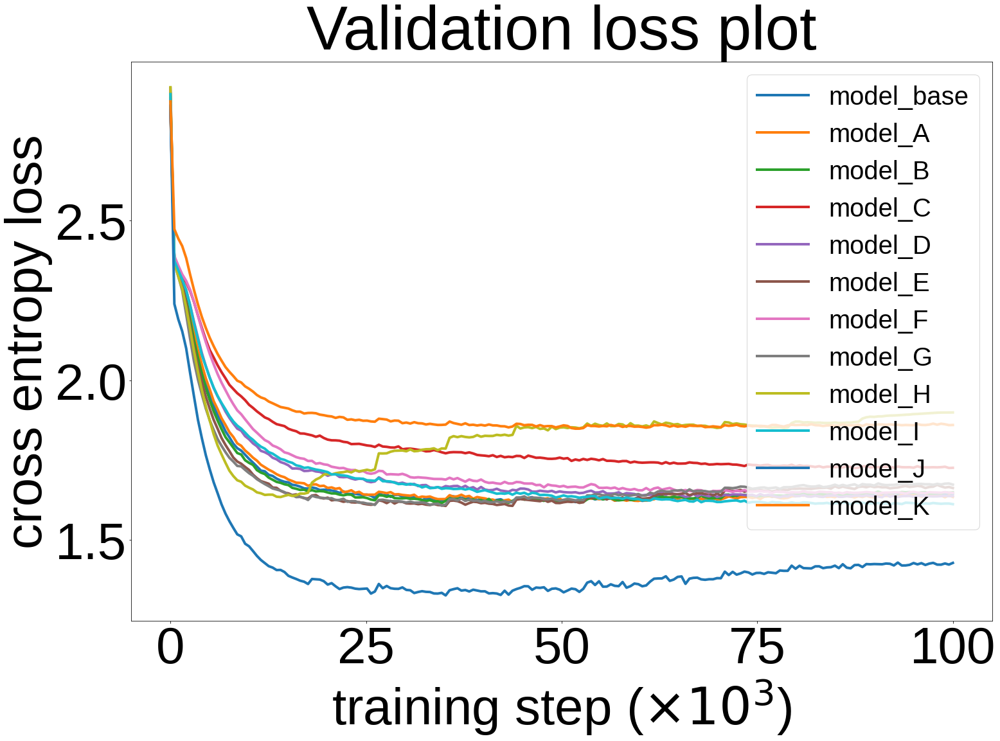

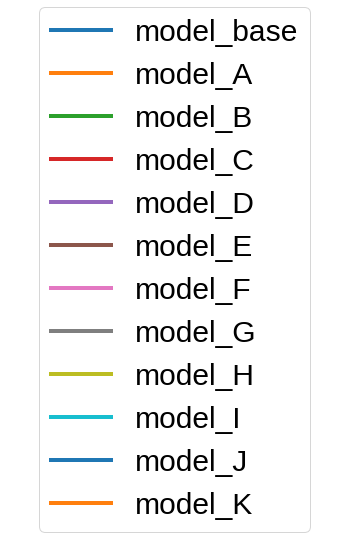

In [26]:
# plot the training loss

plt.rcParams.update({
    'font.size': 80,
    'font.family': 'Liberation Sans',
    'lines.linewidth': 4,
})


plt.figure(figsize=(24, 16), facecolor=(1, 1, 1))
x_axis = np.linspace(0, 100, 200)
plt.plot(x_axis, model_base_training_loss, label='model_base')
plt.plot(x_axis, model_A_training_loss, label='model_A')
plt.plot(x_axis, model_B_training_loss, label='model_B')
plt.plot(x_axis, model_C_training_loss, label='model_C')
plt.plot(x_axis, model_D_training_loss, label='model_D')
plt.plot(x_axis, model_E_training_loss, label='model_E')
plt.plot(x_axis, model_F_training_loss, label='model_F')
plt.plot(x_axis, model_G_training_loss, label='model_G')
plt.plot(x_axis, model_H_training_loss, label='model_H')
plt.plot(x_axis, model_I_training_loss, label='model_I')
plt.plot(x_axis, model_J_training_loss, label='model_J')
plt.plot(x_axis, model_K_training_loss, label='model_K')
# plt.plot(x_axis, model_L_training_loss, label='model_L')
plt.xlabel('training step ($\\times 10^{3}$)')
plt.ylabel('cross entropy loss')
plt.title('Training loss plot')
# plt.legend(fontsize=40, bbox_to_anchor=(1.29, 1), loc='upper right')
plt.savefig('model_evaluation/training_loss_different_models.png', bbox_inches='tight')
plt.show()

# plot the validation loss
plt.figure(figsize=(24, 16), facecolor=(1, 1, 1))
x_axis = np.linspace(0, 100, 200)
plt.plot(x_axis, model_base_validation_loss, label='model_base')
plt.plot(x_axis, model_A_validation_loss, label='model_A')
plt.plot(x_axis, model_B_validation_loss, label='model_B')
plt.plot(x_axis, model_C_validation_loss, label='model_C')
plt.plot(x_axis, model_D_validation_loss, label='model_D')
plt.plot(x_axis, model_E_validation_loss, label='model_E')
plt.plot(x_axis, model_F_validation_loss, label='model_F')
plt.plot(x_axis, model_G_validation_loss, label='model_G')
plt.plot(x_axis, model_H_validation_loss, label='model_H')
plt.plot(x_axis, model_I_validation_loss, label='model_I')
plt.plot(x_axis, model_J_validation_loss, label='model_J')
plt.plot(x_axis, model_K_validation_loss, label='model_K')
# plt.plot(x_axis, model_L_validation_loss, label='model_L')
plt.xlabel('training step ($\\times 10^{3}$)')
plt.ylabel('cross entropy loss')
plt.title('Validation loss plot')
# plt.legend(fontsize=40, bbox_to_anchor=(1.29, 1), loc='upper right')
plt.savefig('model_evaluation/validation_loss_different_models.png', bbox_inches='tight')
plt.show()

# plot the validation loss
plt.figure(figsize=(24, 16), facecolor=(1, 1, 1))
x_axis = np.linspace(0, 100, 200)
plt.plot(x_axis, model_base_validation_loss, label='model_base')
plt.plot(x_axis, model_A_validation_loss, label='model_A')
plt.plot(x_axis, model_B_validation_loss, label='model_B')
plt.plot(x_axis, model_C_validation_loss, label='model_C')
plt.plot(x_axis, model_D_validation_loss, label='model_D')
plt.plot(x_axis, model_E_validation_loss, label='model_E')
plt.plot(x_axis, model_F_validation_loss, label='model_F')
plt.plot(x_axis, model_G_validation_loss, label='model_G')
plt.plot(x_axis, model_H_validation_loss, label='model_H')
plt.plot(x_axis, model_I_validation_loss, label='model_I')
plt.plot(x_axis, model_J_validation_loss, label='model_J')
plt.plot(x_axis, model_K_validation_loss, label='model_K')
# plt.plot(x_axis, model_L_validation_loss, label='model_L')
plt.xlabel('training step ($\\times 10^{3}$)')
plt.ylabel('cross entropy loss')
plt.title('Validation loss plot')
legend = plt.legend(fontsize=40, loc='upper right')

# Create a new figure for the legend
legend_figure = plt.figure(figsize=(6, 4), facecolor=(1, 1, 1))
ax = legend_figure.add_subplot(111)
ax.axis('off')

# Draw the legend onto the new figure
legend_figure.legend(handles=legend.legendHandles, labels=[t.get_text() for t in legend.texts], loc='center', fontsize=30)

# Save the legend figure
legend_figure.savefig('model_evaluation/model_selection_100K_legend.png', bbox_inches='tight')

# Show the original plot
plt.show()

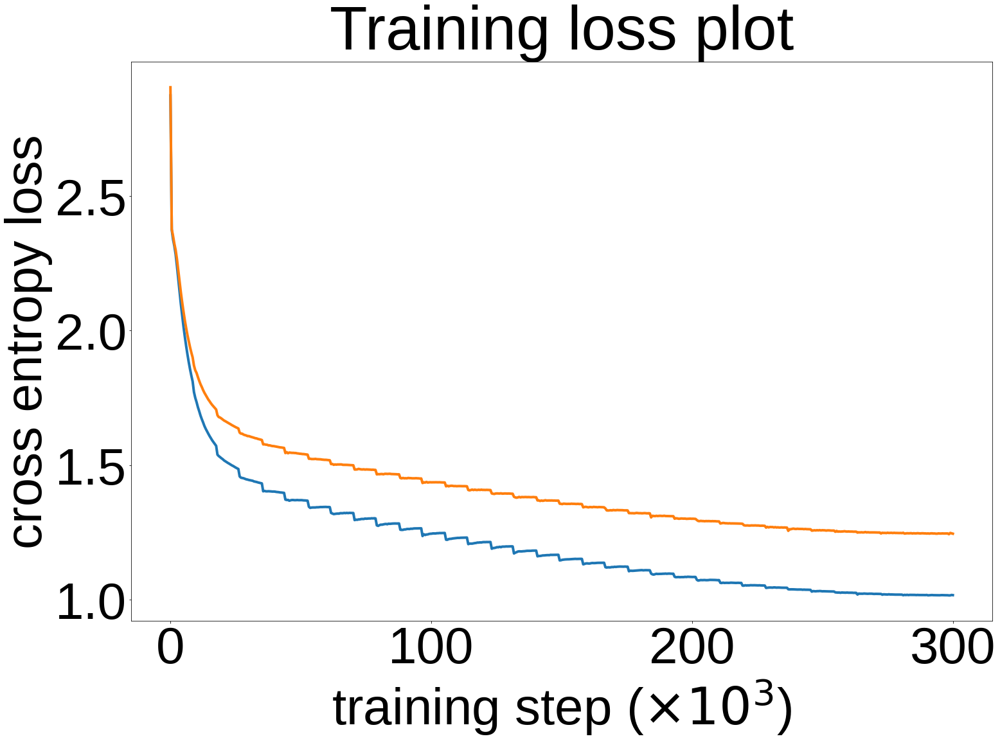

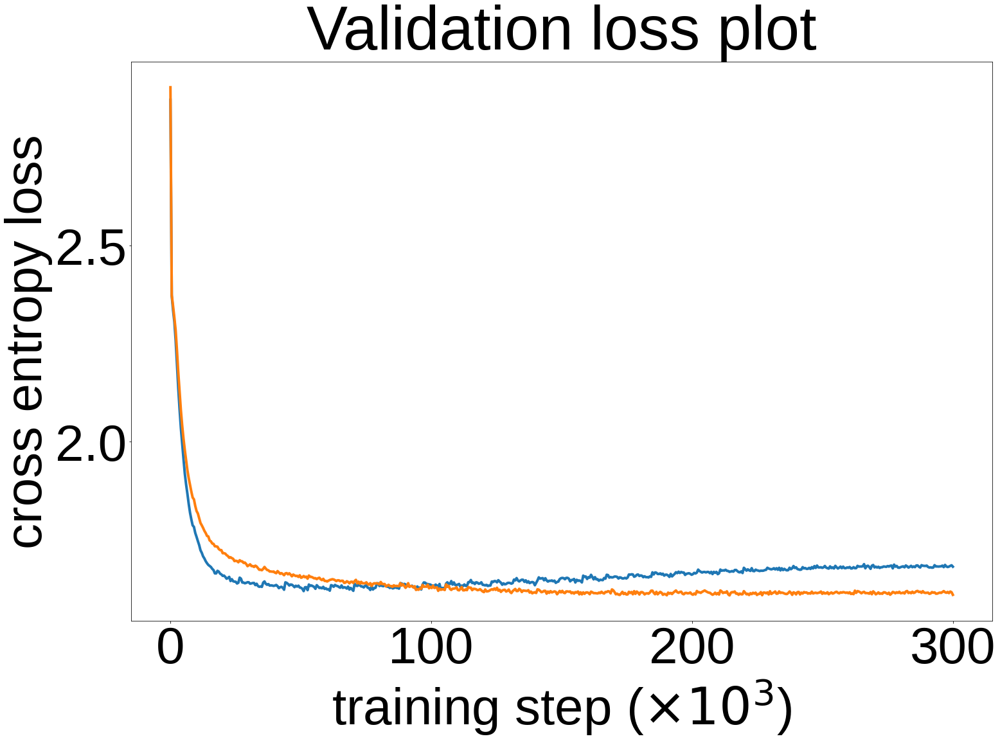

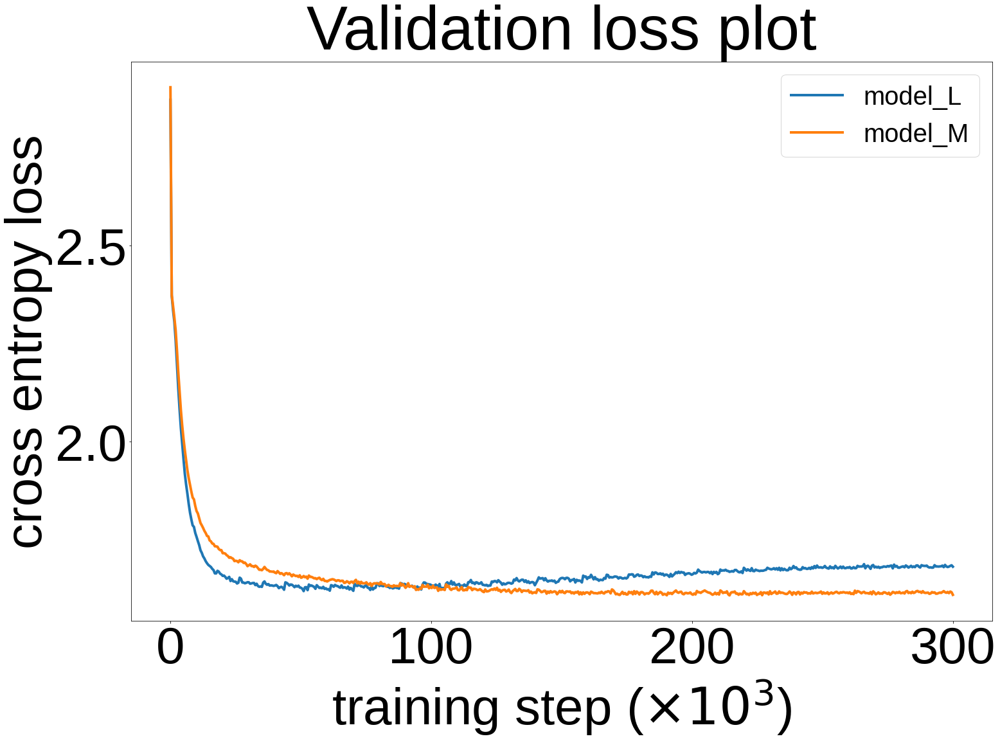

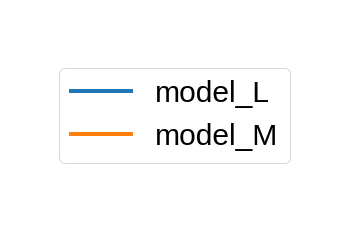

In [27]:
# plot the training loss

plt.figure(figsize=(24, 16), facecolor=(1, 1, 1))
x_axis = np.linspace(0, 300, 600)
plt.plot(x_axis, model_L_training_loss, label='model_L')
plt.plot(x_axis, model_M_training_loss, label='model_M')
plt.xlabel('training step ($\\times 10^{3}$)')
plt.ylabel('cross entropy loss')
plt.title('Training loss plot')
# plt.legend(fontsize=30, loc='upper right')
plt.savefig('model_evaluation/training_loss_different_models_300K.png', bbox_inches='tight')
plt.show()

# plot the validation loss
plt.figure(figsize=(24, 16), facecolor=(1, 1, 1))
x_axis = np.linspace(0, 300, 600)
plt.plot(x_axis, model_L_validation_loss, label='model_L')
plt.plot(x_axis, model_M_validation_loss, label='model_M')
plt.xlabel('training step ($\\times 10^{3}$)')
plt.ylabel('cross entropy loss')
plt.title('Validation loss plot')
# plt.legend(fontsize=30, loc='upper right')
plt.savefig('model_evaluation/validation_loss_different_models_300K.png', bbox_inches='tight')
plt.show()

# plot the validation loss
plt.figure(figsize=(24, 16), facecolor=(1, 1, 1))
x_axis = np.linspace(0, 300, 600)
plt.plot(x_axis, model_L_validation_loss, label='model_L')
plt.plot(x_axis, model_M_validation_loss, label='model_M')
plt.xlabel('training step ($\\times 10^{3}$)')
plt.ylabel('cross entropy loss')
plt.title('Validation loss plot')
legend = plt.legend(fontsize=40, loc='upper right')

# Create a new figure for the legend
legend_figure = plt.figure(figsize=(6, 4), facecolor=(1, 1, 1))
ax = legend_figure.add_subplot(111)
ax.axis('off')

# Draw the legend onto the new figure
legend_figure.legend(handles=legend.legendHandles, labels=[t.get_text() for t in legend.texts], loc='center', fontsize=30)

# Save the legend figure
legend_figure.savefig('model_evaluation/model_selection_300K_legend.png', bbox_inches='tight')

# Show the original plot
plt.show()

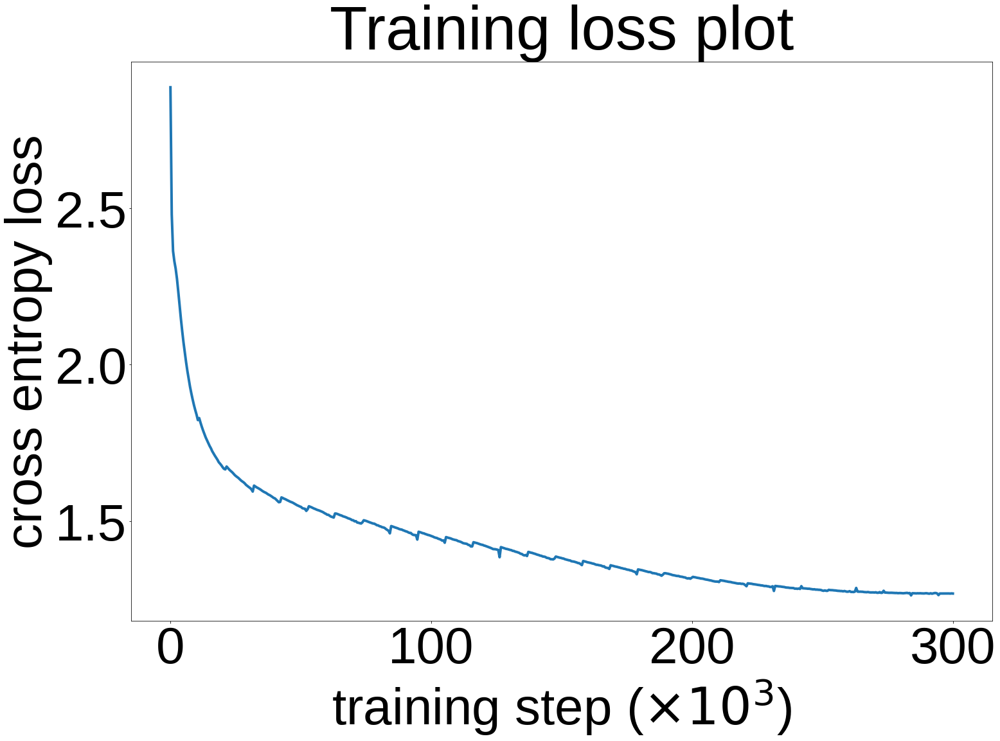

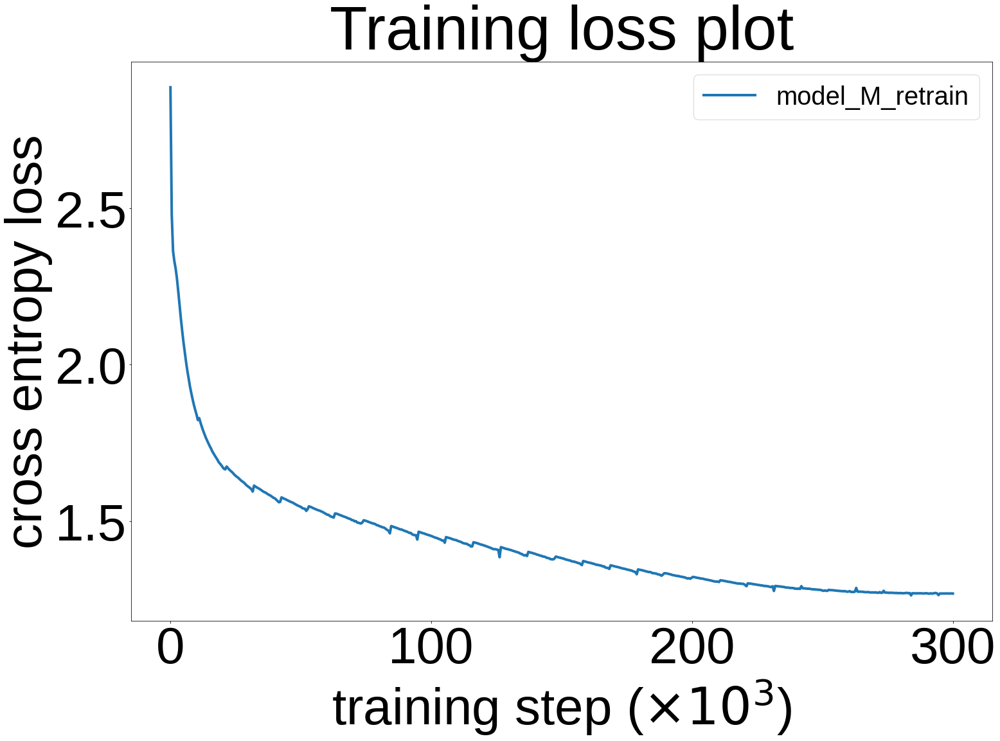

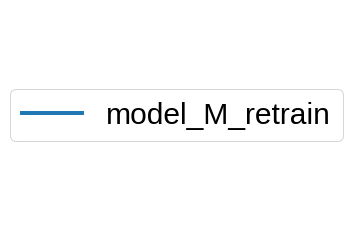

In [31]:
plt.figure(figsize=(24, 16), facecolor=(1, 1, 1))
x_axis = np.linspace(0, 300, 600)
plt.plot(x_axis, model_M_training_loss_retrain, label='model_M_retrain')
plt.xlabel('training step ($\\times 10^{3}$)')
plt.ylabel('cross entropy loss')
plt.title('Training loss plot')
# plt.legend(fontsize=30, loc='upper right')
plt.savefig('model_evaluation/training_loss_model_M_retrain.png', bbox_inches='tight')
plt.show()


plt.figure(figsize=(24, 16), facecolor=(1, 1, 1))
x_axis = np.linspace(0, 300, 600)
plt.plot(x_axis, model_M_training_loss_retrain, label='model_M_retrain')
plt.xlabel('training step ($\\times 10^{3}$)')
plt.ylabel('cross entropy loss')
plt.title('Training loss plot')
legend = plt.legend(fontsize=40, loc='upper right')
# Create a new figure for the legend
legend_figure = plt.figure(figsize=(6, 4), facecolor=(1, 1, 1))
ax = legend_figure.add_subplot(111)
ax.axis('off')
# Draw the legend onto the new figure
legend_figure.legend(handles=legend.legendHandles, labels=[t.get_text() for t in legend.texts], loc='center', fontsize=30)
# Save the legend figure
legend_figure.savefig('model_evaluation/model_selection_model_M_retrain_legend.png', bbox_inches='tight')
# Show the original plot
plt.show()

# Task 10: Database statistics

In [3]:
import matplotlib.pyplot as plt
import numpy as np
import os


beta_strand_data = {}
# create subdictionary for antiparallel and parallel
beta_strand_data['antiparallel'] = {}
beta_strand_data['parallel'] = {}
# create subdictionary of subdictionary for each length, string 3-20 and 20more
for i in range(3, 21):
    beta_strand_data['antiparallel'][str(i)] = {}
    beta_strand_data['parallel'][str(i)] = {}
beta_strand_data['antiparallel']['20more'] = {}
beta_strand_data['parallel']['20more'] = {}

# 1. load the stored data
total_data_stored = 0
for type in ['antiparallel', 'parallel']:
    length_list = os.listdir("AF2_beta_strand_database/" + type)
    length_list.sort()
    for length in length_list:
        num_load = 0
        # get all subfolders
        length_subfolders = os.listdir("AF2_beta_strand_database/" + type + "/" + length)
        for subfolder in length_subfolders:
            # load .npy file
            data = np.load("AF2_beta_strand_database/" + type + "/" + length + "/" + subfolder, allow_pickle=True)
            data = data.tolist()
            # convert to dictionary
            length_name = length.split('_')[1]
            # data is a dictionary
            # add data to beta_strand_data
            for key in data:
                beta_strand_data[type][length_name][key] = data[key]
                total_data_stored += len(data[key])
                num_load += len(data[key])
        # print number of data loaded in this length
        print('number of ' + type + ' beta strands with length ' + length_name + ' loaded: ' + str(num_load))
print("Total data stored: " + str(total_data_stored))

# each data in AF2_beta_strand_v2: # target, comp, anti/parallel

# loop through each data in AF2_beta_strand_v2 and record useful information
top_20_counts = {} # this record the top 20 counts of each type of each length of beta strands
top_20_counts['antiparallel'] = {}
top_20_counts['parallel'] = {}
counts = {} # this record the counts of each type of each length of beta strands
lengths = {} # this record the lengths of each type of each length of beta strands
ave_comp_per_key_each_length = {} # this record the average complementarity of each type of each length of beta strands
ave_comp_per_key_each_length['antiparallel'] = {}
ave_comp_per_key_each_length['parallel'] = {}
antiparallel = 0
parallel = 0
total_num = 0
total_counts = 0
total_keys = 0
for type in beta_strand_data:
    for length in beta_strand_data[type]:
        num_comp = 0
        current_counts = []
        for key in beta_strand_data[type][length]:
            num_comp += len(beta_strand_data[type][length][key])
            for comp in beta_strand_data[type][length][key]:
                # count number of beta strands
                total_num += 1
                total_counts += beta_strand_data[type][length][key][comp]
                # count number of antiparallel beta strands
                if type == 'antiparallel':
                    antiparallel += 1
                # count number of parallel beta strands
                else:
                    parallel += 1
                # record length of beta strands
                if len(key) in lengths:
                    lengths[len(key)] += 1
                else:
                    lengths[len(key)] = 1
                # record counts of beta strands
                if len(key) in counts:
                    counts[len(key)] += beta_strand_data[type][length][key][comp]
                else:
                    counts[len(key)] = beta_strand_data[type][length][key][comp]
                # record current counts
                current_counts.append(beta_strand_data[type][length][key][comp])
        # record average number of comp per key
        ave_comp_per_key_each_length[type][length] = num_comp / len(beta_strand_data[type][length])
        total_keys += len(beta_strand_data[type][length])
        # get top 20 counts for each length
        current_counts.sort(reverse=True)
        top_20_counts[type][length] = current_counts[:20]
        print('number of ' + type + ' beta strands with length ' + length + ' sorted: ' + str(num_comp))

# print results
print('total number of unique beta strands: ', total_num)
print('total number of beta strands: ', total_counts)
print('total number of keys: ', total_keys)
print('antiparallel: ', antiparallel)
print('parallel: ', parallel)
lengths_sorted = sorted(lengths.items(), key=lambda x: x[0])
print('lengths: ', lengths_sorted)

number of antiparallel beta strands with length 10 loaded: 17762525
number of antiparallel beta strands with length 11 loaded: 9551150
number of antiparallel beta strands with length 12 loaded: 7446947
number of antiparallel beta strands with length 13 loaded: 4084020
number of antiparallel beta strands with length 14 loaded: 3126426
number of antiparallel beta strands with length 15 loaded: 1760403
number of antiparallel beta strands with length 16 loaded: 1316583
number of antiparallel beta strands with length 17 loaded: 956653
number of antiparallel beta strands with length 18 loaded: 779144
number of antiparallel beta strands with length 19 loaded: 480305
number of antiparallel beta strands with length 20 loaded: 513854
number of antiparallel beta strands with length 20more loaded: 1255586
number of antiparallel beta strands with length 3 loaded: 16995769
number of antiparallel beta strands with length 4 loaded: 52107082
number of antiparallel beta strands with length 5 loaded: 686

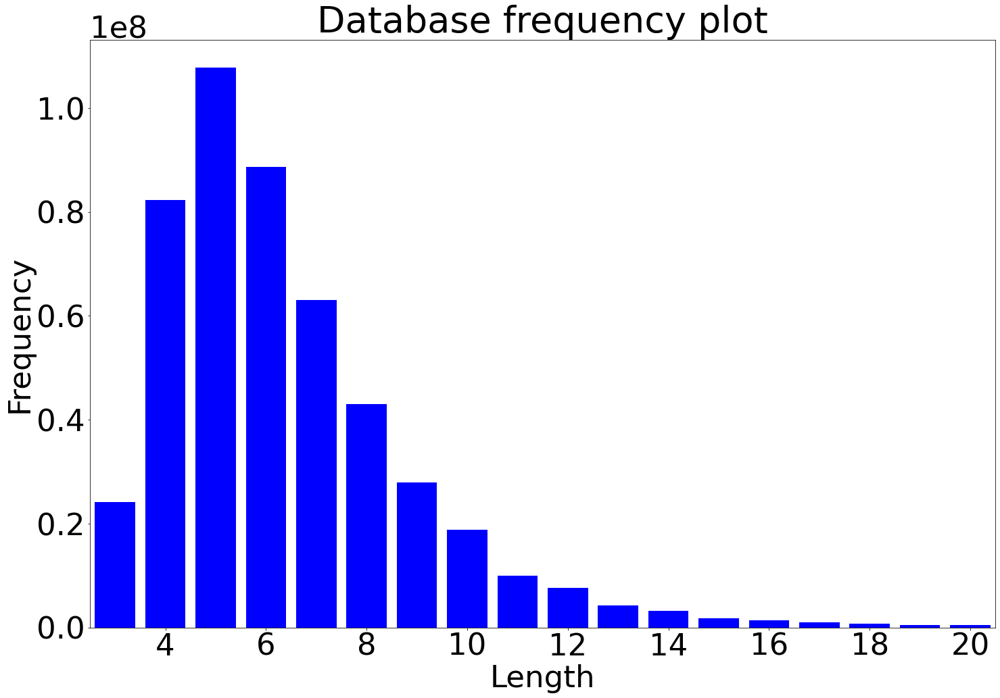

In [13]:
# get frequency of lengths
# plot the bar chart of frequency of lengths
plt.figure(figsize=(24, 16), facecolor=(1, 1, 1))
plt.rcParams.update({'font.size': 45})
plt.bar(list(lengths.keys()), list(lengths.values()), color='blue')
plt.xlim(2.5, 20.5)
plt.xlabel('Length')
plt.ylabel('Frequency')
plt.title('Database frequency plot')
# plt.savefig('AF2_beta_strand_database_stats/basic_statistics/AF2_beta_strand_length_frequency.png', bbox_inches='tight')
plt.show()

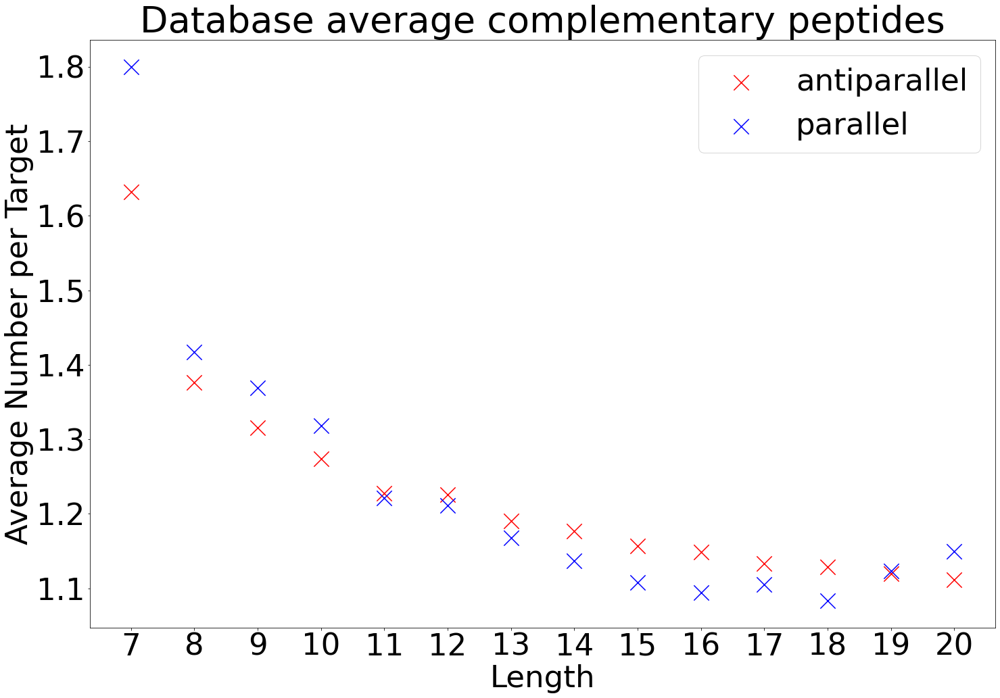

In [11]:
# plot the scatterplot of average number of comp per key vs length (7-20 and 20more)
plt.figure(figsize=(24, 16), facecolor=(1, 1, 1))
plt.rcParams.update({'font.size': 45})
# scatter for 7-20, antiparallel in red and parallel in blue
for type in ['antiparallel', 'parallel']:
	for length in ave_comp_per_key_each_length[type]:
		if length != '20more' and int(length) >= 7:
			if type == 'antiparallel':
				plt.scatter(int(length), ave_comp_per_key_each_length[type][length], color='red', s=500, label='antiparallel', marker='x')
			else:
				plt.scatter(int(length), ave_comp_per_key_each_length[type][length], color='blue', s=500, label='parallel', marker='x')
plt.xlabel('Length')
plt.ylabel('Average Number per Target')
plt.xticks(np.arange(7, 21, 1))
# remove redundant labels
handles, labels = plt.gca().get_legend_handles_labels()
by_label = dict(zip(labels, handles))
plt.legend(by_label.values(), by_label.keys())
plt.title('Database average complementary peptides')
plt.savefig('AF2_beta_strand_database_stats/basic_statistics/AF2_beta_strand_ave_comp_per_key_scatter.png', bbox_inches='tight')
plt.show()

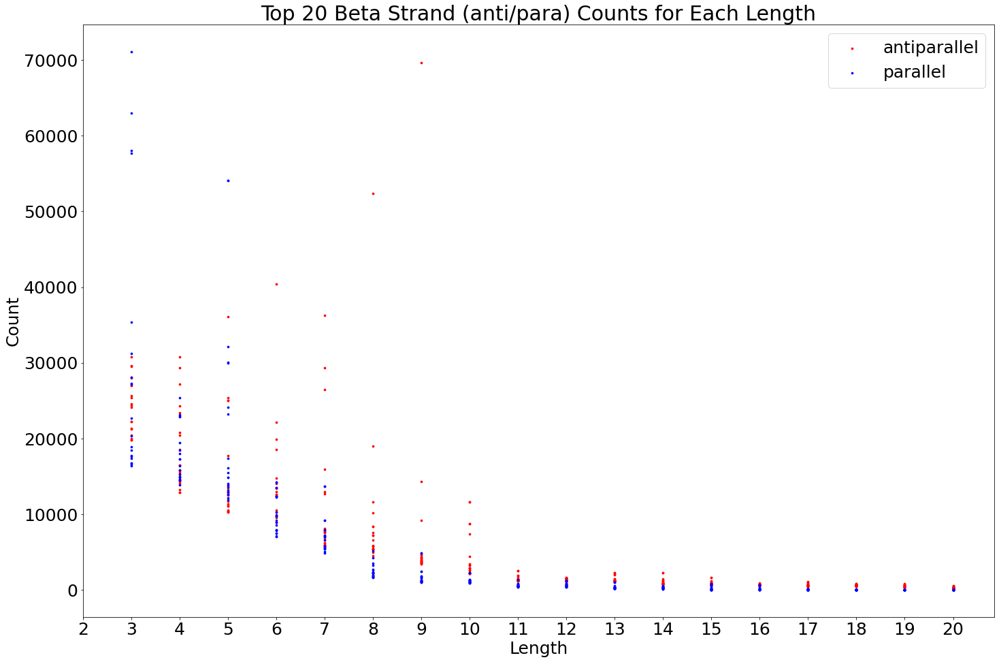

In [60]:
# plot the scatterplot of top 20 beta strand counts for each length less than or equal to 20
plt.figure(figsize=(24, 16), facecolor=(1, 1, 1))
plt.rcParams.update({'font.size': 25})
# scatter for 3-20, antiparallel in red and parallel in blue
for type in ['antiparallel', 'parallel']:
	for length in top_20_counts[type]:
		if length != '20more':
			if type == 'antiparallel':
				plt.scatter([int(length)] * len(top_20_counts[type][length]), top_20_counts[type][length], color='red', s=7, label='antiparallel')
			else:
				plt.scatter([int(length)] * len(top_20_counts[type][length]), top_20_counts[type][length], color='blue', s=7, label='parallel')
plt.xlabel('Length')
plt.ylabel('Count')
plt.xticks(np.arange(2, 21, 1))
# remove redundant labels
handles, labels = plt.gca().get_legend_handles_labels()
by_label = dict(zip(labels, handles))
plt.legend(by_label.values(), by_label.keys())
plt.title('Top 20 Beta Strand (anti/para) Counts for Each Length')
# plt.savefig('AF2_beta_strand_database_stats/basic_statistics/AF2_beta_strand_top_20_count_scatter.png', bbox_inches='tight')
plt.show()

# Task X: Cross check with Cascade paper

#### Window division

In [ ]:
receptor_sequence = "MDVFMKGLSKAKEGVVAAAEKTKQGVAEAAGKTKEGVLYVGSKTKEGVVHGVATVAEKTKEQVTNVGGAVVTGVTAVAQKTVEGAGSIAAATGFVKKDQLGKNEEGAPQEGILEDMPVDPD"
windown_size = 8

sequences_divided = window_divide(receptor_sequence, windown_size)
len(sequences_divided)

#### Target of selection

In [ ]:
task_target = 'EQVTNVGG'
model_use = model_standard
prediction_length = 8

cascade_peptide1 = 'QYSVLIDA'
cascade_peptide_list = [cascade_peptide1] * len(sequences_divided)

In [ ]:
num_minibatch = 50
peptide_eval = evaluate_minibatch(model_use, sequences_divided, cascade_peptide_list, amino_dict, prediction_length + 2, device, num_minibatch=num_minibatch)
print("minibatch evaluatiion number: \n", len(peptide_eval))
print("minibatch evaluatiion: \n", peptide_eval)

# Adobe Illustrator

#### train and validation losses

In [16]:
import numpy as np
import matplotlib.pyplot as plt

# load training loss array
model_base_training_loss = np.loadtxt('model_selection/model_base/model_training/model_base_training_loss.csv', delimiter=',')
model_A_training_loss = np.loadtxt('model_selection/model_A/model_training/model_A_training_loss.csv', delimiter=',')
model_B_training_loss = np.loadtxt('model_selection/model_B/model_training/model_B_training_loss.csv', delimiter=',')
model_C_training_loss = np.loadtxt('model_selection/model_C/model_training/model_C_training_loss.csv', delimiter=',')
model_D_training_loss = np.loadtxt('model_selection/model_D/model_training/model_D_training_loss.csv', delimiter=',')
model_E_training_loss = np.loadtxt('model_selection/model_E/model_training/model_E_training_loss.csv', delimiter=',')
model_F_training_loss = np.loadtxt('model_selection/model_F/model_training/model_F_training_loss.csv', delimiter=',')
model_G_training_loss = np.loadtxt('model_selection/model_G/model_training/model_G_training_loss.csv', delimiter=',')
model_H_training_loss = np.loadtxt('model_selection/model_H/model_training/model_H_training_loss.csv', delimiter=',')
model_I_training_loss = np.loadtxt('model_selection/model_I/model_training/model_I_training_loss.csv', delimiter=',')
model_J_training_loss = np.loadtxt('model_selection/model_J/model_training/model_J_training_loss.csv', delimiter=',')
model_K_training_loss = np.loadtxt('model_selection/model_K/model_training/model_K_training_loss.csv', delimiter=',')
model_L_training_loss = np.loadtxt('model_selection/model_L/model_training/model_L_training_loss.csv', delimiter=',')
model_M_training_loss = np.loadtxt('model_selection/model_M/model_training/model_M_training_loss.csv', delimiter=',')

# load validation loss array  
model_base_validation_loss = np.loadtxt('model_selection/model_base/model_training/model_base_validation_score_loss.csv', delimiter=',')
model_A_validation_loss = np.loadtxt('model_selection/model_A/model_training/model_A_validation_score_loss.csv', delimiter=',')
model_B_validation_loss = np.loadtxt('model_selection/model_B/model_training/model_B_validation_score_loss.csv', delimiter=',')
model_C_validation_loss = np.loadtxt('model_selection/model_C/model_training/model_C_validation_score_loss.csv', delimiter=',')
model_D_validation_loss = np.loadtxt('model_selection/model_D/model_training/model_D_validation_score_loss.csv', delimiter=',')
model_E_validation_loss = np.loadtxt('model_selection/model_E/model_training/model_E_validation_score_loss.csv', delimiter=',')
model_F_validation_loss = np.loadtxt('model_selection/model_F/model_training/model_F_validation_score_loss.csv', delimiter=',')
model_G_validation_loss = np.loadtxt('model_selection/model_G/model_training/model_G_validation_score_loss.csv', delimiter=',')
model_H_validation_loss = np.loadtxt('model_selection/model_H/model_training/model_H_validation_score_loss.csv', delimiter=',')
model_I_validation_loss = np.loadtxt('model_selection/model_I/model_training/model_I_validation_score_loss.csv', delimiter=',')
model_J_validation_loss = np.loadtxt('model_selection/model_J/model_training/model_J_validation_score_loss.csv', delimiter=',')
model_K_validation_loss = np.loadtxt('model_selection/model_K/model_training/model_K_validation_score_loss.csv', delimiter=',')
model_L_validation_loss = np.loadtxt('model_selection/model_L/model_training/model_L_validation_score_loss.csv', delimiter=',')
model_M_validation_loss = np.loadtxt('model_selection/model_M/model_training/model_M_validation_score_loss.csv', delimiter=',')

# retrain training loss
model_M_training_loss_retrain = np.loadtxt('model_M/model_M_training_loss.csv', delimiter=',')

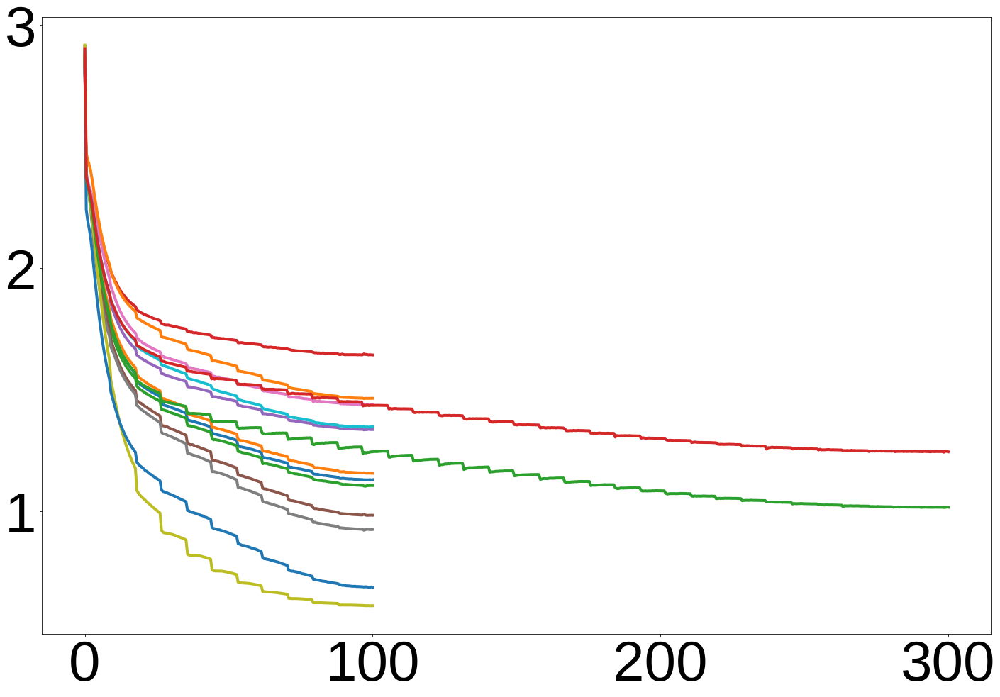

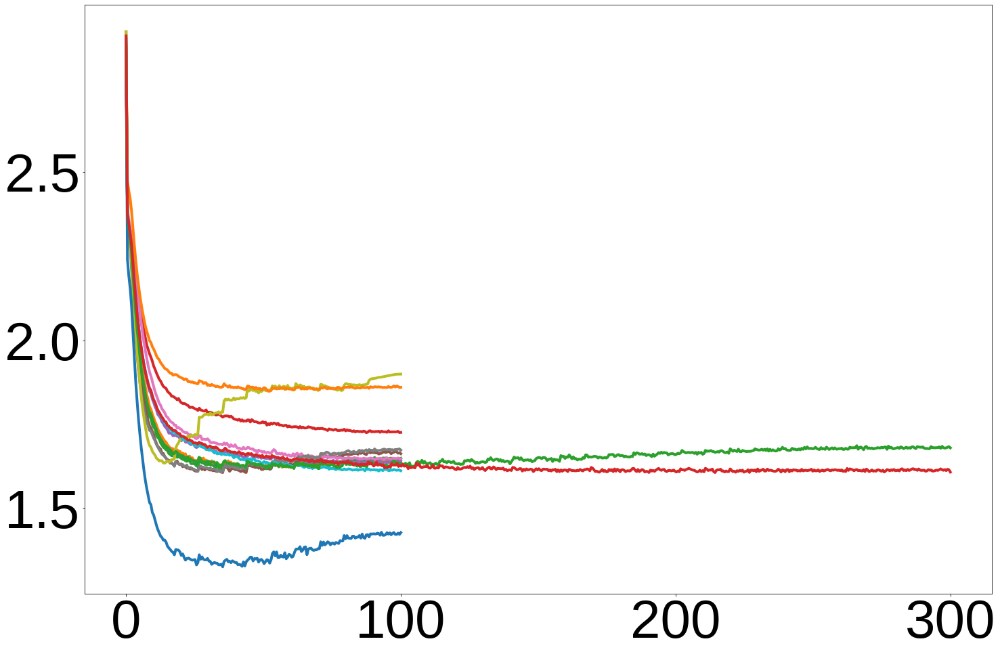

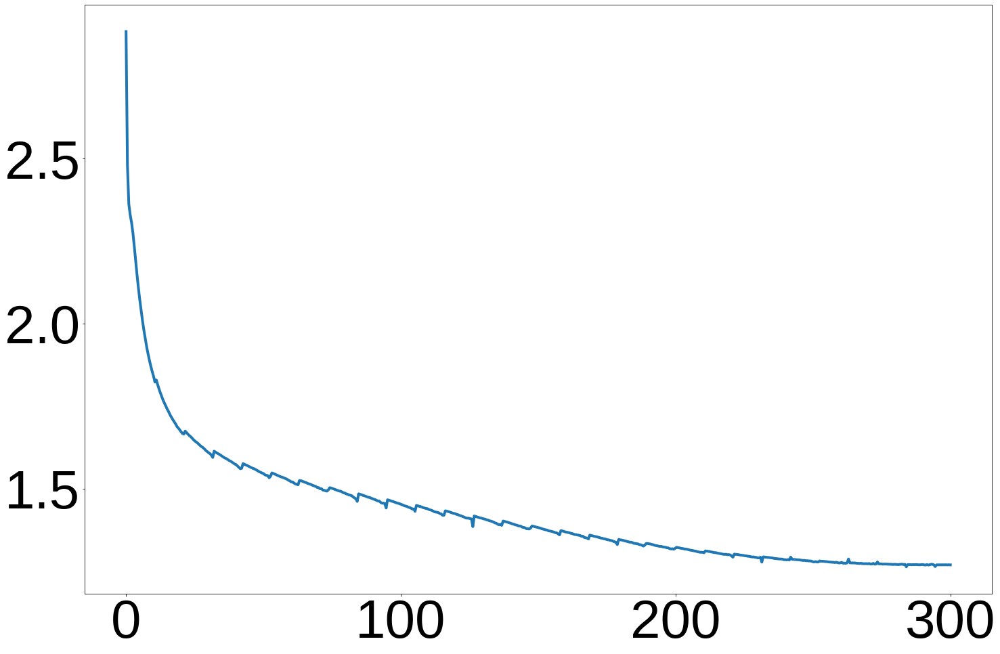

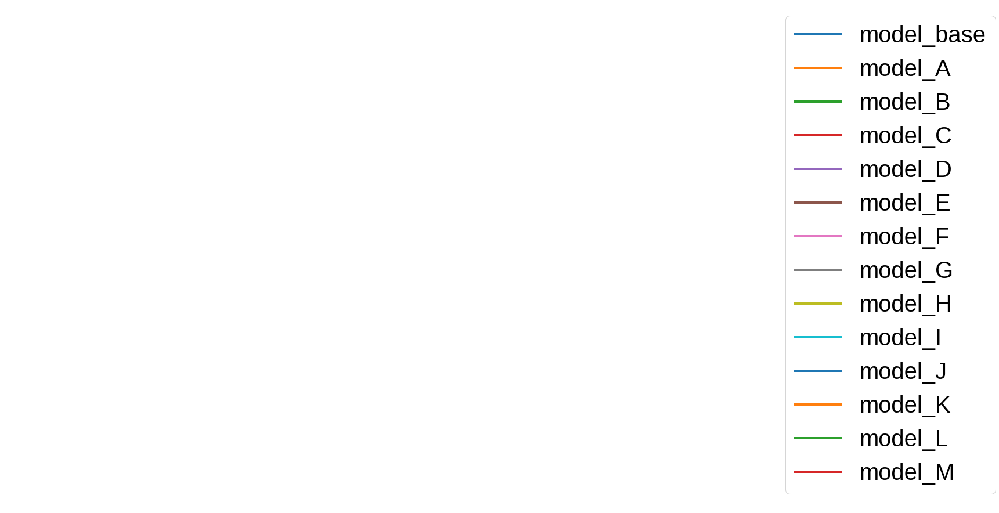

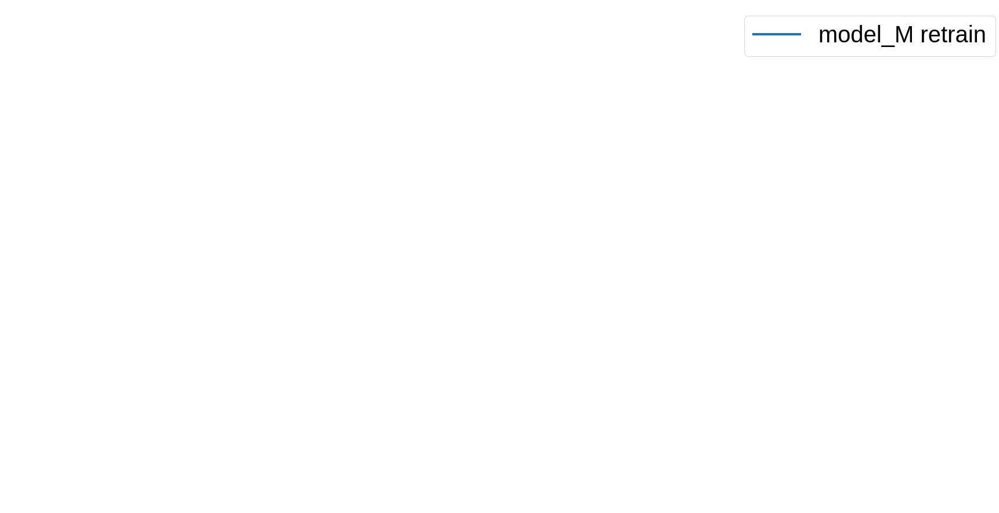

In [17]:
import numpy as np
import matplotlib.pyplot as plt

plt.rcParams.update({
    'font.size': 80,
    'font.family': 'Liberation Sans',
    'lines.linewidth': 4,
})

# Define a function to plot training or validation loss on the same axis
def plot_losses_combined(losses, labels, title, filename):
    plt.figure(figsize=(24, 16), facecolor=(1, 1, 1))
    
    for i in range(len(labels)):
        x_axis = np.linspace(0, len(losses[i])*(0.5), len(losses[i]))
        plt.plot(x_axis, losses[i], linestyle='-', label=f"{labels[i]}")
    
    # plt.xlabel('training step ($\\times 10^{3}$)')
    # plt.ylabel('cross entropy loss')
    # plt.title(title)
    # plt.legend(fontsize=40, bbox_to_anchor=(1.29, 1), loc='upper right')
    plt.savefig(filename, bbox_inches='tight')
    plt.show()
    
def save_legend(labels, filename):
    fig, ax = plt.subplots(figsize=(24, 16))
    lines = []
    for i in range(len(labels)):
        line, = ax.plot([0], linestyle='-', label=f"{labels[i]}")
        lines.append(line)
    legend = ax.legend(handles=lines, fontsize=40, bbox_to_anchor=(1.29, 1), loc='upper right')
    ax.axis('off')
    fig.savefig(filename, bbox_inches='tight')
    plt.show()

# Combine the training and validation losses for each model
training_losses = [model_base_training_loss, model_A_training_loss, model_B_training_loss, model_C_training_loss,
                   model_D_training_loss, model_E_training_loss, model_F_training_loss, model_G_training_loss,
                   model_H_training_loss, model_I_training_loss, model_J_training_loss, model_K_training_loss,
                   model_L_training_loss, model_M_training_loss]

validation_losses = [model_base_validation_loss, model_A_validation_loss, model_B_validation_loss, model_C_validation_loss,
                     model_D_validation_loss, model_E_validation_loss, model_F_validation_loss, model_G_validation_loss,
                     model_H_validation_loss, model_I_validation_loss, model_J_validation_loss, model_K_validation_loss,
                     model_L_validation_loss, model_M_validation_loss]

training_losses_retrain = [model_M_training_loss_retrain]

# Define labels for each model
labels = ['model_base', 'model_A', 'model_B', 'model_C', 'model_D', 'model_E', 'model_F', 'model_G', 'model_H', 'model_I', 'model_J', 'model_K', 'model_L', 'model_M']
labels_retrain = ['model_M retrain']

# Plot the combined training losses for all models
plot_losses_combined(training_losses, labels, 'Training loss plot (Combined)', 'model_evaluation/adobe_plots/training_losses_all_models.png')
# Plot the combined validation losses for all models
plot_losses_combined(validation_losses, labels, 'Validation loss plot (Combined)', 'model_evaluation/adobe_plots/validation_losses_all_models.png')
# Plot the combined training losses for retrain model M
plot_losses_combined(training_losses_retrain, labels_retrain, 'Training loss plot (retrain)', 'model_evaluation/adobe_plots/training_losses_retrain_M.png')

# Save the legend separately
save_legend(labels, 'model_evaluation/adobe_plots/legend_all_models.png')
# Save the legend separately
save_legend(labels_retrain, 'model_evaluation/adobe_plots/legend_retrain_M.png')

## Embedding analysis

In [3]:
import numpy as np
import requests
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.spatial.distance import pdist, squareform
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.preprocessing import StandardScaler
from sklearn.manifold import TSNE
from collections import OrderedDict
from scipy.stats import pearsonr

def extract_encoder_embedding(model_use):
    encoder_amino_embedding = model_use.encoder.embedding
    encoder_amino_embedding_weight = encoder_amino_embedding.weight.data.cpu().numpy()
    return encoder_amino_embedding_weight

def standardize_embedding_weights(encoder_amino_embedding_weight):
    encoder_amino_embedding_weight_standardized = StandardScaler().fit_transform(encoder_amino_embedding_weight)
    return encoder_amino_embedding_weight_standardized

def plot_embeddings(M_reduced, amino_dict, amino_list, amino_property = None, remove_amino=[], text_bias = 0.05, property_box_shown =True):

    from collections import OrderedDict

    for amino in amino_list:
        # if in remove_words, remove the word from the plot
        if amino in remove_amino:
            continue

        if amino_property != None:
            size, (type, color) = amino_property[amino]
            if (type, color) == ('x', 'blue'):
                label = 'aliphatic'
            elif (type, color) == ('o', 'green'):
                label = 'aromatic'
            elif (type, color) == ('s', 'red'):
                label = 'positive'
            elif (type, color) == ('x', 'red'):
                label = 'negative'
            elif (type, color) == ('o', 'purple'):
                label = 'polar and uncharged'
            else:
                raise ValueError('Unknown amino property')
    
            x, y = M_reduced[amino_dict[amino]]
            # create scatter plot contain 2 labels in 2 legends
            plt.scatter(x, y, marker=type, color=color, s=size, label=label)
            plt.text(x+text_bias*5, y+text_bias-4, amino, fontsize=50)
            if property_box_shown == True:
                plt.legend()

        else:
            x, y = M_reduced[amino_dict[amino]]
            plt.scatter(x, y, marker='x', color='red', s=360)
            plt.text(x+text_bias*2.5, y+text_bias-2, amino, fontsize=50)

    if amino_property != None and property_box_shown == True:
        # combine same labels
        handles, labels = plt.gca().get_legend_handles_labels()
        by_label = OrderedDict(zip(labels, handles))
        additional_labels = ['Small (<120 Da)', 'Medium (120-150 Da)', 'Large (>150 Da)']
        additional_handles = [plt.plot([], [], color="black", marker = 'o', ms=i*12, ls='')[0] for i in range(2, len(additional_labels)+3)]

        plt.legend(list(by_label.values()) + additional_handles, list(by_label.keys())+additional_labels, bbox_to_anchor =(0.99, 1), title='Amino acid property')
    
    # move the legend outside of the plot

def perform_tsne(encoder_amino_embedding_weight_standardized):
    tsne = TSNE(n_components=2, perplexity=3, n_iter=1000, random_state=9)
    encoder_amino_embedding_weight_tsne = tsne.fit_transform(encoder_amino_embedding_weight_standardized)
    return encoder_amino_embedding_weight_tsne

def load_blosum62():
    url = "https://ftp.ncbi.nih.gov/blast/matrices/BLOSUM62"
    response = requests.get(url)
    lines = response.text.strip().split('\n')

    # Remove comment lines
    lines = [line for line in lines if not line.startswith('#')]

    # Parse the matrix
    header = lines.pop(0).split()
    aa_list = [aa for aa in header if aa in amino_dict]  # Only use amino acids in dictionary
    blosum62 = pd.DataFrame(index=aa_list, columns=aa_list)
    for row_num, line in enumerate(lines):
        values = line.split()
        aa = values.pop(0)
        if aa not in aa_list:
            continue
        for i, v in enumerate(values):
            col_aa = header[i]
            if col_aa not in aa_list:
                continue
            blosum62.loc[aa, col_aa] = int(v)
    return blosum62

def calculate_cosine_similarity_matrix(amino_acid_embeddings):
    cosine_sim_matrix = cosine_similarity(amino_acid_embeddings)
    return cosine_sim_matrix

def calculate_pearsons_correlation(cosine_sim_normalized_flat, blosum62_normalized_flat):
    correlation, _ = pearsonr(cosine_sim_normalized_flat, blosum62_normalized_flat)
    return correlation

/rds/general/user/hz3519/home/anaconda3/envs/UROP_transformer/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/rds/general/user/hz3519/home/anaconda3/envs/UROP_transformer/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


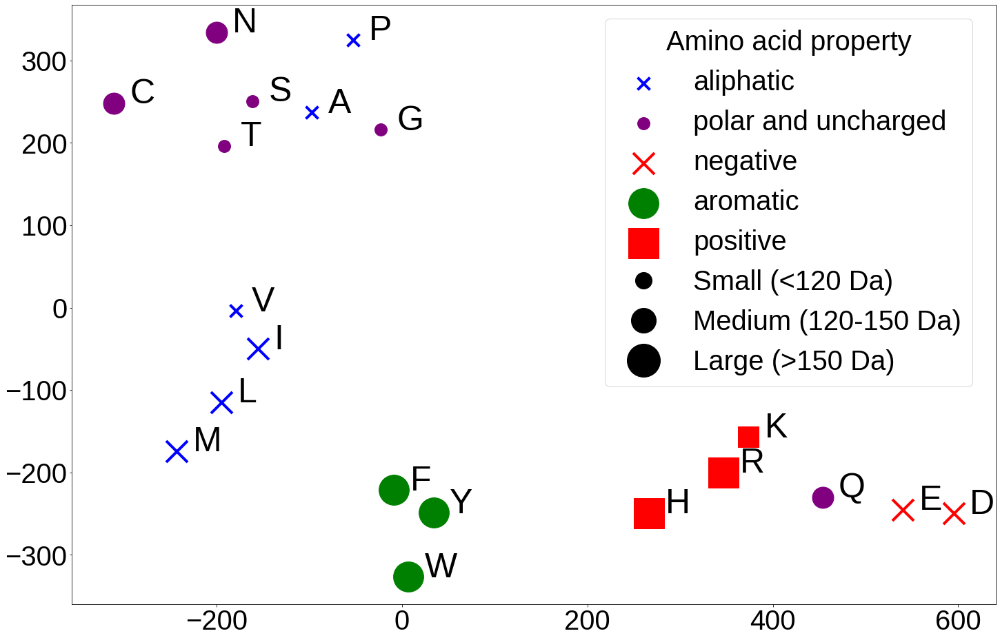

In [4]:
# Assuming you have already loaded the necessary libraries and defined the required variables like amino_dict, amino_letters, amino_property, etc.

# Load your model here
model_use = model_standard  # Replace with the code to load your model

# Extract encoder embedding
encoder_amino_embedding_weight = extract_encoder_embedding(model_use)

# Standardize the embedding weights
encoder_amino_embedding_weight_standardized = standardize_embedding_weights(encoder_amino_embedding_weight)

# Perform t-SNE on the input embedding weights
encoder_amino_embedding_weight_tsne = perform_tsne(encoder_amino_embedding_weight_standardized)

amino_letters = list(amino_dict.keys())
amino_letters_removal = ['<bos>', '<eos>', '<pad>', '<unk>']


text_bias = 3.5

plt.rcParams.update({
    'font.size': 40,
    'font.family': 'Liberation Sans',
    'lines.linewidth': 4,
})

size_scalar = 8
small_size = 40 * size_scalar
medium_size = 120 * size_scalar
large_size = 240 * size_scalar


# old grouping
# aliphatic = ('x', 'blue')
# sulfur = ('s', 'blue')
# aromatic = ('o', 'green')
# hydroxly = ('o', 'blue')
# amide = ('o', 'purple')
# positive = ('s', 'red')
# negative = ('x', 'red')
# unique = ('o', 'orange')

aliphatic = ('x', 'blue')
aromatic = ('o', 'green')
positive = ('s', 'red')
negative = ('x', 'red')
polar_uncharged = ('o', 'purple')

amino_property = {
	'A': (small_size, aliphatic),
	'C': (medium_size, polar_uncharged),
	'D': (medium_size, negative),
	'E': (medium_size, negative),
	'F': (large_size, aromatic),
	'G': (small_size, polar_uncharged),
	'H': (large_size, positive),
	'I': (medium_size, aliphatic),
	'K': (medium_size, positive),
	'L': (medium_size, aliphatic),
	'M': (medium_size, aliphatic),
	'N': (medium_size, polar_uncharged),
	'P': (small_size, aliphatic),
	'Q': (medium_size, polar_uncharged),
	'R': (large_size, positive),
	'S': (small_size, polar_uncharged),
	'T': (small_size, polar_uncharged),
	'V': (small_size, aliphatic),
	'W': (large_size, aromatic),
	'Y': (large_size, aromatic)
}


# Plot embeddings
plt.figure(figsize=(24, 16), facecolor=(1, 1, 1))
plot_embeddings(encoder_amino_embedding_weight_tsne, amino_dict, amino_letters, remove_amino=amino_letters_removal, amino_property=amino_property, text_bias=text_bias)
# plt.xlabel("t-SNE1")
# plt.ylabel("t-SNE2")
# plt.title("Input embedding")
plt.savefig('model_evaluation/adobe_plots/encoder_input_embedding_TSNE.png', bbox_inches='tight')
plt.show()

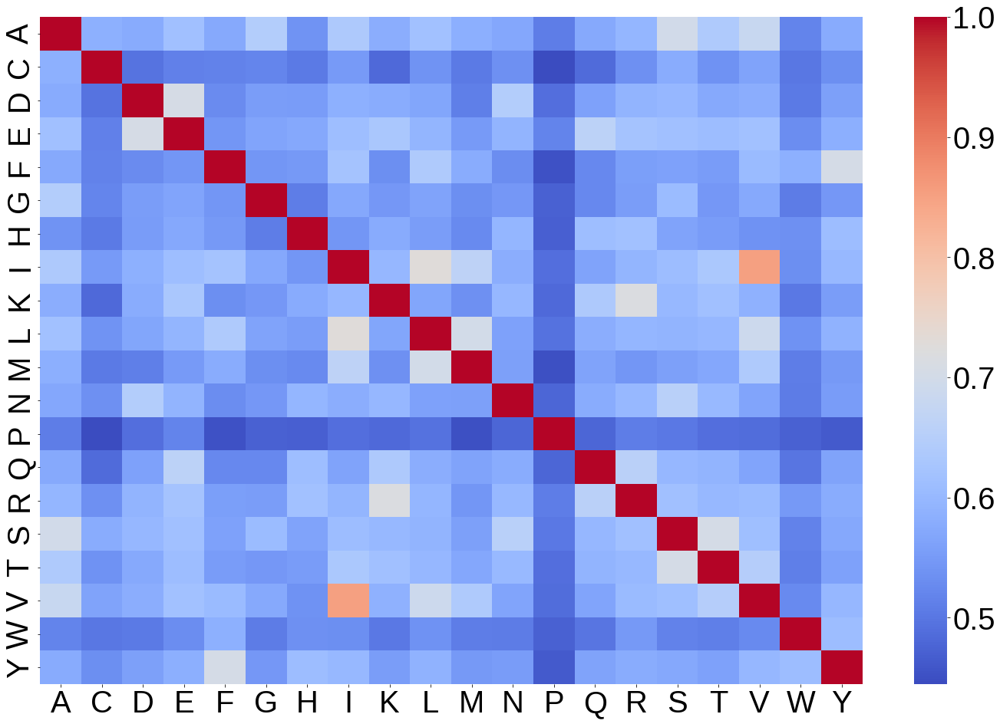

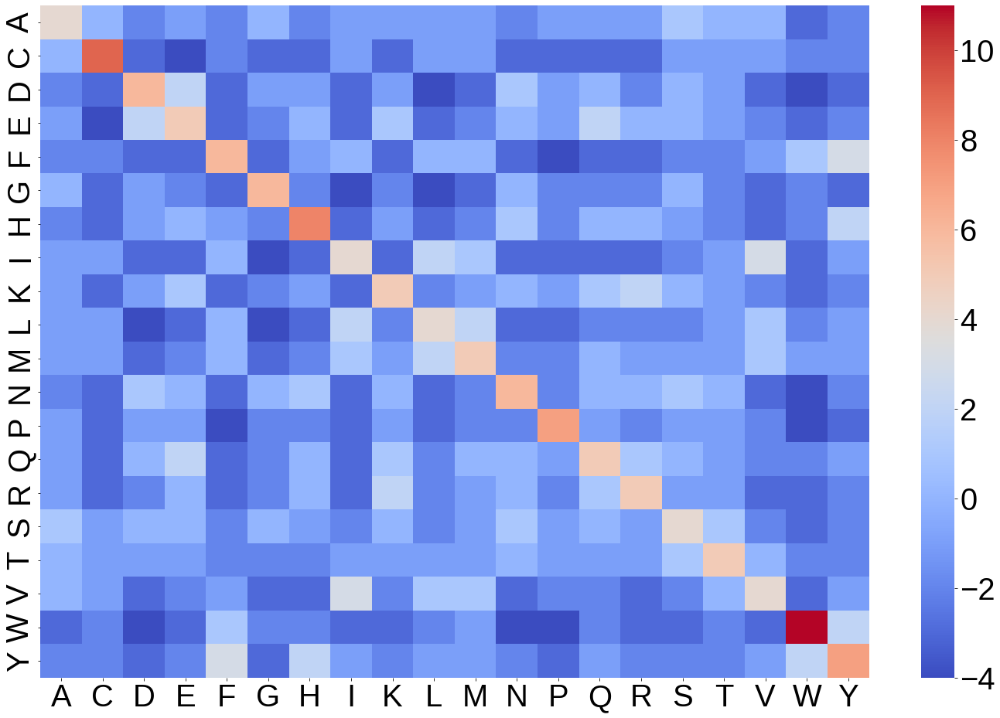

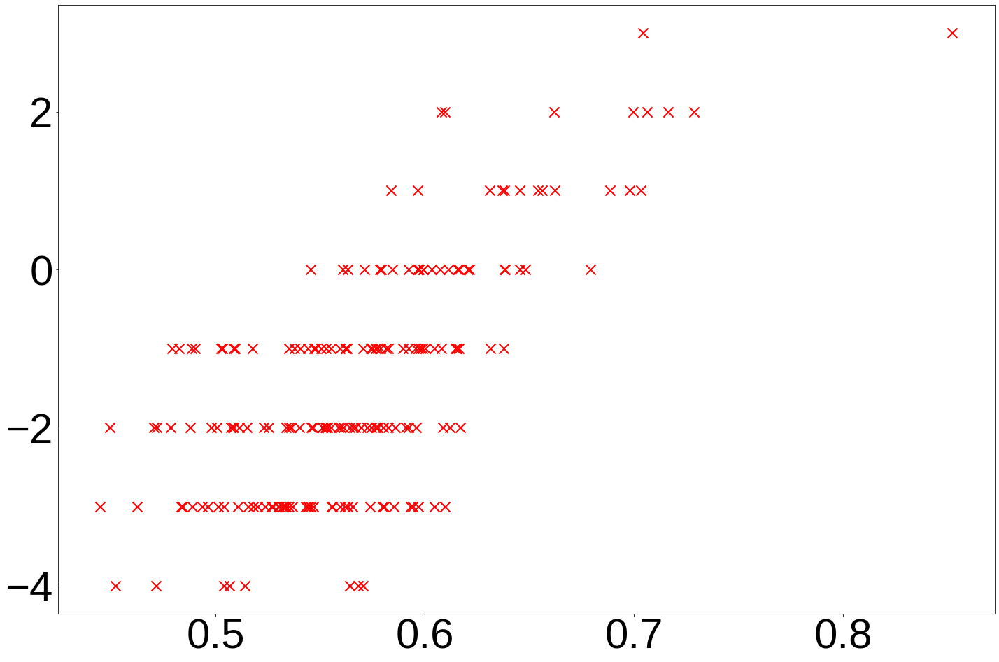

Pearson's correlation: 0.701


In [5]:
plt.rcParams.update({
    'font.size': 40,
    'font.family': 'Liberation Sans',
    'lines.linewidth': 4,
})

# Extract only amino acid embeddings
amino_acids = list("ACDEFGHIKLMNPQRSTVWY")
amino_acid_indices = [amino_dict[aa] for aa in amino_acids]
amino_acid_embeddings = encoder_amino_embedding_weight[amino_acid_indices]

# Load BLOSUM62 matrix
blosum62 = load_blosum62()
# make the blosum62 matrix in the same order as the cosine_sim_matrix
blosum62 = blosum62.reindex(index=amino_acids, columns=amino_acids)

# Calculate cosine similarity matrix
cosine_sim_matrix = calculate_cosine_similarity_matrix(amino_acid_embeddings)

# Plot heatmaps
cosine_sim_matrix_df = pd.DataFrame(cosine_sim_matrix, index=amino_acids, columns=amino_acids)
# Plot heatmap for Cosine Similarity Matrix (Normalized)
plt.figure(figsize=(24, 16), facecolor=(1, 1, 1))
sns.heatmap(cosine_sim_matrix_df, annot=False, cmap="coolwarm")
# plt.title("Cosine Similarity Matrix")
plt.savefig('model_evaluation/adobe_plots/correlation_cosine_similarity_matrix.png', bbox_inches='tight')
plt.show()

# Plot heatmap for BLOSUM62 (Normalized)
plt.figure(figsize=(24, 16), facecolor=(1, 1, 1))
sns.heatmap(blosum62.astype(float), annot=False, cmap="coolwarm")
# plt.title("BLOSUM62 Matrix")
plt.savefig('model_evaluation/adobe_plots/correlation_BLOSUM62_matrix.png', bbox_inches='tight')
plt.show()

plt.rcParams.update({
    'font.size': 60,
    'font.family': 'Liberation Sans',
    'lines.linewidth': 4,
})

# Calculate Pearson's correlation
upper_triangle_indices = np.triu_indices(cosine_sim_matrix.shape[0], k=1)
cosine_sim_normalized_flat = cosine_sim_matrix[upper_triangle_indices]
blosum62_normalized_flat = blosum62.values[upper_triangle_indices]
correlation = calculate_pearsons_correlation(cosine_sim_normalized_flat, blosum62_normalized_flat)

plt.figure(figsize=(24, 16), facecolor=(1, 1, 1))
plt.scatter(cosine_sim_normalized_flat, blosum62_normalized_flat, c="r", s=200, marker="x", linewidth=2)
# plt.xlabel("Cosine Similarity")
# plt.ylabel("BLOSUM62")
# Add the correlation text directly to the plot without using a legend
# legend_text = f"Pearson's correlation: {correlation:.3f}"
# plt.text(0.02, 0.95, legend_text, fontsize=30, ha='left', va='center', transform=plt.gca().transAxes)
# plt.title("Correlation Scatter plot")
plt.savefig('model_evaluation/adobe_plots/correlation_cosine_BLOSUM62_scatter.png', bbox_inches='tight')
plt.show()
print(f"Pearson's correlation: {correlation:.3f}")

#### embedding analysis -- comparison with other protein language model

In [6]:
from sklearn.metrics.pairwise import cosine_similarity
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
from matplotlib.transforms import Bbox

def process_embeddings_and_plot(amino_acid_embeddings, amino_acids, amino_dict, blosum62_normalized_flat, model_name):
    plt.rcParams.update({
        'font.size': 40,
        'font.family': 'Liberation Sans',
        'lines.linewidth': 4,
    })
    # Calculate cosine similarity matrix for embeddings
    cosine_sim_matrix = cosine_similarity(amino_acid_embeddings)

    # Convert the cosine similarity matrix to a DataFrame
    cosine_sim_matrix_df = pd.DataFrame(cosine_sim_matrix, index=amino_acids, columns=amino_acids)

    # Create a figure with two subplots (2 rows, 1 column)
    fig, axs = plt.subplots(2, 1, figsize=(24, 36), facecolor=(1, 1, 1))

    # Plot heatmap for Cosine Similarity Matrix on the first subplot
    sns.heatmap(cosine_sim_matrix_df, annot=False, cmap="coolwarm", ax=axs[0])
    axs[0].tick_params(axis='both', which='major', labelsize=40)

    # Calculate Pearson's correlation
    upper_triangle_indices = np.triu_indices(cosine_sim_matrix.shape[0], k=1)
    cosine_sim_normalized_flat = cosine_sim_matrix[upper_triangle_indices]
    correlation = calculate_pearsons_correlation(cosine_sim_normalized_flat, blosum62_normalized_flat)

    # Adjust the width of the second subplot
    box = axs[1].get_position()
    box.x0 = box.x0 
    box.x1 = box.x1 - 0.15
    axs[1].set_position(box)

    # Update font size to 80 for the second plot
    plt.rcParams.update({'font.size': 80})

    # Plot the scatter plot on the second subplot
    scatter_plot = axs[1].scatter(cosine_sim_normalized_flat, blosum62_normalized_flat, c="r", s=400, marker="x", linewidth=2)
    axs[1].tick_params(axis='both', which='major', labelsize=80)

    # Save the figure
    plt.savefig('model_evaluation/adobe_plots/correlation_cosine_BLOSUM62_scatter_{}'.format(model_name), bbox_inches='tight')
    plt.show()

    print(f"Pearson's correlation: {correlation:.3f}")

In [7]:
# Prot GPT2
from transformers import GPT2Model, GPT2Tokenizer
import torch

tokenizer = GPT2Tokenizer.from_pretrained("nferruz/ProtGPT2")
model = GPT2Model.from_pretrained("nferruz/ProtGPT2")

amino_acids = list("ACDEFGHIKLMNPQRSTVWY")

# Initialize a list to store the embeddings
embeddings_list = []

# Iterate over each amino acid
for aa in amino_acids:
    # Encode the amino acid
    encoded_input = tokenizer(aa, return_tensors='pt')

    # Get the input embeddings
    input_embeddings = model.wte(encoded_input['input_ids'])

    # The input embeddings have the shape (1, sequence_length, hidden_size), 
    # and sequence_length is 1 as we are only encoding one amino acid, 
    # so we extract the embedding for the amino acid (at position 0)
    aa_embedding = input_embeddings[0, 0, :]

    # Append the embeddings to the list
    embeddings_list.append(aa_embedding)

# Convert the list of embeddings into a matrix
embeddings_matrix = torch.stack(embeddings_list)
# Convert the PyTorch tensor to a NumPy array
embeddings_matrix_protgpt2 = embeddings_matrix.cpu().detach().numpy()

print("Prot GPT2:", embeddings_matrix_protgpt2.shape)
# Calculate and print the number of all parameters in the model
total_parameters = sum(p.numel() for p in model.parameters())
print("Total number of parameters: ", total_parameters)

# Calculate and print the number of trainable parameters in the model
trainable_parameters = sum(p.numel() for p in model.parameters() if p.requires_grad)
print("Number of trainable parameters: ", trainable_parameters)

# Prot bert 
from transformers import BertModel, BertTokenizer
import torch

tokenizer = BertTokenizer.from_pretrained("Rostlab/prot_bert", do_lower_case=False)
model = BertModel.from_pretrained("Rostlab/prot_bert")

amino_acids = list("ACDEFGHIKLMNPQRSTVWY")

# Initialize a list to store the embeddings
embeddings_list = []

# Iterate over each amino acid
for aa in amino_acids:
    # Encode the amino acid
    encoded_input = tokenizer(aa, return_tensors='pt')

    # Get the input embeddings
    input_embeddings = model.embeddings.word_embeddings(encoded_input['input_ids'])

    # The input embeddings have the shape (1, sequence_length, hidden_size), 
    # and sequence_length is 3 as we have [CLS], aa, [SEP], 
    # so we extract the embedding for the amino acid (at position 1)
    aa_embedding = input_embeddings[0, 1, :]

    # Append the embeddings to the list
    embeddings_list.append(aa_embedding)

# Convert the list of embeddings into a matrix
embeddings_matrix = torch.stack(embeddings_list)
# Convert the PyTorch tensor to a NumPy array
embeddings_matrix_protbert = embeddings_matrix.cpu().detach().numpy()

print("Prot Bert:", embeddings_matrix_protbert.shape)
# Calculate and print the number of all parameters in the model
total_parameters = sum(p.numel() for p in model.parameters())
print("Total number of parameters: ", total_parameters)

# Calculate and print the number of trainable parameters in the model
trainable_parameters = sum(p.numel() for p in model.parameters() if p.requires_grad)
print("Number of trainable parameters: ", trainable_parameters)


from transformers import BertModel, BertTokenizer
import torch

tokenizer = BertTokenizer.from_pretrained("Rostlab/prot_bert_bfd", do_lower_case=False)
model = BertModel.from_pretrained("Rostlab/prot_bert_bfd")

amino_acids = list("ACDEFGHIKLMNPQRSTVWY")

# Initialize a list to store the embeddings
embeddings_list = []

# Iterate over each amino acid
for aa in amino_acids:
    # Encode the amino acid
    encoded_input = tokenizer(aa, return_tensors='pt')

    # Get the input embeddings
    input_embeddings = model.embeddings.word_embeddings(encoded_input['input_ids'])

    # The input embeddings have the shape (1, sequence_length, hidden_size), 
    # and sequence_length is 3 as we have [CLS], aa, [SEP], 
    # so we extract the embedding for the amino acid (at position 1)
    aa_embedding = input_embeddings[0, 1, :]

    # Append the embeddings to the list
    embeddings_list.append(aa_embedding)

# Convert the list of embeddings into a matrix
embeddings_matrix = torch.stack(embeddings_list)

# Convert the PyTorch tensor to a NumPy array
embeddings_matrix_prot_bert_bfd = embeddings_matrix.cpu().detach().numpy()

print("prot_bert_bfd:", embeddings_matrix_prot_bert_bfd.shape)
# Calculate and print the number of all parameters in the model
total_parameters = sum(p.numel() for p in model.parameters())
print("Total number of parameters: ", total_parameters)

# Calculate and print the number of trainable parameters in the model
trainable_parameters = sum(p.numel() for p in model.parameters() if p.requires_grad)
print("Number of trainable parameters: ", trainable_parameters)

from transformers import T5Tokenizer, T5Model
import re
import torch

tokenizer = T5Tokenizer.from_pretrained('Rostlab/prot_t5_xl_bfd', do_lower_case=False)
model = T5Model.from_pretrained("Rostlab/prot_t5_xl_bfd")

amino_acids = list("ACDEFGHIKLMNPQRSTVWY")

# Getting the model's word embeddings
word_embeddings = model.get_input_embeddings()

# Initialize a list to store the embeddings
embeddings_list = []

# Iterate over each amino acid
for aa in amino_acids:
    # Encode the amino acid
    encoded_input = tokenizer(aa, return_tensors='pt')

    # Get the input embeddings
    input_embeddings = word_embeddings(encoded_input['input_ids'])

    # The input embeddings have the shape (1, sequence_length, hidden_size), 
    # and sequence_length is 1 as we are only encoding one amino acid, 
    # so we extract the embedding for the amino acid (at position 0)
    aa_embedding = input_embeddings[0, 0, :]

    # Append the embeddings to the list
    embeddings_list.append(aa_embedding)

# Convert the list of embeddings into a matrix
embeddings_matrix = torch.stack(embeddings_list)
# Convert the PyTorch tensor to a NumPy array
embeddings_matrix_prot_t5_xl_bfd = embeddings_matrix.cpu().detach().numpy()

print("prot_t5_xl_bfd:", embeddings_matrix_prot_t5_xl_bfd.shape)
# Calculate and print the number of all parameters in the model
total_parameters = sum(p.numel() for p in model.parameters())
print("Total number of parameters: ", total_parameters)

# Calculate and print the number of trainable parameters in the model
trainable_parameters = sum(p.numel() for p in model.parameters() if p.requires_grad)
print("Number of trainable parameters: ", trainable_parameters)


from transformers import XLNetTokenizer, XLNetModel
import torch

# Instantiate the tokenizer and model
tokenizer = XLNetTokenizer.from_pretrained('Rostlab/prot_xlnet', do_lower_case=False)
model = XLNetModel.from_pretrained('Rostlab/prot_xlnet')

amino_acids = list("ACDEFGHIKLMNPQRSTVWY")

# Getting the model's word embeddings
word_embeddings = model.get_input_embeddings()

# Initialize a list to store the embeddings
embeddings_list = []

# Iterate over each amino acid
for aa in amino_acids:
    # Encode the amino acid
    encoded_input = tokenizer(aa, return_tensors='pt')

    # Get the input embeddings
    input_embeddings = word_embeddings(encoded_input['input_ids'])

    # The input embeddings have the shape (1, sequence_length, hidden_size), 
    # and sequence_length is 1 as we are only encoding one amino acid, 
    # so we extract the embedding for the amino acid (at position 0)
    aa_embedding = input_embeddings[0, 0, :]

    # Append the embeddings to the list
    embeddings_list.append(aa_embedding)

# Convert the list of embeddings into a matrix
embeddings_matrix = torch.stack(embeddings_list)

# Convert the PyTorch tensor to a NumPy array
embeddings_matrix_prot_xlnet = embeddings_matrix.cpu().detach().numpy()

print("prot_xlnet:", embeddings_matrix_prot_xlnet.shape)
# Calculate and print the number of all parameters in the model
total_parameters = sum(p.numel() for p in model.parameters())
print("Total number of parameters: ", total_parameters)

# Calculate and print the number of trainable parameters in the model
trainable_parameters = sum(p.numel() for p in model.parameters() if p.requires_grad)
print("Number of trainable parameters: ", trainable_parameters)

from transformers import AlbertTokenizer, AlbertModel
import torch

# Instantiate the tokenizer and model
tokenizer = AlbertTokenizer.from_pretrained('Rostlab/prot_albert', do_lower_case=False)
model = AlbertModel.from_pretrained('Rostlab/prot_albert')

amino_acids = list("ACDEFGHIKLMNPQRSTVWY")

# Getting the model's word embeddings
word_embeddings = model.get_input_embeddings()

# Initialize a list to store the embeddings
embeddings_list = []

# Iterate over each amino acid
for aa in amino_acids:
    # Encode the amino acid
    encoded_input = tokenizer(aa, return_tensors='pt')

    # Get the input embeddings
    input_embeddings = word_embeddings(encoded_input['input_ids'])

    # The input embeddings have the shape (1, sequence_length, hidden_size), 
    # and sequence_length is 1 as we are only encoding one amino acid, 
    # so we extract the embedding for the amino acid (at position 0)
    aa_embedding = input_embeddings[0, 1, :]

    # Append the embeddings to the list
    embeddings_list.append(aa_embedding)

# Convert the list of embeddings into a matrix
embeddings_matrix = torch.stack(embeddings_list)

# Convert the PyTorch tensor to a NumPy array
embeddings_matrix_prot_albert = embeddings_matrix.cpu().detach().numpy()

print("prot_albert:", embeddings_matrix_prot_albert.shape)
# Calculate and print the number of all parameters in the model
total_parameters = sum(p.numel() for p in model.parameters())
print("Total number of parameters: ", total_parameters)

# Calculate and print the number of trainable parameters in the model
trainable_parameters = sum(p.numel() for p in model.parameters() if p.requires_grad)
print("Number of trainable parameters: ", trainable_parameters)

import torch
from tape import ProteinBertModel, TAPETokenizer

# Instantiate the model and tokenizer
model = ProteinBertModel.from_pretrained('bert-base')
tokenizer = TAPETokenizer(vocab='iupac')  # iupac is the vocab for TAPE models

amino_acids = list("ACDEFGHIKLMNPQRSTVWY")

# Initialize a list to store the embeddings
embeddings_list = []

# Iterate over each amino acid
for aa in amino_acids:
    # Encode the amino acid
    token_ids = torch.tensor([tokenizer.encode(aa)])
    
    # Get the input embeddings
    input_embeddings = model.embeddings.word_embeddings(token_ids)

    # The input embeddings have the shape (1, sequence_length, hidden_size), 
    # and sequence_length is 3 as we have [CLS], aa, [SEP], 
    # so we extract the embedding for the amino acid (at position 1)
    aa_embedding = input_embeddings[0, 1, :]

    # Append the embeddings to the list
    embeddings_list.append(aa_embedding)

# Convert the list of embeddings into a matrix
embeddings_matrix = torch.stack(embeddings_list)

# Convert the PyTorch tensor to a NumPy array
embeddings_matrix_tape_bert = embeddings_matrix.detach().numpy()

print("TAPE Bert:", embeddings_matrix_tape_bert.shape)
# Calculate and print the number of all parameters in the model
total_parameters = sum(p.numel() for p in model.parameters())
print("Total number of parameters: ", total_parameters)

# Calculate and print the number of trainable parameters in the model
trainable_parameters = sum(p.numel() for p in model.parameters() if p.requires_grad)
print("Number of trainable parameters: ", trainable_parameters)

Some weights of the model checkpoint at nferruz/ProtGPT2 were not used when initializing GPT2Model: ['lm_head.weight']
- This IS expected if you are initializing GPT2Model from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing GPT2Model from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


Prot GPT2: (20, 1280)
Total number of parameters:  774030080
Number of trainable parameters:  774030080


Some weights of the model checkpoint at Rostlab/prot_bert were not used when initializing BertModel: ['cls.predictions.transform.LayerNorm.weight', 'cls.seq_relationship.weight', 'cls.predictions.transform.dense.bias', 'cls.predictions.transform.LayerNorm.bias', 'cls.predictions.bias', 'cls.predictions.decoder.weight', 'cls.predictions.transform.dense.weight', 'cls.predictions.decoder.bias', 'cls.seq_relationship.bias']
- This IS expected if you are initializing BertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


Prot Bert: (20, 1024)
Total number of parameters:  419931136
Number of trainable parameters:  419931136


Some weights of the model checkpoint at Rostlab/prot_bert_bfd were not used when initializing BertModel: ['cls.predictions.transform.LayerNorm.weight', 'cls.seq_relationship.weight', 'cls.predictions.transform.dense.bias', 'cls.predictions.transform.LayerNorm.bias', 'cls.predictions.bias', 'cls.predictions.decoder.weight', 'cls.predictions.transform.dense.weight', 'cls.predictions.decoder.bias', 'cls.seq_relationship.bias']
- This IS expected if you are initializing BertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


prot_bert_bfd: (20, 1024)
Total number of parameters:  419931136
Number of trainable parameters:  419931136
prot_t5_xl_bfd: (20, 1024)
Total number of parameters:  2818830336
Number of trainable parameters:  2818830336


Some weights of the model checkpoint at Rostlab/prot_xlnet were not used when initializing XLNetModel: ['lm_loss.bias', 'lm_loss.weight']
- This IS expected if you are initializing XLNetModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing XLNetModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


prot_xlnet: (20, 1024)
Total number of parameters:  409413632
Number of trainable parameters:  409413632


Some weights of the model checkpoint at Rostlab/prot_albert were not used when initializing AlbertModel: ['predictions.dense.weight', 'predictions.decoder.weight', 'sop_classifier.classifier.bias', 'predictions.bias', 'predictions.LayerNorm.bias', 'predictions.dense.bias', 'predictions.decoder.bias', 'sop_classifier.classifier.weight', 'predictions.LayerNorm.weight']
- This IS expected if you are initializing AlbertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing AlbertModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


prot_albert: (20, 128)
Total number of parameters:  223814400
Number of trainable parameters:  223814400
TAPE Bert: (20, 768)
Total number of parameters:  91961856
Number of trainable parameters:  91961856


/var/tmp/pbs.7534705.pbs/ipykernel_1851508/2483113856.py:281: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at  /opt/conda/conda-bld/pytorch_1656352645774/work/torch/csrc/utils/tensor_new.cpp:201.)
  token_ids = torch.tensor([tokenizer.encode(aa)])


Prot Bert


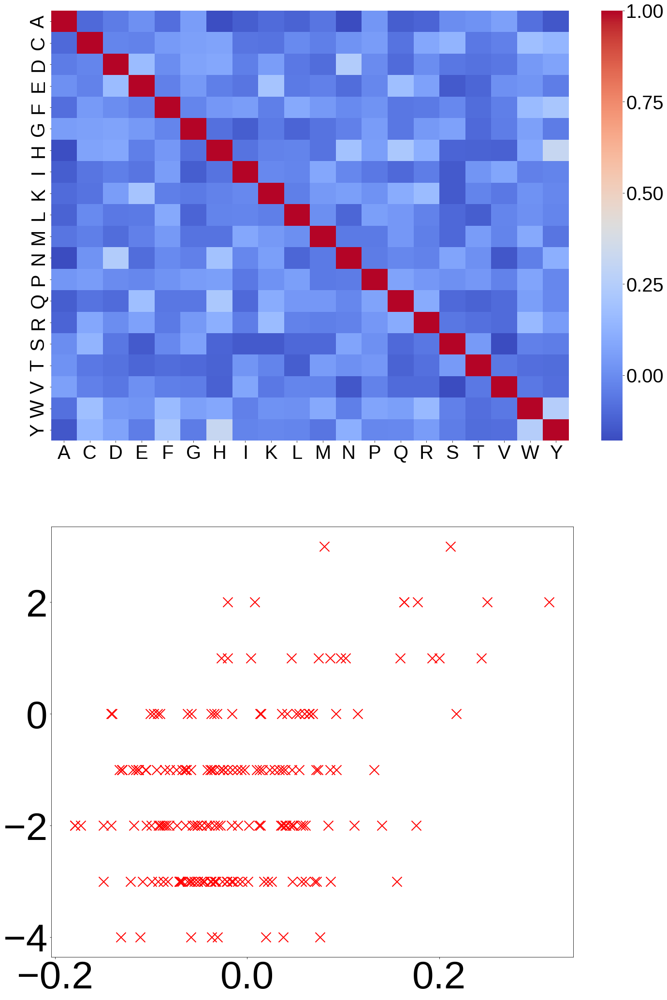

Pearson's correlation: 0.417
Prot Bert BFD


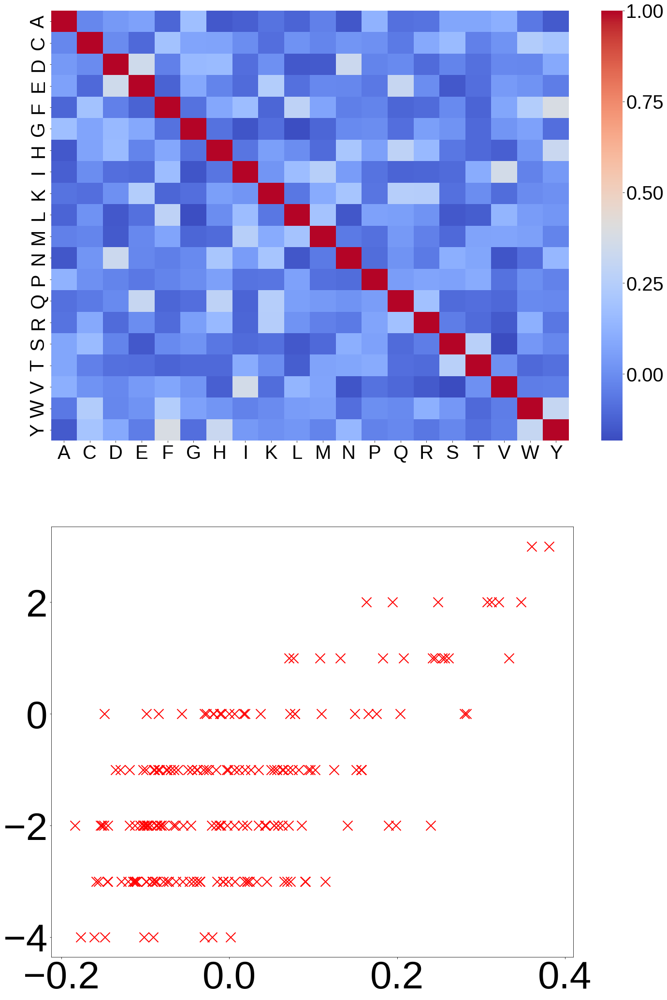

Pearson's correlation: 0.648
Prot T5 XL BFD


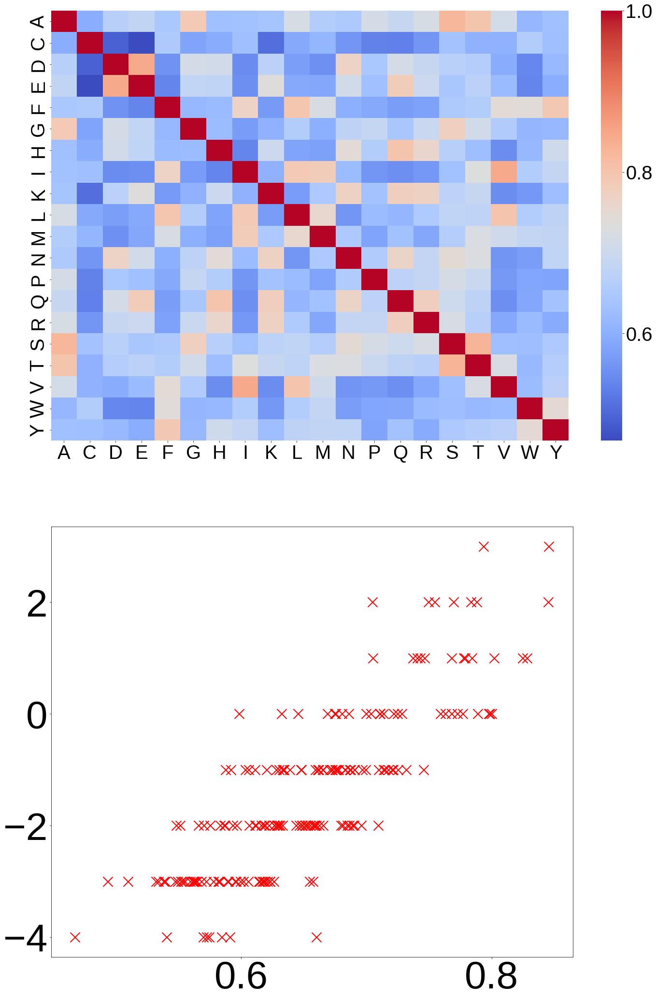

Pearson's correlation: 0.828
Prot XLNet


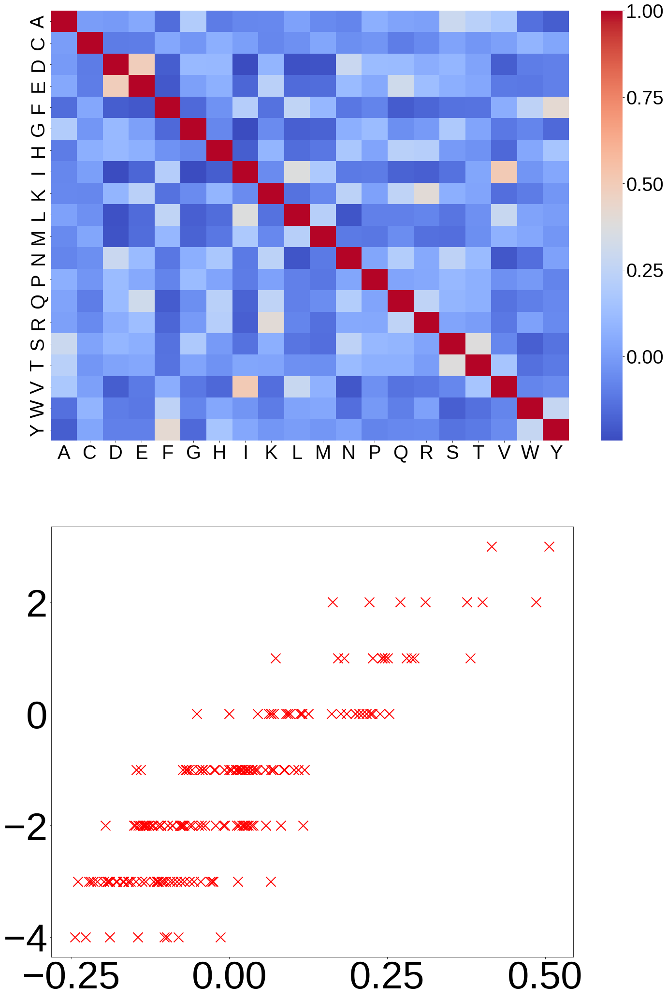

Pearson's correlation: 0.863
Prot Albert


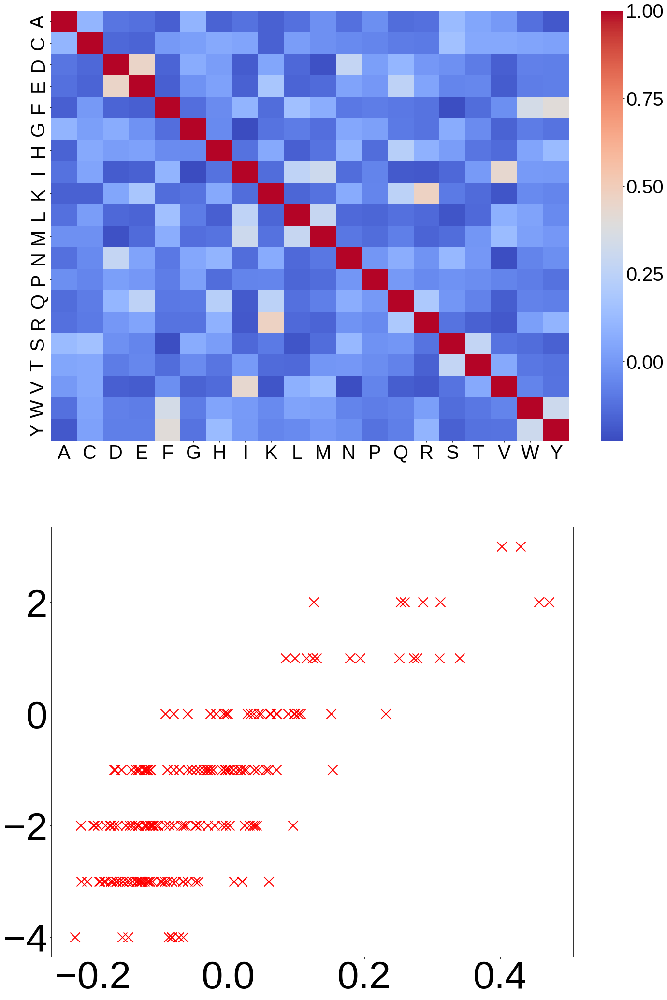

Pearson's correlation: 0.785
Prot GPT2


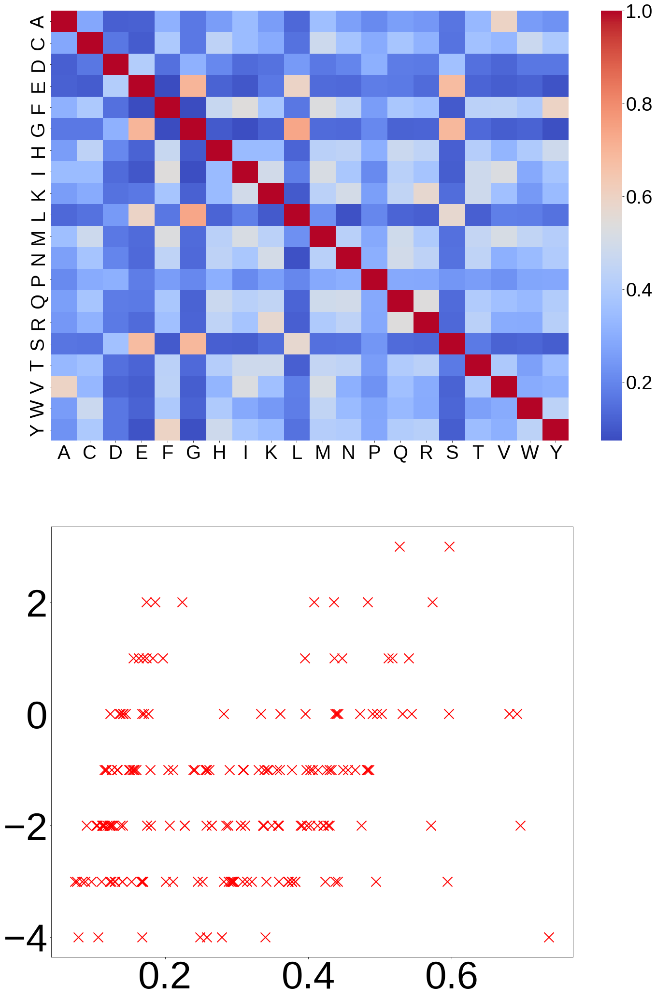

Pearson's correlation: 0.250
TAPE Bert


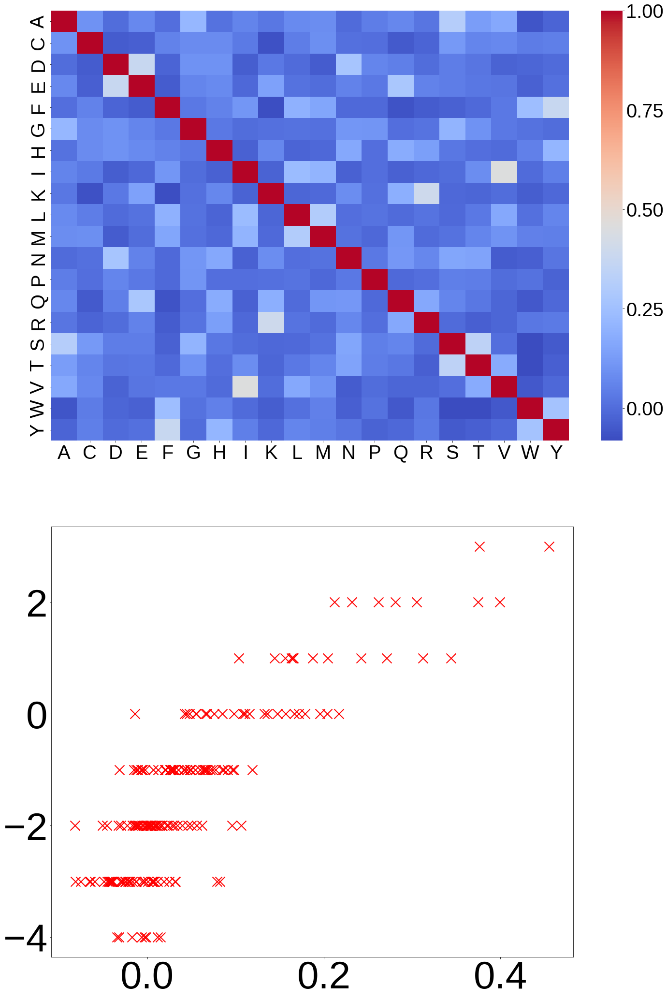

Pearson's correlation: 0.833


In [37]:
# plot embeddings and correlation for ProtBert
print("Prot Bert")
process_embeddings_and_plot(embeddings_matrix_protbert, amino_acids, amino_dict, blosum62_normalized_flat, "ProtBert")

# plot embeddings and correlation for ProtBertBFD
print("Prot Bert BFD")
process_embeddings_and_plot(embeddings_matrix_prot_bert_bfd, amino_acids, amino_dict, blosum62_normalized_flat, "ProtBertBFD")

# plot embeddings and correlation for ProtT5
print("Prot T5 XL BFD")
process_embeddings_and_plot(embeddings_matrix_prot_t5_xl_bfd, amino_acids, amino_dict, blosum62_normalized_flat, "ProtT5XLBFD")

# plot embeddings and correlation for ProtXLNet
print("Prot XLNet")
process_embeddings_and_plot(embeddings_matrix_prot_xlnet, amino_acids, amino_dict, blosum62_normalized_flat, "ProtXLNet")

# plot embeddings and correlation for ProtAlbert
print("Prot Albert")
process_embeddings_and_plot(embeddings_matrix_prot_albert, amino_acids, amino_dict, blosum62_normalized_flat, "ProtAlbert")

# plot embeddings and correlation for ProtGPT2
print("Prot GPT2")
process_embeddings_and_plot(embeddings_matrix_protgpt2, amino_acids, amino_dict, blosum62_normalized_flat, "ProtGPT2")

# plot embeddings and correlation for TAPE Bert
print("TAPE Bert")
process_embeddings_and_plot(embeddings_matrix_tape_bert, amino_acids, amino_dict, blosum62_normalized_flat, "TAPEBert")

#### Attention analysis

Processed 100 data pairs.
Processed 200 data pairs.
Processed 300 data pairs.
Processed 400 data pairs.
Processed 500 data pairs.
Processed 600 data pairs.
Processed 700 data pairs.
Processed 800 data pairs.
Processed 900 data pairs.
Processed 1000 data pairs.


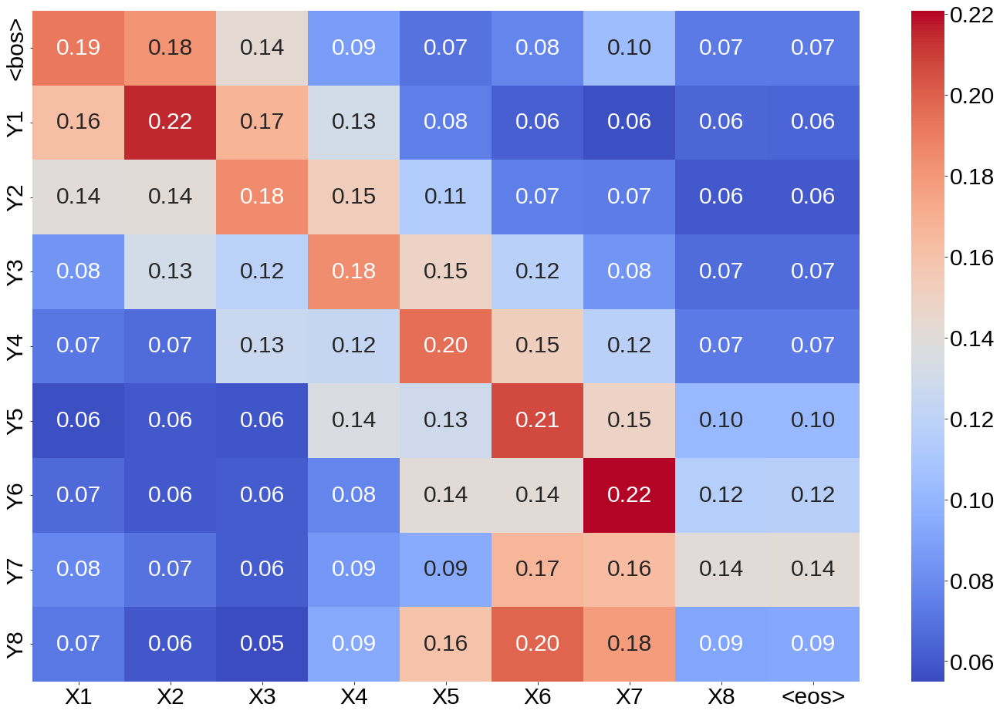

In [7]:
# load training data
train_dict = np.load('train_l8_anti/train_dict_fold0.npy', allow_pickle=True)
train_dict = train_dict.tolist()
train_list = []
for target, value_dict in train_dict.items():
    for comp, count in value_dict.items():
        train_list.append([target, comp, count])
train_array = np.array(train_list)

import numpy as np
import torch
import seaborn as sns
import matplotlib.pyplot as plt

# 1. Import the necessary libraries
import random

def plot_attention_heatmap(attention_matrix, encoder_text, decoder_text, title, save_path=None):
    plt.rcParams.update({
        'font.size': 30,
        'font.family': 'Liberation Sans',
        'lines.linewidth': 3,
    })
    plt.figure(figsize=(24, 16), facecolor=(1, 1, 1))
    sns.heatmap(attention_matrix, xticklabels=encoder_text, yticklabels=decoder_text, cmap="coolwarm", annot=True, fmt=".2f")
    # plt.xlabel("Encoder Sequence", fontsize=40)
    # plt.ylabel("Decoder Sequence", fontsize=40)
    # plt.title(title, fontsize=40)
    # plt.title(title)
    if save_path:
        plt.savefig(save_path, bbox_inches='tight')
    plt.show()

# 2. Modify the train_array to have 10,00 random samples
random_indices = np.random.choice(train_array.shape[0], 1000, replace=False)
train_array_random = train_array[random_indices]

# 3. Create a function to process a single data pair and return the average attention heatmap
def process_data_pair(model_use, task_target, dec_comple_peptide_pred, device):
    dec_prob, dec_attention_weight_seq = evaluate_single(model_use, task_target, dec_comple_peptide_pred, amino_dict, prediction_length + 2, device, save_attention_weights=True, print_info=False)
    decoder_encoder_attention_raw = [torch.unsqueeze(attention, dim=0) for attention in dec_attention_weight_seq[-1][1]]
    decoder_encoder_attention = [torch.tensor(np.delete(layer_attention.detach().numpy(), -1, 3)) for layer_attention in decoder_encoder_attention_raw]
    decoder_encoder_attention_avg = [torch.mean(layer_attention, dim=1) for layer_attention in decoder_encoder_attention]
    decoder_encoder_attention_blocks_avg = torch.mean(torch.stack(decoder_encoder_attention_avg, dim=0), dim=0)
    
    return decoder_encoder_attention_blocks_avg

# 4. Loop through the randomly selected data pairs, process them, and print the informative messages
attention_blocks_avg_list = []

for i, data_pair in enumerate(train_array_random):
    task_target, dec_comple_peptide_pred, _ = data_pair
    attention_blocks_avg = process_data_pair(model_use, task_target, dec_comple_peptide_pred, device)
    attention_blocks_avg_list.append(attention_blocks_avg)
    
    if (i + 1) % 100 == 0:
        print(f'Processed {i + 1} data pairs.')


encoder_text = ['X1', 'X2', 'X3', 'X4', 'X5', 'X6', 'X7', 'X8', '<eos>']
decoder_text = ['<bos>', 'Y1', 'Y2', 'Y3', 'Y4', 'Y5', 'Y6', 'Y7', 'Y8']
# 5. Calculate the average attention heatmap over all the 1,000 data pairs
final_attention_blocks_avg = torch.mean(torch.stack(attention_blocks_avg_list, dim=0), dim=0).squeeze()

# 6. Plot the final average attention heatmap
plot_attention_heatmap(final_attention_blocks_avg.detach().numpy(), encoder_text, decoder_text, 'Average Cross Attention Heatmap', save_path='model_evaluation/adobe_plots/avg_attention_heatmap.png')